# Multiple Linear Regression (Logistic Regression)
### Problem Statement:
The company markets its courses on several websites and search engines like Google. Once these people land on the website, they might browse the courses or fill up a form for the course or watch some videos. When these people fill up a form providing their email address or phone number, they are classified to be a lead. Moreover, the company also gets leads through past referrals. Once these leads are acquired, employees from the sales team start making calls, writing emails, etc. Through this process, some of the leads get converted while most do not. The typical lead conversion rate at X education is around 30%. 

Now, although X Education gets a lot of leads, its lead conversion rate is very poor.

The company wants to:

Know about the most promising leads (the leads that are most likely to convert into paying customers).

The company requires you to build a model wherein you need to assign a lead score to each of the leads such that the customers with higher lead score have a higher conversion chance and the customers with lower lead score have a lower conversion chance.

##### Business Goal:
Required to build a model wherein need to assign a lead score to each of the leads such that the customers with higher lead score have a higher conversion chance and the customers with lower lead score have a lower conversion chance.
The CEO, in particular, has given a ballpark of the target lead conversion rate to be around 80%.

#### Steps to Follow...

1. Reading and Understanding Data

2. Cleaning of the Dataset

3. Visualising the Data

4. Data Preparation

5. Splitting the Data into Training and Testing Sets

6. Feature Scaling

7. Building the Model

8. Residual Analysis of the train data

9. Making predictions using final model

10. Finding Optimal Cut-Off Point.

11. Predictions and Model evaluation on Test data

12. Assigning Lead Score


#### Calling various essential library functions

In [1]:
# Suppressing Warnings
import warnings
warnings.filterwarnings('ignore')


In [2]:
# Importing the required libraries
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

from scipy import stats
import statsmodels
import statsmodels.api as sm

import sklearn
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from statsmodels.stats.outliers_influence import variance_inflation_factor #Check for the VIF values of the feature variables. 
from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LogisticRegression
from sklearn import metrics
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.metrics import confusion_matrix
from sklearn.metrics import precision_score, recall_score
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import classification_report
from sklearn.neighbors import KNeighborsClassifier

%matplotlib inline


In [3]:
# To set the Row, Column and Width of the Dataframe to show on Jupyter Notebook
pd.set_option('display.max_rows', 10000)
pd.set_option('display.max_columns', 1000)
pd.set_option('display.width', 1000)


### Step 1: Importing and Reading the Data

In [4]:
# Importing all datasets
leads = pd.read_csv("F:/Upgrade/Course-2/Machine Learning-1/Module_10_Case Study/Lead+Scoring+Case+Study/Lead Scoring Assignment/Leads.csv")


In [5]:
# To check all the variables label
leads.head()


,Prospect ID,Lead Number,Lead Origin,Lead Source,Do Not Email,Do Not Call,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Last Activity,Country,Specialization,How did you hear about X Education,What is your current occupation,What matters most to you in choosing a course,Search,Magazine,Newspaper Article,X Education Forums,Newspaper,Digital Advertisement,Through Recommendations,Receive More Updates About Our Courses,Tags,Lead Quality,Update me on Supply Chain Content,Get updates on DM Content,Lead Profile,City,Asymmetrique Activity Index,Asymmetrique Profile Index,Asymmetrique Activity Score,Asymmetrique Profile Score,I agree to pay the amount through cheque,A free copy of Mastering The Interview,Last Notable Activity
0,7927b2df-8bba-4d29-b9a2-b6e0beafe620,660737,API,Olark Chat,No,No,0,0.0,0,0.0,Page Visited on Website,NaN,Select,Select,Unemployed,Better Career Prospects,No,No,No,No,No,No,No,No,Interested in other courses,Low in Relevance,No,No,Select,Select,02.Medium,02.Medium,15.0,15.0,No,No,Modified
1,2a272436-5132-4136-86fa-dcc88c88f482,660728,API,Organic Search,No,No,0,5.0,674,2.5,Email Opened,India,Select,Select,Unemployed,Better Career Prospects,No,No,No,No,No,No,No,No,Ringing,NaN,No,No,Select,Select,02.Medium,02.Medium,15.0,15.0,No,No,Email Opened
2,8cc8c611-a219-4f35-ad23-fdfd2656bd8a,660727,Landing Page Submission,Direct Traffic,No,No,1,2.0,1532,2.0,Email Opened,India,Business Administration,Select,Student,Better Career Prospects,No,No,No,No,No,No,No,No,Will revert after reading the email,Might be,No,No,Potential Lead,Mumbai,02.Medium,01.High,14.0,20.0,No,Yes,Email Opened
3,0cc2df48-7cf4-4e39-9de9-19797f9b38cc,660719,Landing Page Submission,Direct Traffic,No,No,0,1.0,305,1.0,Unreachable,India,Media and Advertising,Word Of Mouth,Unemployed,Better Career Prospects,No,No,No,No,No,No,No,No,Ringing,Not Sure,No,No,Select,Mumbai,02.Medium,01.High,13.0,17.0,No,No,Modified
4,3256f628-e534-4826-9d63-4a8b88782852,660681,Landing Page Submission,Google,No,No,1,2.0,1428,1.0,Converted to Lead,India,Select,Other,Unemployed,Better Career Prospects,No,No,No,No,No,No,No,No,Will revert after reading the email,Might be,No,No,Select,Mumbai,02.Medium,01.High,15.0,18.0,No,No,Modified


### Step 2: Inspecting the Dataframe   
Inspect the dataframe for dimensions, null-values, and summary of different numeric columns.

In [6]:
# To Check the dimensions of the dataframe
leads.shape


(9240, 37)

In [7]:
# To see the statistical aspects of the dataframe
leads.describe()


,Lead Number,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Asymmetrique Activity Score,Asymmetrique Profile Score
count,9240.000000,9240.000000,9103.000000,9240.000000,9103.000000,5022.000000,5022.000000
mean,617188.435606,0.385390,3.445238,487.698268,2.362820,14.306252,16.344883
std,23405.995698,0.486714,4.854853,548.021466,2.161418,1.386694,1.811395
min,579533.000000,0.000000,0.000000,0.000000,0.000000,7.000000,11.000000
25%,596484.500000,0.000000,1.000000,12.000000,1.000000,14.000000,15.000000
50%,615479.000000,0.000000,3.000000,248.000000,2.000000,14.000000,16.000000
75%,637387.250000,1.000000,5.000000,936.000000,3.000000,15.000000,18.000000
max,660737.000000,1.000000,251.000000,2272.000000,55.000000,18.000000,20.000000


In [8]:
# To see the type of each column
leads.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9240 entries, 0 to 9239
Data columns (total 37 columns):
 #   Column                                         Non-Null Count  Dtype  
---  ------                                         --------------  -----  
 0   Prospect ID                                    9240 non-null   object 
 1   Lead Number                                    9240 non-null   int64  
 2   Lead Origin                                    9240 non-null   object 
 3   Lead Source                                    9204 non-null   object 
 4   Do Not Email                                   9240 non-null   object 
 5   Do Not Call                                    9240 non-null   object 
 6   Converted                                      9240 non-null   int64  
 7   TotalVisits                                    9103 non-null   float64
 8   Total Time Spent on Website                    9240 non-null   int64  
 9   Page Views Per Visit                           9103 

In [9]:
# To check the null values of each column
leads.isnull().sum()


Prospect ID                                         0
Lead Number                                         0
Lead Origin                                         0
Lead Source                                        36
Do Not Email                                        0
Do Not Call                                         0
Converted                                           0
TotalVisits                                       137
Total Time Spent on Website                         0
Page Views Per Visit                              137
Last Activity                                     103
Country                                          2461
Specialization                                   1438
How did you hear about X Education               2207
What is your current occupation                  2690
What matters most to you in choosing a course    2709
Search                                              0
Magazine                                            0
Newspaper Article           

In [10]:
# Checking the percentage of missing values
leads_null_per = round(100*(leads.isnull().sum()/len(leads.index)), 2)
leads_null_per


Prospect ID                                       0.00
Lead Number                                       0.00
Lead Origin                                       0.00
Lead Source                                       0.39
Do Not Email                                      0.00
Do Not Call                                       0.00
Converted                                         0.00
TotalVisits                                       1.48
Total Time Spent on Website                       0.00
Page Views Per Visit                              1.48
Last Activity                                     1.11
Country                                          26.63
Specialization                                   15.56
How did you hear about X Education               23.89
What is your current occupation                  29.11
What matters most to you in choosing a course    29.32
Search                                            0.00
Magazine                                          0.00
Newspaper 

In [11]:
# To check any duplicate value in various columns
leads.duplicated().sum()


0

### Step 3: Data Cleaning

In [12]:
# To check number of columns which has Null values greater than 40%
len(leads_null_per[leads_null_per.values>=(40)])


5

In [13]:
# List all the columns which values is greater than and equal to 40%
leads_null_per_40 = list(leads_null_per[leads_null_per.values>=40].index)
leads_null_per_40


['Lead Quality',
 'Asymmetrique Activity Index',
 'Asymmetrique Profile Index',
 'Asymmetrique Activity Score',
 'Asymmetrique Profile Score']

In [14]:
# Drop all the values which values is greater than equal to 40%.
Leads_not_null = leads.drop(labels = leads_null_per_40, axis=1, inplace=True)


In [15]:
# To check the no. of rows and columns in the given dataframe 
leads.shape


(9240, 32)

In [16]:
# To check the null values of all the variables in the dataframe
leads.isnull().sum()


Prospect ID                                         0
Lead Number                                         0
Lead Origin                                         0
Lead Source                                        36
Do Not Email                                        0
Do Not Call                                         0
Converted                                           0
TotalVisits                                       137
Total Time Spent on Website                         0
Page Views Per Visit                              137
Last Activity                                     103
Country                                          2461
Specialization                                   1438
How did you hear about X Education               2207
What is your current occupation                  2690
What matters most to you in choosing a course    2709
Search                                              0
Magazine                                            0
Newspaper Article           

In [17]:
# Checking the percentage of missing values
round(100*(leads.isnull().sum()/len(leads.index)), 2)


Prospect ID                                       0.00
Lead Number                                       0.00
Lead Origin                                       0.00
Lead Source                                       0.39
Do Not Email                                      0.00
Do Not Call                                       0.00
Converted                                         0.00
TotalVisits                                       1.48
Total Time Spent on Website                       0.00
Page Views Per Visit                              1.48
Last Activity                                     1.11
Country                                          26.63
Specialization                                   15.56
How did you hear about X Education               23.89
What is your current occupation                  29.11
What matters most to you in choosing a course    29.32
Search                                            0.00
Magazine                                          0.00
Newspaper 

In [18]:
# To check the details of the Null column with all the rows
leads[leads['TotalVisits'].isnull()]


,Prospect ID,Lead Number,Lead Origin,Lead Source,Do Not Email,Do Not Call,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Last Activity,Country,Specialization,How did you hear about X Education,What is your current occupation,What matters most to you in choosing a course,Search,Magazine,Newspaper Article,X Education Forums,Newspaper,Digital Advertisement,Through Recommendations,Receive More Updates About Our Courses,Tags,Update me on Supply Chain Content,Get updates on DM Content,Lead Profile,City,I agree to pay the amount through cheque,A free copy of Mastering The Interview,Last Notable Activity
77,895d4905-f534-4f18-915b-8d239a72b5dc,659722,Lead Add Form,Welingak Website,No,No,1,NaN,1096,NaN,NaN,NaN,Select,Select,Unemployed,Better Career Prospects,No,No,No,No,No,No,No,No,NaN,No,No,Select,Select,No,No,Modified
79,3a0ce10f-d2c1-4213-a2bc-4f97bcd29699,659710,Lead Add Form,Reference,No,No,1,NaN,705,NaN,NaN,NaN,Hospitality Management,Select,Working Professional,Better Career Prospects,No,No,No,No,No,No,No,No,Will revert after reading the email,No,No,Potential Lead,Thane & Outskirts,No,No,Modified
81,277ad6a6-4565-4a18-a1ff-e46e03f22663,659705,Lead Add Form,Welingak Website,No,No,1,NaN,346,NaN,NaN,NaN,Select,Select,Unemployed,Better Career Prospects,No,No,No,No,No,No,No,No,NaN,No,No,Select,Select,No,No,Modified
88,68f496c2-0073-470f-9c3c-7fb48f060ce5,659631,Lead Add Form,Reference,No,No,1,NaN,1007,NaN,NaN,NaN,Human Resource Management,Select,Unemployed,Better Career Prospects,No,No,No,No,No,No,No,No,Closed by Horizzon,No,No,Lateral Student,Mumbai,No,No,Modified
120,144807db-2895-4002-b52e-3eda79c22395,659283,Lead Add Form,Reference,No,No,1,NaN,1111,NaN,NaN,NaN,Marketing Management,Select,Working Professional,Better Career Prospects,No,No,No,No,No,No,No,No,Closed by Horizzon,No,No,Potential Lead,Other Cities,No,No,Modified
133,63ebde80-a465-4cdc-ab5a-5e880a7138b0,659158,Lead Add Form,Reference,No,No,1,NaN,986,NaN,NaN,NaN,Marketing Management,Select,Working Professional,Better Career Prospects,No,No,No,No,No,No,No,No,Closed by Horizzon,No,No,Potential Lead,Select,No,No,Modified
134,0298b9a5-fedb-408b-a284-2d357583600f,659153,Lead Add Form,Welingak Website,No,No,1,NaN,889,NaN,NaN,NaN,Select,Select,Unemployed,Better Career Prospects,No,No,No,No,No,No,No,No,NaN,No,No,Select,Select,No,No,Modified
177,3b74e995-4407-44de-9e59-622afb514261,658648,Lead Add Form,Welingak Website,No,No,1,NaN,1240,NaN,NaN,NaN,Select,Select,Unemployed,Better Career Prospects,No,No,No,No,No,No,No,No,Closed by Horizzon,No,No,Potential Lead,Mumbai,No,No,Modified
179,1730b5e8-e435-41c6-9082-b9c98976bd16,658627,Lead Add Form,Welingak Website,No,No,1,NaN,458,NaN,NaN,NaN,Select,Select,Unemployed,Better Career Prospects,No,No,No,No,No,No,No,No,NaN,No,No,Select,Select,No,No,Modified
180,db2dc4b5-f603-4818-9b0c-0435923a4cd8,658623,Lead Add Form,Welingak Website,No,No,1,NaN,1060,NaN,NaN,NaN,Select,Select,Unemployed,Better Career Prospects,No,No,No,No,No,No,No,No,NaN,No,No,Select,Select,No,No,Modified


In [19]:
# TotalVisits column has very minimum Null values, therefore those rows can be removed
leads = leads[~leads.TotalVisits.isnull()]


In [20]:
# To recheck Null values
leads['TotalVisits'].isnull().sum()


0

In [21]:
# To check Null values
leads['Page Views Per Visit'].isnull().sum()


0

In [22]:
# To check Null values
leads['Last Activity'].isnull().sum()


0

In [23]:
# To check bull values of all the columns
leads.isnull().sum()


Prospect ID                                         0
Lead Number                                         0
Lead Origin                                         0
Lead Source                                        29
Do Not Email                                        0
Do Not Call                                         0
Converted                                           0
TotalVisits                                         0
Total Time Spent on Website                         0
Page Views Per Visit                                0
Last Activity                                       0
Country                                          2324
Specialization                                   1431
How did you hear about X Education               2200
What is your current occupation                  2683
What matters most to you in choosing a course    2702
Search                                              0
Magazine                                            0
Newspaper Article           

In [24]:
# Checking the percentage of missing values
round(100*(leads.isnull().sum()/len(leads.index)), 2)


Prospect ID                                       0.00
Lead Number                                       0.00
Lead Origin                                       0.00
Lead Source                                       0.32
Do Not Email                                      0.00
Do Not Call                                       0.00
Converted                                         0.00
TotalVisits                                       0.00
Total Time Spent on Website                       0.00
Page Views Per Visit                              0.00
Last Activity                                     0.00
Country                                          25.53
Specialization                                   15.72
How did you hear about X Education               24.17
What is your current occupation                  29.47
What matters most to you in choosing a course    29.68
Search                                            0.00
Magazine                                          0.00
Newspaper 

In [25]:
# To do value counts 
leads['Lead Source'].value_counts(dropna=False)


Google               2868
Direct Traffic       2543
Olark Chat           1753
Organic Search       1154
Reference             443
Welingak Website      129
Referral Sites        125
Facebook               31
NaN                    29
bing                    6
google                  5
Click2call              4
Social Media            2
Live Chat               2
Press_Release           2
testone                 1
blog                    1
NC_EDM                  1
welearnblog_Home        1
WeLearn                 1
Pay per Click Ads       1
youtubechannel          1
Name: Lead Source, dtype: int64

In [26]:
# Lead Source column has very minimum Null values, therefore those rows can be removed
leads = leads[~leads['Lead Source'].isnull()]


In [27]:
# To recheck null values
leads['Lead Source'].isnull().sum()


0

In [28]:
# Checking the percentage of missing values
round(100*(leads.isnull().sum()/len(leads.index)), 2)


Prospect ID                                       0.00
Lead Number                                       0.00
Lead Origin                                       0.00
Lead Source                                       0.00
Do Not Email                                      0.00
Do Not Call                                       0.00
Converted                                         0.00
TotalVisits                                       0.00
Total Time Spent on Website                       0.00
Page Views Per Visit                              0.00
Last Activity                                     0.00
Country                                          25.30
Specialization                                   15.77
How did you hear about X Education               24.25
What is your current occupation                  29.57
What matters most to you in choosing a course    29.78
Search                                            0.00
Magazine                                          0.00
Newspaper 

In [29]:
# To check value counts of the respective variable
leads['Country'].value_counts(dropna=False)


India                   6491
NaN                     2296
United States             69
United Arab Emirates      53
Singapore                 24
Saudi Arabia              21
United Kingdom            15
Australia                 13
Qatar                     10
Hong Kong                  7
Bahrain                    7
France                     6
Oman                       6
unknown                    5
South Africa               4
Kuwait                     4
Canada                     4
Nigeria                    4
Germany                    4
Sweden                     3
Uganda                     2
Asia/Pacific Region        2
Netherlands                2
Bangladesh                 2
Ghana                      2
Belgium                    2
Italy                      2
China                      2
Philippines                2
Russia                     1
Vietnam                    1
Switzerland                1
Tanzania                   1
Kenya                      1
Indonesia     

In [30]:
# To get string value which occur maximum in the column
Country_M = leads['Country'].mode()[0]  
Country_M


'India'

In [31]:
# Replace or fill null values of the respective column with the maximum occured value in the column.
leads['Country'] = leads['Country'].fillna(Country_M)


In [32]:
# To recalculate the null value of the variable
leads['Country'].isnull().sum()


0

In [33]:
# To do value counts
leads['Specialization'].value_counts(dropna=False)


Select                               1851
NaN                                  1431
Finance Management                    959
Human Resource Management             837
Marketing Management                  823
Operations Management                 499
Business Administration               399
IT Projects Management                366
Supply Chain Management               346
Banking, Investment And Insurance     335
Media and Advertising                 202
Travel and Tourism                    202
International Business                176
Healthcare Management                 156
Hospitality Management                111
E-COMMERCE                            111
Retail Management                     100
Rural and Agribusiness                 73
E-Business                             57
Services Excellence                    40
Name: Specialization, dtype: int64

In [34]:
# To replace 'Select' from 'Other' another highest value of the respective column
leads['Specialization'] = leads['Specialization'].replace(['Select'], 'Others')


In [35]:
# To get string value which occur maximum in the column
Specialization_M = leads['Specialization'].mode()[0]  
Specialization_M


'Others'

In [36]:
# Replace or fill null values of the respective column with the maximum occured value in the column.
leads['Specialization'] = leads['Specialization'].fillna(Specialization_M)


In [37]:
# To recheck null values of the column
leads['Specialization'].isnull().sum()


0

In [38]:
# To check value counts of the respective variable
leads['City'].value_counts(dropna=False)


Mumbai                         3177
Select                         2156
NaN                            1419
Thane & Outskirts               745
Other Cities                    680
Other Cities of Maharashtra     446
Other Metro Cities              377
Tier II Cities                   74
Name: City, dtype: int64

In [39]:
# To get string value which occur maximum in the column
City_M = leads['City'].mode()[0]  
City_M


'Mumbai'

In [40]:
# Replace or fill null values of the respective column with the maximum occured value in the column.
leads['City'] = leads['City'].fillna(City_M)


In [41]:
# To replace 'Select' from 'Other' another highest value of the respective column
leads['City'] = leads['City'].replace(['Select'], 'Not Specified')


In [42]:
# To check value counts of the respective variable
leads['City'].value_counts()


Mumbai                         4596
Not Specified                  2156
Thane & Outskirts               745
Other Cities                    680
Other Cities of Maharashtra     446
Other Metro Cities              377
Tier II Cities                   74
Name: City, dtype: int64

In [43]:
# Checking the percentage of missing values
round(100*(leads.isnull().sum()/len(leads.index)), 2)


Prospect ID                                       0.00
Lead Number                                       0.00
Lead Origin                                       0.00
Lead Source                                       0.00
Do Not Email                                      0.00
Do Not Call                                       0.00
Converted                                         0.00
TotalVisits                                       0.00
Total Time Spent on Website                       0.00
Page Views Per Visit                              0.00
Last Activity                                     0.00
Country                                           0.00
Specialization                                    0.00
How did you hear about X Education               24.25
What is your current occupation                  29.57
What matters most to you in choosing a course    29.78
Search                                            0.00
Magazine                                          0.00
Newspaper 

In [44]:
# To check value counts of the respective variable
leads['Tags'].value_counts(dropna=False)


NaN                                                  3327
Will revert after reading the email                  2016
Ringing                                              1187
Interested in other courses                           509
Already a student                                     465
Closed by Horizzon                                    301
switched off                                          240
Busy                                                  185
Lost to EINS                                          172
Not doing further education                           145
Interested  in full time MBA                          116
Graduation in progress                                111
invalid number                                         83
Diploma holder (Not Eligible)                          63
wrong number given                                     47
opp hangup                                             33
number not provided                                    25
in touch with 

In [45]:
# To replace 'NaN' from 'Not_Clear' of the respective column
leads['Tags'] = leads['Tags'].replace(np.NaN, 'Not_Mentioned')


###### 'NaN' replaced with 'Not_Mentioned'  to keep other variables as it is.


In [46]:
# To check value counts of the respective variable
leads['Tags'].value_counts(dropna=False)


Not_Mentioned                                        3327
Will revert after reading the email                  2016
Ringing                                              1187
Interested in other courses                           509
Already a student                                     465
Closed by Horizzon                                    301
switched off                                          240
Busy                                                  185
Lost to EINS                                          172
Not doing further education                           145
Interested  in full time MBA                          116
Graduation in progress                                111
invalid number                                         83
Diploma holder (Not Eligible)                          63
wrong number given                                     47
opp hangup                                             33
number not provided                                    25
in touch with 

In [47]:
# To check value counts of the respective variable
leads['What is your current occupation'].value_counts(dropna=False)


Unemployed              5476
NaN                     2683
Working Professional     677
Student                  206
Other                     15
Housewife                  9
Businessman                8
Name: What is your current occupation, dtype: int64

In [48]:
# To get string value which occur maximum in the column
WCO_M = leads['What is your current occupation'].mode()[0]  
WCO_M


'Unemployed'

In [49]:
# Replace or fill null values of the respective column with the maximum occured value in the column.
leads['What is your current occupation'] = leads['What is your current occupation'].fillna(WCO_M)


In [50]:
# To check Null values
leads['What is your current occupation'].isnull().sum()


0

In [51]:
# To check value counts of the respective variable
leads['What matters most to you in choosing a course'].value_counts(dropna=False)


Better Career Prospects      6370
NaN                          2702
Flexibility & Convenience       1
Other                           1
Name: What matters most to you in choosing a course, dtype: int64

In [52]:
# To get string value which occur maximum in the column
What_M = leads['What matters most to you in choosing a course'].mode()[0]  
What_M


'Better Career Prospects'

In [53]:
# Replace or fill null values of the respective column with the maximum occured value in the column.
leads['What matters most to you in choosing a course'] = leads['What matters most to you in choosing a course'].fillna(What_M)


In [54]:
# To check Null values
leads['What matters most to you in choosing a course'].isnull().sum()


0

In [55]:
# To check value counts of the respective variable
leads['What matters most to you in choosing a course'].value_counts(dropna=False)


Better Career Prospects      9072
Flexibility & Convenience       1
Other                           1
Name: What matters most to you in choosing a course, dtype: int64

In [56]:
# Checking the percentage of missing values
round(100*(leads.isnull().sum()/len(leads.index)), 2)


Prospect ID                                       0.00
Lead Number                                       0.00
Lead Origin                                       0.00
Lead Source                                       0.00
Do Not Email                                      0.00
Do Not Call                                       0.00
Converted                                         0.00
TotalVisits                                       0.00
Total Time Spent on Website                       0.00
Page Views Per Visit                              0.00
Last Activity                                     0.00
Country                                           0.00
Specialization                                    0.00
How did you hear about X Education               24.25
What is your current occupation                   0.00
What matters most to you in choosing a course     0.00
Search                                            0.00
Magazine                                          0.00
Newspaper 

In [57]:
# To check value counts of the respective variable
leads['How did you hear about X Education'].value_counts(dropna=False)


Select                   4886
NaN                      2200
Online Search             808
Word Of Mouth             347
Student of SomeSchool     310
Other                     186
Multiple Sources          152
Advertisements             70
Social Media               66
Email                      26
SMS                        23
Name: How did you hear about X Education, dtype: int64

In [58]:
# Replace 'Not_Clear' with 'in touch with EINS' of the respective column
leads['How did you hear about X Education'] = leads['How did you hear about X Education'].replace('Select', np.NaN)


In [59]:
# To check value counts of the respective variable
leads['How did you hear about X Education'].value_counts(dropna=False)


NaN                      7086
Online Search             808
Word Of Mouth             347
Student of SomeSchool     310
Other                     186
Multiple Sources          152
Advertisements             70
Social Media               66
Email                      26
SMS                        23
Name: How did you hear about X Education, dtype: int64

In [60]:
# To check value counts of the respective variable
leads['Lead Profile'].value_counts(dropna=False)


Select                         4055
NaN                            2702
Potential Lead                 1554
Other Leads                     482
Student of SomeSchool           240
Lateral Student                  21
Dual Specialization Student      20
Name: Lead Profile, dtype: int64

In [61]:
# Replace 'Select' with 'NaN' of the respective column
leads['Lead Profile'] = leads['Lead Profile'].replace('Select', np.NaN)


In [62]:
# Checking the percentage of missing values
round(100*(leads.isnull().sum()/len(leads.index)), 2)


Prospect ID                                       0.00
Lead Number                                       0.00
Lead Origin                                       0.00
Lead Source                                       0.00
Do Not Email                                      0.00
Do Not Call                                       0.00
Converted                                         0.00
TotalVisits                                       0.00
Total Time Spent on Website                       0.00
Page Views Per Visit                              0.00
Last Activity                                     0.00
Country                                           0.00
Specialization                                    0.00
How did you hear about X Education               78.09
What is your current occupation                   0.00
What matters most to you in choosing a course     0.00
Search                                            0.00
Magazine                                          0.00
Newspaper 

In [63]:
# To check value counts of the respective variable
leads['What matters most to you in choosing a course'].value_counts(dropna=False)


Better Career Prospects      9072
Flexibility & Convenience       1
Other                           1
Name: What matters most to you in choosing a course, dtype: int64

##### From the above % calculations two variables has more than 70% NaN, and the variable which has only one variable which has value more than 90%, therefore better to drop them. Also Need to drop few more useless columns.
- 1. How did you hear about X Education
- 2. Lead Profile
- 3. What matters most to you in choosing a course 
- 4. Lead Number


In [64]:
# To check no. of columns
leads.columns


Index(['Prospect ID', 'Lead Number', 'Lead Origin', 'Lead Source', 'Do Not Email', 'Do Not Call', 'Converted', 'TotalVisits', 'Total Time Spent on Website', 'Page Views Per Visit', 'Last Activity', 'Country', 'Specialization', 'How did you hear about X Education', 'What is your current occupation', 'What matters most to you in choosing a course', 'Search', 'Magazine', 'Newspaper Article', 'X Education Forums', 'Newspaper', 'Digital Advertisement', 'Through Recommendations', 'Receive More Updates About Our Courses', 'Tags', 'Update me on Supply Chain Content', 'Get updates on DM Content', 'Lead Profile', 'City', 'I agree to pay the amount through cheque', 'A free copy of Mastering The Interview', 'Last Notable Activity'], dtype='object')

In [65]:
# To drop higher Null values columns
leads.drop(['How did you hear about X Education', 'Lead Profile', 'What matters most to you in choosing a course', 'Lead Number'], axis=1, inplace=True)


In [66]:
# To check Null values
leads.isnull().sum()


Prospect ID                                 0
Lead Origin                                 0
Lead Source                                 0
Do Not Email                                0
Do Not Call                                 0
Converted                                   0
TotalVisits                                 0
Total Time Spent on Website                 0
Page Views Per Visit                        0
Last Activity                               0
Country                                     0
Specialization                              0
What is your current occupation             0
Search                                      0
Magazine                                    0
Newspaper Article                           0
X Education Forums                          0
Newspaper                                   0
Digital Advertisement                       0
Through Recommendations                     0
Receive More Updates About Our Courses      0
Tags                              

In [67]:
# To check the shape
leads.shape


(9074, 28)

In [68]:
# To check the variables
leads.head()


,Prospect ID,Lead Origin,Lead Source,Do Not Email,Do Not Call,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Last Activity,Country,Specialization,What is your current occupation,Search,Magazine,Newspaper Article,X Education Forums,Newspaper,Digital Advertisement,Through Recommendations,Receive More Updates About Our Courses,Tags,Update me on Supply Chain Content,Get updates on DM Content,City,I agree to pay the amount through cheque,A free copy of Mastering The Interview,Last Notable Activity
0,7927b2df-8bba-4d29-b9a2-b6e0beafe620,API,Olark Chat,No,No,0,0.0,0,0.0,Page Visited on Website,India,Others,Unemployed,No,No,No,No,No,No,No,No,Interested in other courses,No,No,Not Specified,No,No,Modified
1,2a272436-5132-4136-86fa-dcc88c88f482,API,Organic Search,No,No,0,5.0,674,2.5,Email Opened,India,Others,Unemployed,No,No,No,No,No,No,No,No,Ringing,No,No,Not Specified,No,No,Email Opened
2,8cc8c611-a219-4f35-ad23-fdfd2656bd8a,Landing Page Submission,Direct Traffic,No,No,1,2.0,1532,2.0,Email Opened,India,Business Administration,Student,No,No,No,No,No,No,No,No,Will revert after reading the email,No,No,Mumbai,No,Yes,Email Opened
3,0cc2df48-7cf4-4e39-9de9-19797f9b38cc,Landing Page Submission,Direct Traffic,No,No,0,1.0,305,1.0,Unreachable,India,Media and Advertising,Unemployed,No,No,No,No,No,No,No,No,Ringing,No,No,Mumbai,No,No,Modified
4,3256f628-e534-4826-9d63-4a8b88782852,Landing Page Submission,Google,No,No,1,2.0,1428,1.0,Converted to Lead,India,Others,Unemployed,No,No,No,No,No,No,No,No,Will revert after reading the email,No,No,Mumbai,No,No,Modified


#### Seperate Converted and Non-Converted leads and analyse variables

In [69]:
# To check whether how many are the Non-converted leads 
leads_non_converted = leads[leads.Converted == 0]
leads_non_converted.head()


,Prospect ID,Lead Origin,Lead Source,Do Not Email,Do Not Call,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Last Activity,Country,Specialization,What is your current occupation,Search,Magazine,Newspaper Article,X Education Forums,Newspaper,Digital Advertisement,Through Recommendations,Receive More Updates About Our Courses,Tags,Update me on Supply Chain Content,Get updates on DM Content,City,I agree to pay the amount through cheque,A free copy of Mastering The Interview,Last Notable Activity
0,7927b2df-8bba-4d29-b9a2-b6e0beafe620,API,Olark Chat,No,No,0,0.0,0,0.0,Page Visited on Website,India,Others,Unemployed,No,No,No,No,No,No,No,No,Interested in other courses,No,No,Not Specified,No,No,Modified
1,2a272436-5132-4136-86fa-dcc88c88f482,API,Organic Search,No,No,0,5.0,674,2.5,Email Opened,India,Others,Unemployed,No,No,No,No,No,No,No,No,Ringing,No,No,Not Specified,No,No,Email Opened
3,0cc2df48-7cf4-4e39-9de9-19797f9b38cc,Landing Page Submission,Direct Traffic,No,No,0,1.0,305,1.0,Unreachable,India,Media and Advertising,Unemployed,No,No,No,No,No,No,No,No,Ringing,No,No,Mumbai,No,No,Modified
5,2058ef08-2858-443e-a01f-a9237db2f5ce,API,Olark Chat,No,No,0,0.0,0,0.0,Olark Chat Conversation,India,Others,Unemployed,No,No,No,No,No,No,No,No,Not_Mentioned,No,No,Mumbai,No,No,Modified
7,20ef72a2-fb3b-45e0-924e-551c5fa59095,API,Olark Chat,No,No,0,0.0,0,0.0,Olark Chat Conversation,India,Others,Unemployed,No,No,No,No,No,No,No,No,Not_Mentioned,No,No,Mumbai,No,No,Modified


In [70]:
# To check whether how many are the Converted leads 
leads_converted = leads[leads.Converted == 1]
leads_converted.head()


,Prospect ID,Lead Origin,Lead Source,Do Not Email,Do Not Call,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Last Activity,Country,Specialization,What is your current occupation,Search,Magazine,Newspaper Article,X Education Forums,Newspaper,Digital Advertisement,Through Recommendations,Receive More Updates About Our Courses,Tags,Update me on Supply Chain Content,Get updates on DM Content,City,I agree to pay the amount through cheque,A free copy of Mastering The Interview,Last Notable Activity
2,8cc8c611-a219-4f35-ad23-fdfd2656bd8a,Landing Page Submission,Direct Traffic,No,No,1,2.0,1532,2.00,Email Opened,India,Business Administration,Student,No,No,No,No,No,No,No,No,Will revert after reading the email,No,No,Mumbai,No,Yes,Email Opened
4,3256f628-e534-4826-9d63-4a8b88782852,Landing Page Submission,Google,No,No,1,2.0,1428,1.00,Converted to Lead,India,Others,Unemployed,No,No,No,No,No,No,No,No,Will revert after reading the email,No,No,Mumbai,No,No,Modified
6,9fae7df4-169d-489b-afe4-0f3d752542ed,Landing Page Submission,Google,No,No,1,2.0,1640,2.00,Email Opened,India,Supply Chain Management,Unemployed,No,No,No,No,No,No,No,No,Will revert after reading the email,No,No,Mumbai,No,No,Modified
10,2a369e35-ca95-4ca9-9e4f-9d27175aa320,Landing Page Submission,Organic Search,No,No,1,8.0,1351,8.00,Email Opened,India,Travel and Tourism,Unemployed,No,No,No,No,No,No,No,No,Will revert after reading the email,No,No,Other Metro Cities,No,Yes,Email Opened
11,9bc8ce93-6144-49e0-9f9d-080fc980f83c,Landing Page Submission,Direct Traffic,No,No,1,8.0,1343,2.67,Page Visited on Website,India,Human Resource Management,Unemployed,No,No,No,No,No,No,No,No,Lost to EINS,No,No,Thane & Outskirts,No,Yes,Page Visited on Website


In [71]:
# To check shape of the dataframe
leads_non_converted.shape


(5639, 28)

In [72]:
# To check shape of the dataframe
leads_converted.shape


(3435, 28)

In [73]:
# To get information about variables
leads_non_converted.info()


<class 'pandas.core.frame.DataFrame'>
Int64Index: 5639 entries, 0 to 9237
Data columns (total 28 columns):
 #   Column                                    Non-Null Count  Dtype  
---  ------                                    --------------  -----  
 0   Prospect ID                               5639 non-null   object 
 1   Lead Origin                               5639 non-null   object 
 2   Lead Source                               5639 non-null   object 
 3   Do Not Email                              5639 non-null   object 
 4   Do Not Call                               5639 non-null   object 
 5   Converted                                 5639 non-null   int64  
 6   TotalVisits                               5639 non-null   float64
 7   Total Time Spent on Website               5639 non-null   int64  
 8   Page Views Per Visit                      5639 non-null   float64
 9   Last Activity                             5639 non-null   object 
 10  Country                             

In [74]:
# To get information about variables
leads_converted.info()


<class 'pandas.core.frame.DataFrame'>
Int64Index: 3435 entries, 2 to 9239
Data columns (total 28 columns):
 #   Column                                    Non-Null Count  Dtype  
---  ------                                    --------------  -----  
 0   Prospect ID                               3435 non-null   object 
 1   Lead Origin                               3435 non-null   object 
 2   Lead Source                               3435 non-null   object 
 3   Do Not Email                              3435 non-null   object 
 4   Do Not Call                               3435 non-null   object 
 5   Converted                                 3435 non-null   int64  
 6   TotalVisits                               3435 non-null   float64
 7   Total Time Spent on Website               3435 non-null   int64  
 8   Page Views Per Visit                      3435 non-null   float64
 9   Last Activity                             3435 non-null   object 
 10  Country                             

In [75]:
# To check % imbalance between these two categories of leads (converted and non-converted)
round(len(leads_non_converted)/len(leads_converted),2)


1.64

In [76]:
# To check the % of Data that has Converted leads (Values = 1):
Converted_Per = round(((sum(leads.Converted == 1)/len(leads['Converted'].index))*100),2)
Converted_Per


37.86

In [77]:
# To check the % of Data that has Non_Converted leads (Values = 0):
Non_Converted_Per = round(((sum(leads.Converted == 0)/len(leads['Converted'].index))*100),2)
Non_Converted_Per


62.14

##### Inferences
- As per the above results of % calculations of Non-Converted and Converted leads, the Non-converted leads are more than the converted leads.
- The converted leads are nearly 38% only. 

#### To analyze other object variables.

In [78]:
# To do vale counts on the respective column
leads['Lead Origin'].value_counts()


Landing Page Submission    4885
API                        3578
Lead Add Form               581
Lead Import                  30
Name: Lead Origin, dtype: int64

In [79]:
# To do vale counts on the respective column
leads['Last Activity'].value_counts()


Email Opened                    3432
SMS Sent                        2716
Olark Chat Conversation          972
Page Visited on Website          640
Converted to Lead                428
Email Bounced                    312
Email Link Clicked               267
Form Submitted on Website        116
Unreachable                       90
Unsubscribed                      59
Had a Phone Conversation          25
View in browser link Clicked       6
Approached upfront                 5
Email Marked Spam                  2
Email Received                     2
Visited Booth in Tradeshow         1
Resubscribed to emails             1
Name: Last Activity, dtype: int64

In [80]:
# To do vale counts on the respective column
leads['Last Notable Activity'].value_counts()


Modified                        3267
Email Opened                    2823
SMS Sent                        2152
Page Visited on Website          318
Olark Chat Conversation          183
Email Link Clicked               173
Email Bounced                     60
Unsubscribed                      45
Unreachable                       32
Had a Phone Conversation          14
Email Marked Spam                  2
Form Submitted on Website          1
View in browser link Clicked       1
Email Received                     1
Approached upfront                 1
Resubscribed to emails             1
Name: Last Notable Activity, dtype: int64

#### Analyse Yes/No variables

In [81]:
# To do vale counts on the respective column
leads['Do Not Email'].value_counts()


No     8358
Yes     716
Name: Do Not Email, dtype: int64

In [82]:
# To do vale counts on the respective column
leads['Do Not Call'].value_counts()


No     9072
Yes       2
Name: Do Not Call, dtype: int64

In [83]:
# To do vale counts on the respective column
leads['Search'].value_counts()


No     9060
Yes      14
Name: Search, dtype: int64

In [84]:
# To do vale counts on the respective column
leads['Magazine'].value_counts()


No    9074
Name: Magazine, dtype: int64

In [85]:
# To do vale counts on the respective column
leads['Newspaper Article'].value_counts()


No     9072
Yes       2
Name: Newspaper Article, dtype: int64

In [86]:
# To do vale counts on the respective column
leads['X Education Forums'].value_counts()


No     9073
Yes       1
Name: X Education Forums, dtype: int64

In [87]:
# To do vale counts on the respective column
leads['Newspaper'].value_counts()


No     9073
Yes       1
Name: Newspaper, dtype: int64

In [88]:
# To do vale counts on the respective column
leads['Digital Advertisement'].value_counts()


No     9070
Yes       4
Name: Digital Advertisement, dtype: int64

In [89]:
# To do vale counts on the respective column
leads['Through Recommendations'].value_counts()


No     9067
Yes       7
Name: Through Recommendations, dtype: int64

In [90]:
# To do vale counts on the respective column
leads['Receive More Updates About Our Courses'].value_counts()


No    9074
Name: Receive More Updates About Our Courses, dtype: int64

In [91]:
# To do vale counts on the respective column
leads['Update me on Supply Chain Content'].value_counts()


No    9074
Name: Update me on Supply Chain Content, dtype: int64

In [92]:
# To do vale counts on the respective column
leads['Get updates on DM Content'].value_counts()


No    9074
Name: Get updates on DM Content, dtype: int64

In [93]:
# To do vale counts on the respective column
leads['I agree to pay the amount through cheque'].value_counts()


No    9074
Name: I agree to pay the amount through cheque, dtype: int64

In [94]:
# To do vale counts on the respective column
leads['A free copy of Mastering The Interview'].value_counts()


No     6186
Yes    2888
Name: A free copy of Mastering The Interview, dtype: int64

#### As Few categorical columns have only 'No' and few columns like more than 90% of 'No' therefore we need to remove those unnecessary columns as they may not able to give much informations.

In [95]:
# To drop various unnecessary columns which has almost 'No'
leads.drop(['Do Not Call', 'Search', 'Magazine', 'Newspaper Article', 'X Education Forums', 'Newspaper', 'Digital Advertisement', 'Through Recommendations', 'Receive More Updates About Our Courses', 'Update me on Supply Chain Content', 'Get updates on DM Content', 'I agree to pay the amount through cheque'], axis=1, inplace=True)


In [96]:
# To check the no. of rows and columns in the given dataframe 
leads.shape


(9074, 16)

In [97]:
# To get details for various variables of the dataframe
leads.info()


<class 'pandas.core.frame.DataFrame'>
Int64Index: 9074 entries, 0 to 9239
Data columns (total 16 columns):
 #   Column                                  Non-Null Count  Dtype  
---  ------                                  --------------  -----  
 0   Prospect ID                             9074 non-null   object 
 1   Lead Origin                             9074 non-null   object 
 2   Lead Source                             9074 non-null   object 
 3   Do Not Email                            9074 non-null   object 
 4   Converted                               9074 non-null   int64  
 5   TotalVisits                             9074 non-null   float64
 6   Total Time Spent on Website             9074 non-null   int64  
 7   Page Views Per Visit                    9074 non-null   float64
 8   Last Activity                           9074 non-null   object 
 9   Country                                 9074 non-null   object 
 10  Specialization                          9074 non-null   obje

In [98]:
# Describe the numerical columns of the dataframe
leads.describe()


,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit
count,9074.000000,9074.000000,9074.000000,9074.000000
mean,0.378554,3.456028,482.887481,2.370151
std,0.485053,4.858802,545.256560,2.160871
min,0.000000,0.000000,0.000000,0.000000
25%,0.000000,1.000000,11.000000,1.000000
50%,0.000000,3.000000,246.000000,2.000000
75%,1.000000,5.000000,922.750000,3.200000
max,1.000000,251.000000,2272.000000,55.000000


### Step 4: Data Visualization

#### A) Univariate Analysis

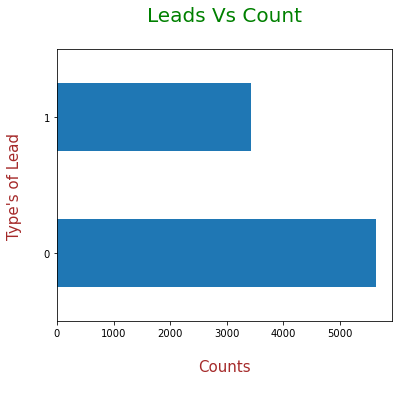

In [99]:
# To analyze leads (Converted and Non_Converted) ('1' = Converted leads, '0'= Non-Converted leads)
fig = plt.figure(figsize=(6,5))
leads['Converted'].value_counts().plot.barh()
plt.title("Leads Vs Count\n", fontdict={'fontsize':20,'fontweight':5,'color':'Green'})
plt.xlabel("\nCounts\n",fontdict={'fontsize':15,'fontweight':5,'color':'Brown'})
plt.ylabel("Type's of Lead\n",fontdict={'fontsize':15,'fontweight':5,'color':'Brown'})
plt.show()


### Inferences:
 - As per the above graph it is clear that "Converted" leads are less than the "Non-Converted" leads.
 - This is the only business challenge that why it is so and how we can overcome from this.

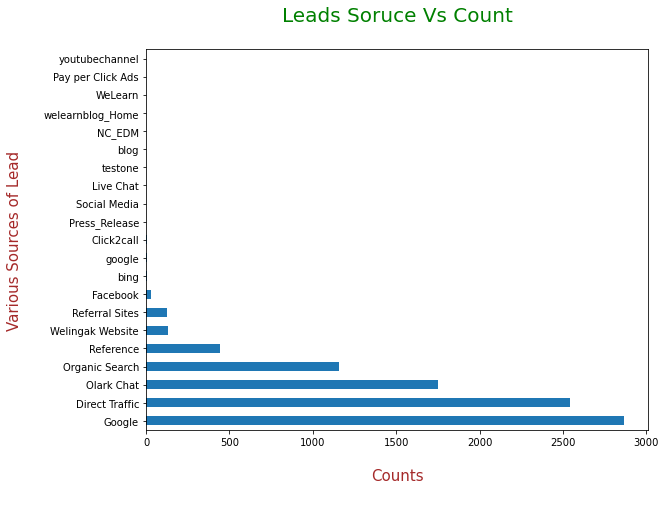

In [100]:
# To analyze Lead Source columns
fig = plt.figure(figsize=(9,7))
leads['Lead Source'].value_counts().plot.barh()
plt.title("Leads Soruce Vs Count\n", fontdict={'fontsize':20,'fontweight':5,'color':'Green'})
plt.xlabel("\nCounts\n",fontdict={'fontsize':15,'fontweight':5,'color':'Brown'})
plt.ylabel("Various Sources of Lead\n",fontdict={'fontsize':15,'fontweight':5,'color':'Brown'})
plt.show()


#### Inferences:
- As per the above graph it is clear the maximum no. of leads are getting from 'Google' and then from 'Direct Traffc'.
- Whereas very less from Facebook and Referral Sites and almost Nill from other sources like 'Pay Per Click Ads, Press_Release, testone, WeLearn, Live Chat, Social Media bign, Click2call.
- Therfore we can group all the other titles of lead sources in a common group for better analysis. 

In [101]:
# To replace less important variables in a single category 'Other_Sources' 
leads['Lead Source'] = leads['Lead Source'].replace(['youtubechannel','testone','welearnblog_Home','blog','Pay per Click Ads','NC_EDM','WeLearn','Social Media','Live Chat', 'Press_Release','Click2call','google','bing'], 'Other_Sources')


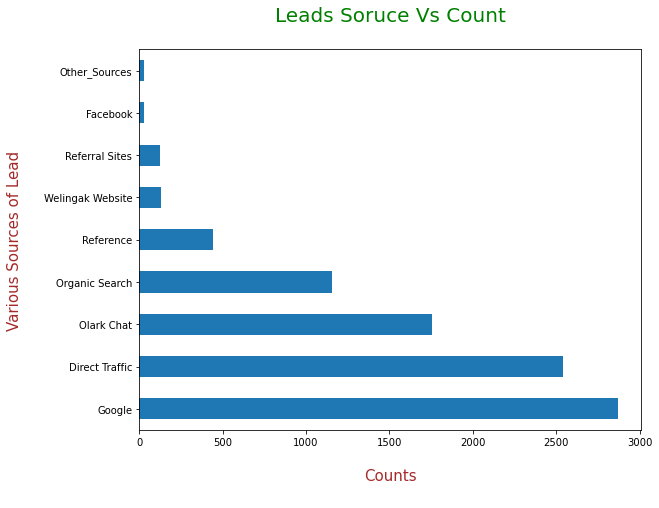

In [102]:
# To analyze Lead Source 
fig = plt.figure(figsize=(9,7))
leads['Lead Source'].value_counts().plot.barh()
plt.title("Leads Soruce Vs Count\n", fontdict={'fontsize':20,'fontweight':5,'color':'Green'})
plt.xlabel("\nCounts\n",fontdict={'fontsize':15,'fontweight':5,'color':'Brown'})
plt.ylabel("Various Sources of Lead\n",fontdict={'fontsize':15,'fontweight':5,'color':'Brown'})
plt.show()


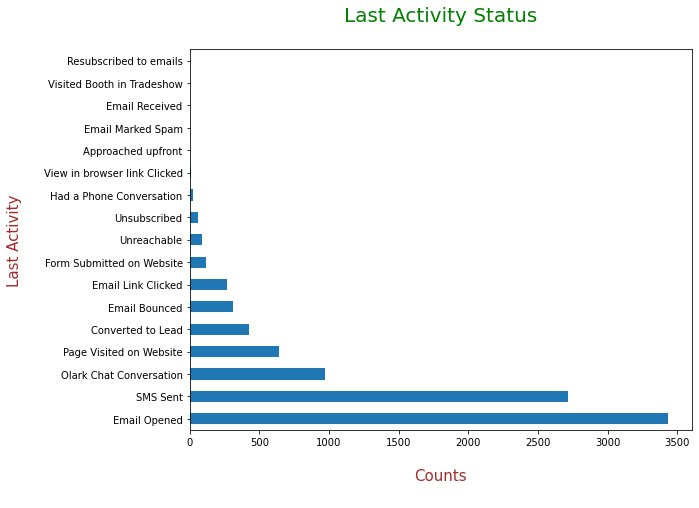

In [103]:
# To analyze Last Activity Column 
fig = plt.figure(figsize=(9,7))
leads['Last Activity'].value_counts().plot.barh()
plt.title("Last Activity Status\n", fontdict={'fontsize':20,'fontweight':5,'color':'Green'})
plt.xlabel("\nCounts\n",fontdict={'fontsize':15,'fontweight':5,'color':'Brown'})
plt.ylabel("Last Activity\n",fontdict={'fontsize':15,'fontweight':5,'color':'Brown'})
plt.show()


#### Inferences:
- As per the above graph it is clear that the maximum no. of leads Opened their Emails, SMS has been sent by them, they have visited Website page and did Olark Chat conversation regarding the course.
- Few of them has given their details and Converted into leads.
- But very-2 less leads out of them had a phone conversation, some of the leads has subkitted thri forms and clicked on the email link.
- Few leads unsubscirbed themself, and few of them filled wrong contact details therefore they were not reachable over phone and email were also bouncing back.
- Now to reduce no. of variables under this column we can grouped almost nill/less values variables in a single category.

In [104]:
# To replace less important variables in a single category 'Other_Sources' 
leads['Last Activity'] = leads['Last Activity'].replace(['View in browser link Clicked', 'Approached upfront', 'Email Marked Spam', 'Email Received', 'Resubscribed to emails','Visited Booth in Tradeshow'], 'Other_Last_Activities')


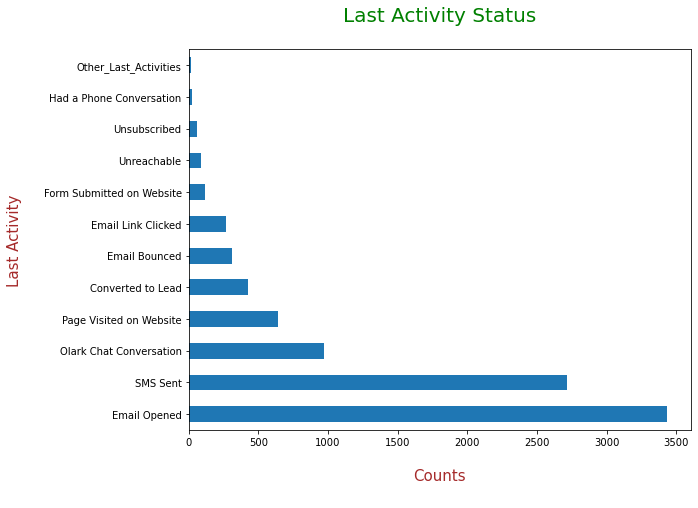

In [105]:
# To analyze Last ACtivity Column 
fig = plt.figure(figsize=(9,7))
leads['Last Activity'].value_counts().plot.barh()
plt.title("Last Activity Status\n", fontdict={'fontsize':20,'fontweight':5,'color':'Green'})
plt.xlabel("\nCounts\n",fontdict={'fontsize':15,'fontweight':5,'color':'Brown'})
plt.ylabel("Last Activity\n",fontdict={'fontsize':15,'fontweight':5,'color':'Brown'})
plt.show()


#### Inferences:
- As per the above graph it is clear that the top 2 last activites done by the users are respectively the 'Email Opened', and 'SMS Sent'.
- 'Olark Chat Conversation' and 'Page Visited on Website' are 3rd and 4th mostly done last activities by the user.

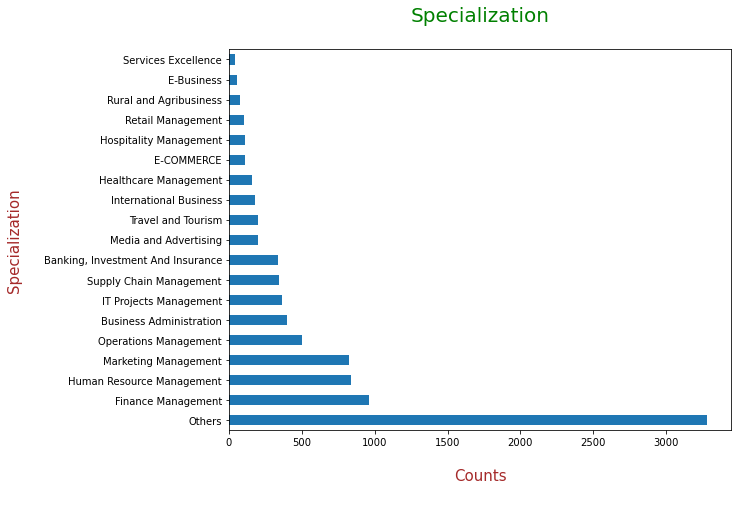

In [106]:
# To analyze 'Specialization' columns 
fig = plt.figure(figsize=(9,7))
leads['Specialization'].value_counts().plot.barh()
plt.title("Specialization\n", fontdict={'fontsize':20,'fontweight':5,'color':'Green'})
plt.xlabel("\nCounts\n",fontdict={'fontsize':15,'fontweight':5,'color':'Brown'})
plt.ylabel("Specialization\n",fontdict={'fontsize':15,'fontweight':5,'color':'Brown'})
plt.show()


#### Inferences:
- As per the above graph it is clear that the maximum no. of leads didn't mentioned anything about Specialization therefore it is considered as 'Others'.
- Top 3 Specializations are 'Finance Management', 'Human Resource Management', and 'Marketing Management', whereas least liked Specialization is 'Services Excellence'.

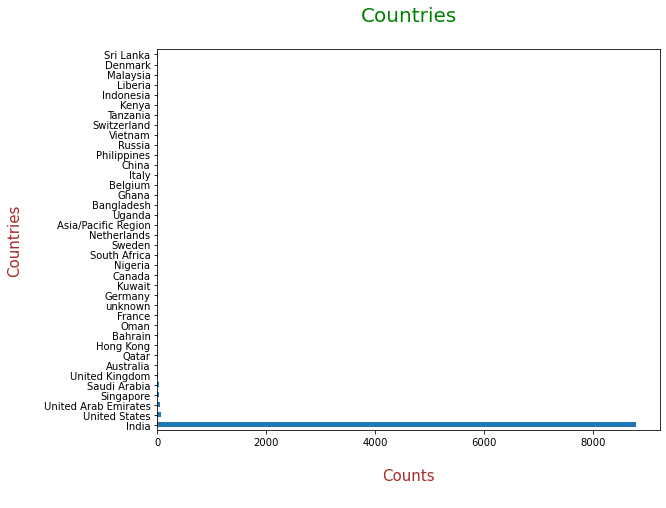

In [107]:
# To analyze 'Country' columns 
fig = plt.figure(figsize=(9,7))
leads['Country'].value_counts().plot.barh()
plt.title("Countries\n", fontdict={'fontsize':20,'fontweight':5,'color':'Green'})
plt.xlabel("\nCounts\n",fontdict={'fontsize':15,'fontweight':5,'color':'Brown'})
plt.ylabel("Countries\n",fontdict={'fontsize':15,'fontweight':5,'color':'Brown'})
plt.show()


#### Inferences
- Most of the leads are from India itself which is really very high with respect to all other countries.
- Some of them are from US, UAE, Singapore, Saudi and all other from rest of the world.
- Therfore include all other countries in the category of 'Rest of the World'

In [108]:
# To replace less important Contries in a single category 'Rest_of_the_World' 
leads['Country'] = leads['Country'].replace(['United Kingdom', 'Australia', 'Qatar', 'Bahrain', 'Hong Kong', 'Oman', 'France','Unknown', 'Nigeria', 'Germany','Canada','Kuwait','South Africa', 'Sweden','Italy', 'Philippines', 'China', 'Ghana','Belgium', 'Netherlands','Bangladesh', 'Asia/Pacific Region', 'Uganda','Switzerland','Liberia','Kenya','Indonesia', 'Malaysia','Tanzania','Sri Lanka','Denmark','Russia','Vietnam'], 'Rest_Of_the_World')


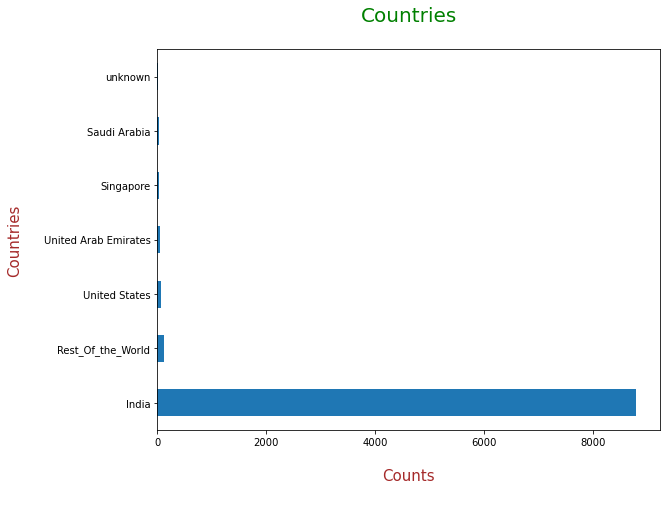

In [109]:
# To analyze 'Countries' columns 
fig = plt.figure(figsize=(9,7))
leads['Country'].value_counts().plot.barh()
plt.title("Countries\n", fontdict={'fontsize':20,'fontweight':5,'color':'Green'})
plt.xlabel("\nCounts\n",fontdict={'fontsize':15,'fontweight':5,'color':'Brown'})
plt.ylabel("Countries\n",fontdict={'fontsize':15,'fontweight':5,'color':'Brown'})
plt.show()


##### Inferences
- As per the above graph it is clear that most of the leads are from 'India' itself.
- Therefore later we can drop this column.

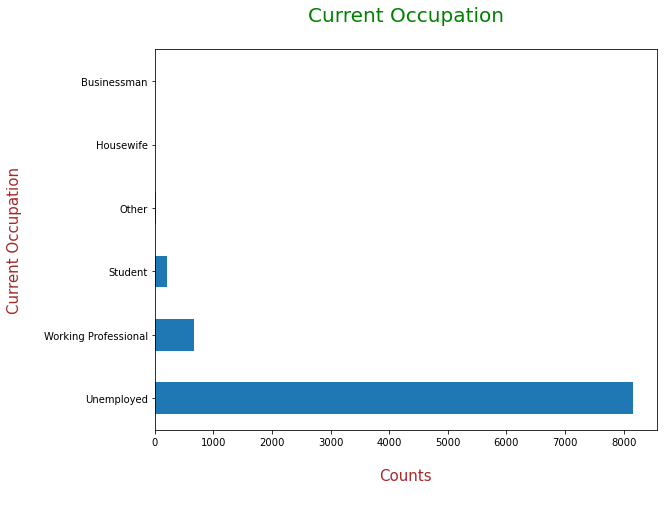

In [110]:
# To analyze 'Current Occupation' columns 
fig = plt.figure(figsize=(9,7))
leads['What is your current occupation'].value_counts().plot.barh()
plt.title("Current Occupation\n", fontdict={'fontsize':20,'fontweight':5,'color':'Green'})
plt.xlabel("\nCounts\n",fontdict={'fontsize':15,'fontweight':5,'color':'Brown'})
plt.ylabel("Current Occupation\n",fontdict={'fontsize':15,'fontweight':5,'color':'Brown'})
plt.show()


#### Inferences:
- As per the above graph most of leads are 'Unemployed' whereas top 2nd and 3rd Occupation is 'Working Professional' and 'Student' itself.
- Whereas very few among 'House Wife' and 'Businessman'. 

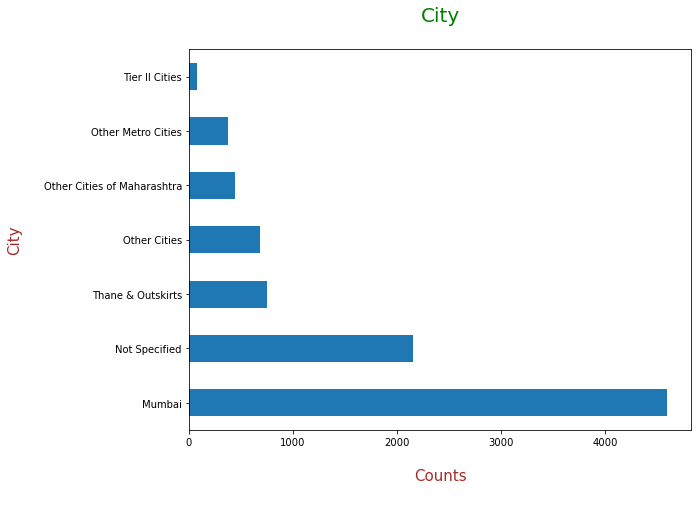

In [111]:
# To analyze 'City' columns 
fig = plt.figure(figsize=(9,7))
leads['City'].value_counts().plot.barh()
plt.title("City\n", fontdict={'fontsize':20,'fontweight':5,'color':'Green'})
plt.xlabel("\nCounts\n",fontdict={'fontsize':15,'fontweight':5,'color':'Brown'})
plt.ylabel("City\n",fontdict={'fontsize':15,'fontweight':5,'color':'Brown'})
plt.show()


#### Inferences
- As per the above graph most of leads' belongs to 'Mumbai' and most of the leads didn't mentioned City therefore I replaced with 'Not Specified'.
- Whereas very less leads are from Tier II Cities and Other Metro Cities.

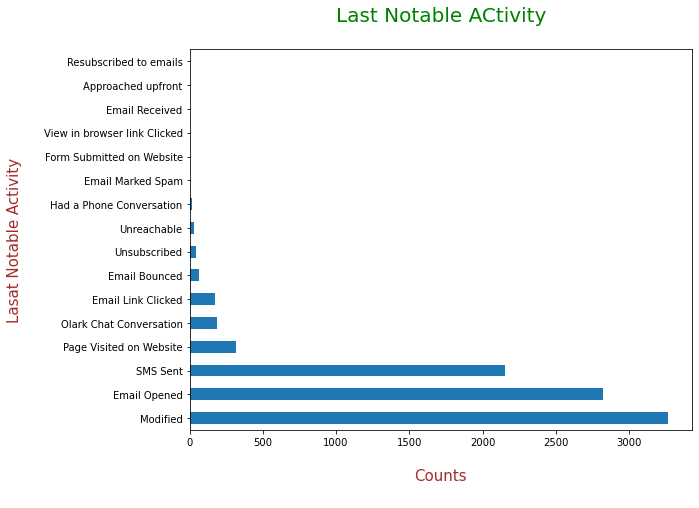

In [112]:
# To analyze 'Last Notable Activity' columns 
fig = plt.figure(figsize=(9,7))
leads['Last Notable Activity'].value_counts().plot.barh()
plt.title("Last Notable ACtivity\n", fontdict={'fontsize':20,'fontweight':5,'color':'Green'})
plt.xlabel("\nCounts\n",fontdict={'fontsize':15,'fontweight':5,'color':'Brown'})
plt.ylabel("Lasat Notable Activity\n",fontdict={'fontsize':15,'fontweight':5,'color':'Brown'})
plt.show()


#### Inferences 
- As per the above graph most of the leads Opened their Email and did some modifications profile status is not clear as they belongs to NaN.
- Whereas next highest lead profile belongs to 'Potential Lead' and 'Other lead'. 

In [113]:
# To replace less important Contries in a single category 'Rest_of_the_World' 
leads['Last Notable Activity'] = leads['Last Notable Activity'].replace(['Email Marked Spam', 'View in browser link Clicked', 'Form Submitted on Website', 'Resubscribed to emails','Approached upfront', 'Email Received'], 'Other_LN_Activities')


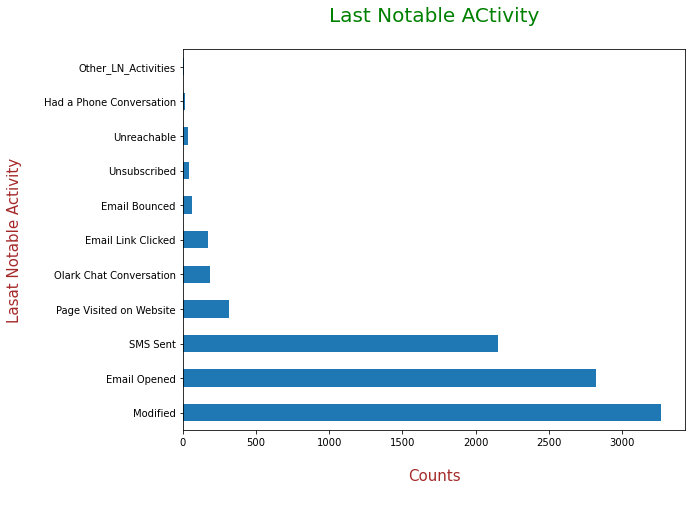

In [114]:
# To reanalyze 'Last Notable Activity' columns 
fig = plt.figure(figsize=(9,7))
leads['Last Notable Activity'].value_counts().plot.barh()
plt.title("Last Notable ACtivity\n", fontdict={'fontsize':20,'fontweight':5,'color':'Green'})
plt.xlabel("\nCounts\n",fontdict={'fontsize':15,'fontweight':5,'color':'Brown'})
plt.ylabel("Lasat Notable Activity\n",fontdict={'fontsize':15,'fontweight':5,'color':'Brown'})
plt.show()


In [115]:
# To get detail info of dataframe
leads.info()


<class 'pandas.core.frame.DataFrame'>
Int64Index: 9074 entries, 0 to 9239
Data columns (total 16 columns):
 #   Column                                  Non-Null Count  Dtype  
---  ------                                  --------------  -----  
 0   Prospect ID                             9074 non-null   object 
 1   Lead Origin                             9074 non-null   object 
 2   Lead Source                             9074 non-null   object 
 3   Do Not Email                            9074 non-null   object 
 4   Converted                               9074 non-null   int64  
 5   TotalVisits                             9074 non-null   float64
 6   Total Time Spent on Website             9074 non-null   int64  
 7   Page Views Per Visit                    9074 non-null   float64
 8   Last Activity                           9074 non-null   object 
 9   Country                                 9074 non-null   object 
 10  Specialization                          9074 non-null   obje

#### To do Outliers' Treatment

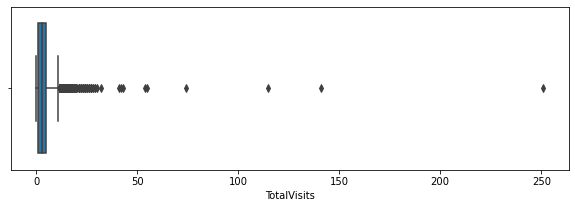

In [116]:
# To find outliers for the column 'Total Visits'
plt.figure(figsize = [10,3])
sns.boxplot(leads["TotalVisits"])
plt.show()


In [117]:
# Find out the quantile (0.25, 0.5, 0.7, 0.75, 0.8, 0.9, 0.95, 0.99, 1) of the respective column
leads["TotalVisits"].quantile([0.25, 0.5, 0.7, 0.75, 0.8, 0.9, 0.95, 0.99, 1])


0.25      1.0
0.50      3.0
0.70      4.0
0.75      5.0
0.80      5.0
0.90      7.0
0.95     10.0
0.99     17.0
1.00    251.0
Name: TotalVisits, dtype: float64

### Inferences:
 - Minimum (25%) and maximum (75%) range of TotalVisits are between 1 to 17.
 - There is a very big difference between 99 and 100% from 17.29 to directly 251, therefore we need to manage these outliers.

In [118]:
# To describe the column
round(leads["TotalVisits"].describe(), 2)


count    9074.00
mean        3.46
std         4.86
min         0.00
25%         1.00
50%         3.00
75%         5.00
max       251.00
Name: TotalVisits, dtype: float64

#### Value of Q1(25%), Q2(50%), Q3(75%)
Q1 = 1.00,
Q2 = 3.00,
Q3 = 5.00, whereas mean of it is 3.61

In [119]:
#from scipy import stats
TotalVisits_IQR = stats.iqr(leads["TotalVisits"], interpolation = 'midpoint')
TotalVisits_IQR


4.0

In [120]:
# Find the suspected outliers Q3 + 1.5*IQR
Sus_Out = 5.00 + (1.5 * TotalVisits_IQR)
Sus_Out


11.0

In [121]:
# Find the confirmed outlier Q3 + (3 * IQR)
Con_Out = 5.00 + (3 * TotalVisits_IQR)
Con_Out


17.0

In [122]:
# To drop outliers after confirmed outliers
leads = leads[leads['TotalVisits'] <= Con_Out]


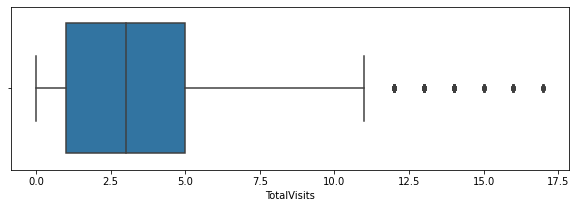

In [123]:
# To find outliers for the column 'Total Visits'
plt.figure(figsize = [10,3])
sns.boxplot(leads["TotalVisits"])
plt.show()


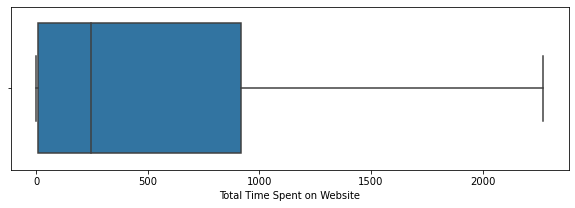

In [124]:
# To find outliers for the respecctive column 
plt.figure(figsize = [10,3])
sns.boxplot(leads["Total Time Spent on Website"])
plt.show()


In [125]:
# Find out the quantile (0.25, 0.5, 0.7, 0.75, 0.8, 0.9, 0.95, 0.99, 1) of the respective column
leads["Total Time Spent on Website"].quantile([0.25, 0.5, 0.7, 0.75, 0.8, 0.9, 0.95, 0.99, 1])


0.25       9.0
0.50     245.0
0.70     689.0
0.75     919.5
0.80    1075.0
0.90    1372.0
0.95    1555.5
0.99    1837.2
1.00    2272.0
Name: Total Time Spent on Website, dtype: float64

In [126]:
# To describe the column
round(leads["Total Time Spent on Website"].describe(),2)


count    8991.00
mean      481.31
std       544.88
min         0.00
25%         9.00
50%       245.00
75%       919.50
max      2272.00
Name: Total Time Spent on Website, dtype: float64

#### Inferences
- From above Boxplot and the quantile details it is clear that there are no Outliers in this particular column.
- Whereas Q1(25%) is 9.00, Q2(50%) is 245.00, Q3(75%) is of 919.5, and the range(min. to max.) of the respective column is 0 to 2272.

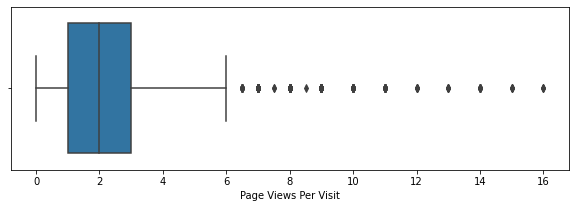

In [127]:
# To find outliers for the respecctive column 
plt.figure(figsize = [10,3])
sns.boxplot(leads["Page Views Per Visit"])
plt.show()


In [128]:
# Find out the quantile (0.25, 0.5, 0.7, 0.75, 0.8, 0.9, 0.95, 0.99, 1) of the respective column
leads["Page Views Per Visit"].quantile([0.25, 0.5, 0.7, 0.75, 0.8, 0.9, 0.95, 0.99, 1])


0.25     1.0
0.50     2.0
0.70     3.0
0.75     3.0
0.80     4.0
0.90     5.0
0.95     6.0
0.99     9.0
1.00    16.0
Name: Page Views Per Visit, dtype: float64

In [129]:
# To describe the column
round(leads["Page Views Per Visit"].describe(), 2)


count    8991.00
mean        2.34
std         2.06
min         0.00
25%         1.00
50%         2.00
75%         3.00
max        16.00
Name: Page Views Per Visit, dtype: float64

#### Inferences
- From the above Box plot and the list of quantiles from 25% to 100% it is clear that there could be the Outliers.
- Whereas the value of Q1(25%) is 1.00, Q2(50%) is 2.00, Q3(75%) is 3.0 and the mean of quantile is 2.34.

In [130]:
#from scipy import stats
Page_Views_IQR = stats.iqr(leads["Page Views Per Visit"], interpolation = 'midpoint')
Page_Views_IQR


2.0

In [131]:
# Find the suspected outliers Q3 + 1.5*IQR
Sus_Page_Views_Out = 3.0 + (1.5 * Page_Views_IQR)
Sus_Page_Views_Out


6.0

In [132]:
# Find the confirmed outlier Q3 + (3 * IQR)
Con_Page_Views_Out = 3.0 + (3 * Page_Views_IQR)
Con_Page_Views_Out


9.0

In [133]:
# To drop outliers after confirmed outliers
leads = leads[leads['Page Views Per Visit'] <= Con_Page_Views_Out]


In [134]:
# To describe the column
round(leads["Page Views Per Visit"].describe(),2)


count    8924.00
mean        2.27
std         1.89
min         0.00
25%         1.00
50%         2.00
75%         3.00
max         9.00
Name: Page Views Per Visit, dtype: float64

In [135]:
# Find out the quantile (0.25, 0.5, 0.7, 0.75, 0.8, 0.9, 0.95, 0.99, 1) of the respective column
leads["Page Views Per Visit"].quantile([0.25, 0.5, 0.7, 0.75, 0.8, 0.9, 0.95, 0.99, 1])


0.25    1.0
0.50    2.0
0.70    3.0
0.75    3.0
0.80    4.0
0.90    5.0
0.95    6.0
0.99    8.0
1.00    9.0
Name: Page Views Per Visit, dtype: float64

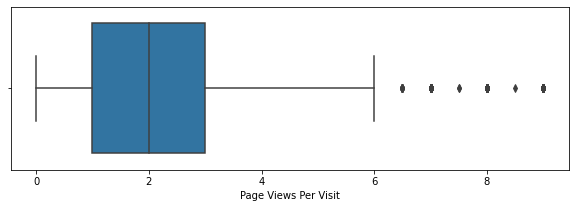

In [136]:
# To find outliers for the respecctive column 
plt.figure(figsize = [10,3])
sns.boxplot(leads["Page Views Per Visit"])
plt.show()


####  B) Bivariate/Multivariate Analysis

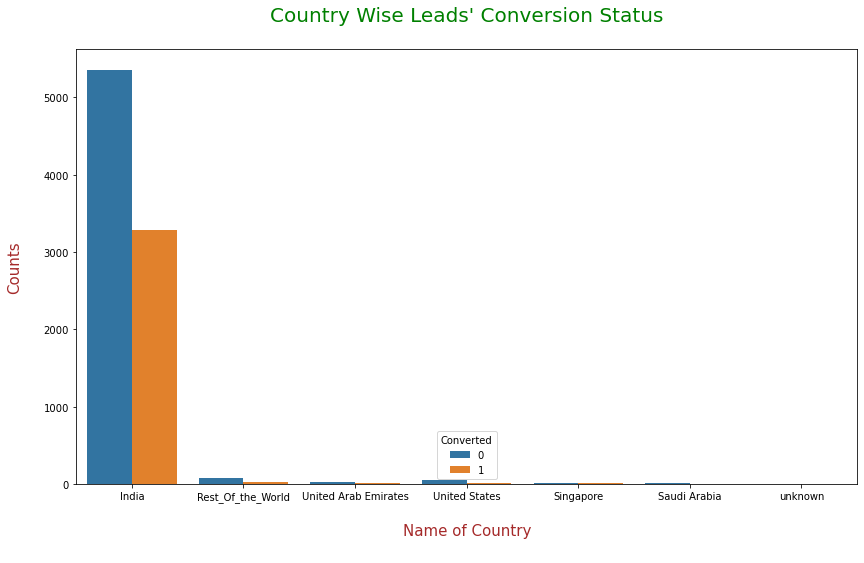

In [137]:
# To analyze country wise lead conversion    
fig = plt.figure(figsize=(14,8))
sns.countplot(data=leads, x="Country", hue="Converted")
plt.title("Country Wise Leads' Conversion Status\n", fontdict={'fontsize':20,'fontweight':5,'color':'Green'})
plt.xlabel("\nName of Country\n",fontdict={'fontsize':15,'fontweight':5,'color':'Brown'})
plt.ylabel("Counts\n",fontdict={'fontsize':15,'fontweight':5,'color':'Brown'})
plt.show()


#### Inferences
- From the above graph it is clear that 'Converted' leads are less than 'Non-Converted' leads for any country.
- It is also clear that whether the leads are 'Converted' or 'Non-Converted' more than 90% are from India itself. So we can drop this "Country" column.

In [138]:
# To drop the respective column which has only one parameter more than 90%.
leads.drop(['Country'], axis=1, inplace=True)


In [139]:
# To get shape of the dataframe
leads.shape


(8924, 15)

In [140]:
# To get information about dataframe
leads.info()


<class 'pandas.core.frame.DataFrame'>
Int64Index: 8924 entries, 0 to 9239
Data columns (total 15 columns):
 #   Column                                  Non-Null Count  Dtype  
---  ------                                  --------------  -----  
 0   Prospect ID                             8924 non-null   object 
 1   Lead Origin                             8924 non-null   object 
 2   Lead Source                             8924 non-null   object 
 3   Do Not Email                            8924 non-null   object 
 4   Converted                               8924 non-null   int64  
 5   TotalVisits                             8924 non-null   float64
 6   Total Time Spent on Website             8924 non-null   int64  
 7   Page Views Per Visit                    8924 non-null   float64
 8   Last Activity                           8924 non-null   object 
 9   Specialization                          8924 non-null   object 
 10  What is your current occupation         8924 non-null   obje

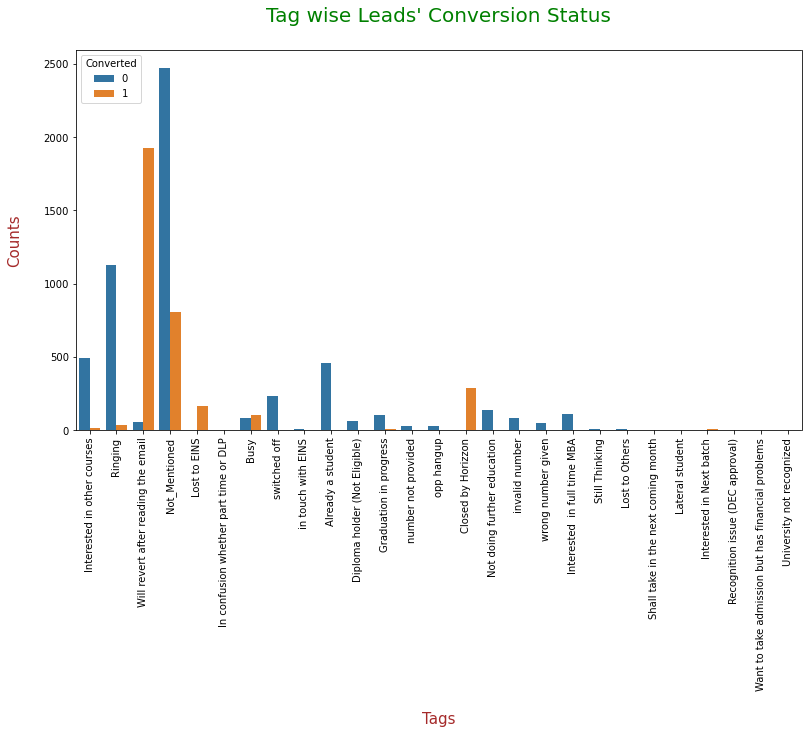

In [141]:
# To analyze Tag wise lead conversion    
fig = plt.figure(figsize=(13,7))
sns.countplot(data=leads, x="Tags", hue="Converted")
plt.title("Tag wise Leads' Conversion Status\n", fontdict={'fontsize':20,'fontweight':5,'color':'Green'})
plt.xlabel("\nTags\n",fontdict={'fontsize':15,'fontweight':5,'color':'Brown'})
plt.xticks(rotation=90)
plt.ylabel("Counts\n",fontdict={'fontsize':15,'fontweight':5,'color':'Brown'})
plt.show()


##### Inferences:
- As per the above graph it is clear that 'Will revert after reading the email', 'Closed by Horizzon', and 'Lost to EINS' has very high conversion ratio.
- Whereas, 'Ringing', 'Interested in other Courses' Tags has very-2 low conversion ratio.


In [142]:
# # To replace less important variables in a single category 'Other_Sources' 
# leads['Tags'] = leads['Tags'].replace(['Shall take in the next coming month','Lateral student','Interested in Next batch','Recogniion issue (DEC approval)','Want to take admission but has financial problems','University not recognized'], 'Other_Tags')


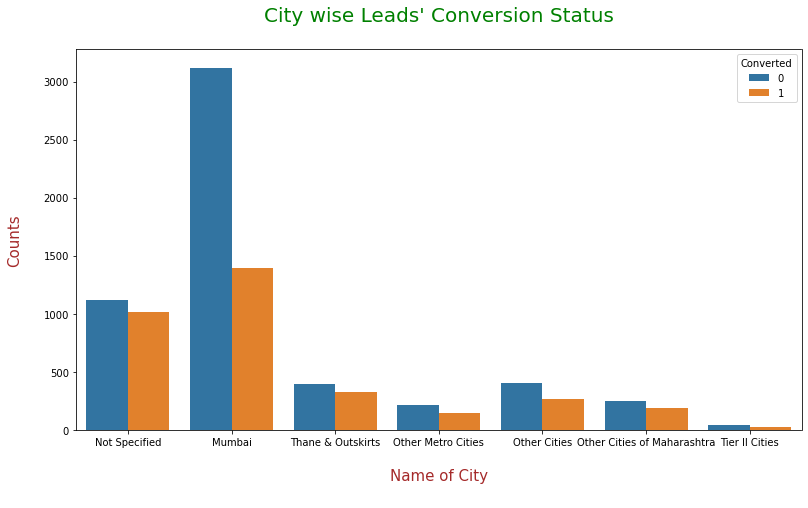

In [143]:
# To analyze City wise lead conversion    
fig = plt.figure(figsize=(13,7))
sns.countplot(data=leads, x="City", hue="Converted")
plt.title("City wise Leads' Conversion Status\n", fontdict={'fontsize':20,'fontweight':5,'color':'Green'})
plt.xlabel("\nName of City\n",fontdict={'fontsize':15,'fontweight':5,'color':'Brown'})
plt.ylabel("Counts\n",fontdict={'fontsize':15,'fontweight':5,'color':'Brown'})
plt.show()


#### Inferences
- As per the above graph it is clear that 'Mumbai' has highest no. of leads' but conversion ratio among other cities is less.
- Like wise 'Other-Metro Cities', 'Other Cities' and 'Tier-II Cities' also has less converted leads in comparision to Non-Converted leads, but conversion ratio is still better in Tier-II cities.
- Whereas, 'Thane & Outskirts' and 'Cities of Maharashtra' has more converted leads than 'Non-Converted' leads.

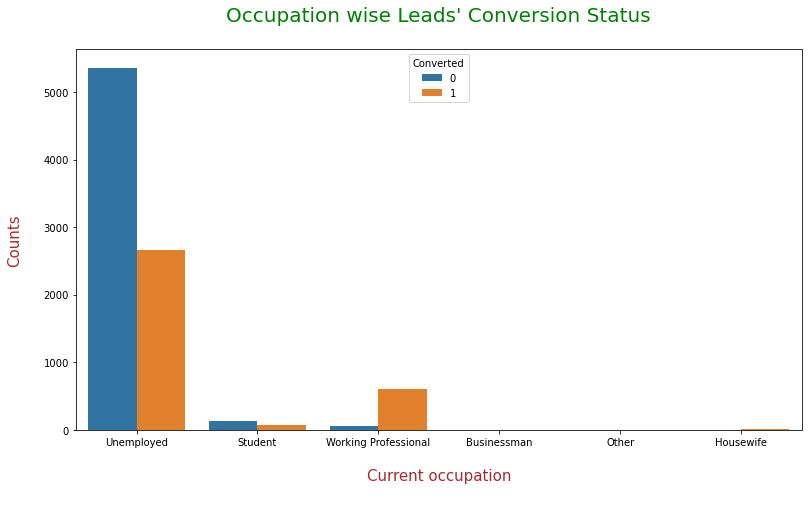

In [144]:
# To analyze Occupation wise lead conversion    
fig = plt.figure(figsize=(13,7))
sns.countplot(data=leads, x="What is your current occupation", hue="Converted")
plt.title("Occupation wise Leads' Conversion Status\n", fontdict={'fontsize':20,'fontweight':5,'color':'Green'})
plt.xlabel("\nCurrent occupation\n",fontdict={'fontsize':15,'fontweight':5,'color':'Brown'})
plt.ylabel("Counts\n",fontdict={'fontsize':15,'fontweight':5,'color':'Brown'})
plt.show()


#### Inferences
- Among all other professions most of the Converted leads are from 'Working Professional', whereas the no. of leads are higher among 'Unemployed' users.
- But it is surprisingly that 'Non-Converted' leads are also high in 'Unemployed' professional.
- Other prefessions like 'Businessman', 'Housewiffe' and 'Other' categories are very less in no.

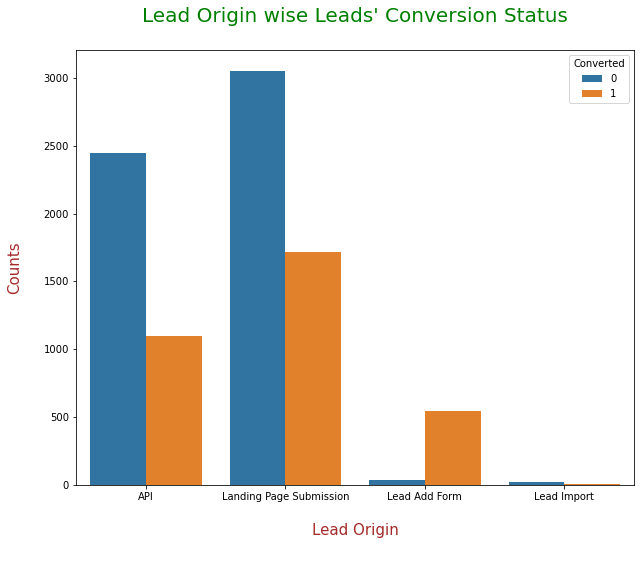

In [145]:
# To analyze Lead Origin wise lead conversion    
fig = plt.figure(figsize=(10,8))
sns.countplot(data=leads, x="Lead Origin", hue="Converted")
plt.title("Lead Origin wise Leads' Conversion Status\n", fontdict={'fontsize':20,'fontweight':5,'color':'Green'})
plt.xlabel("\nLead Origin\n",fontdict={'fontsize':15,'fontweight':5,'color':'Brown'})
plt.ylabel("Counts\n",fontdict={'fontsize':15,'fontweight':5,'color':'Brown'})
plt.show()


#### Inferences
- As per the above graph it is clear that most of the leads has been originted from 'Landing Page Submission', whereas 2nd highest Lead's Origin is from 'API'.
- Whereas, among all the 'Lead Origin' categories maximum leads conversion are from Lead Add Form.

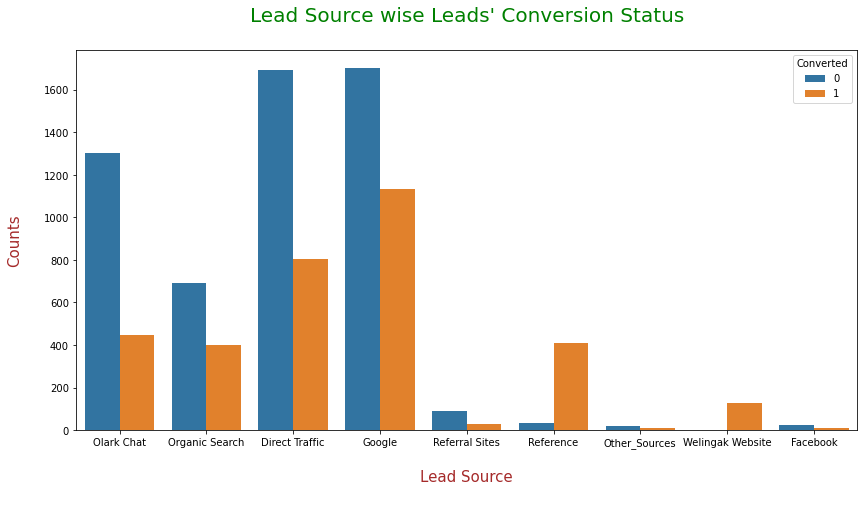

In [146]:
# To analyze Lead Source wise lead conversion    
fig = plt.figure(figsize=(14,7))
sns.countplot(data=leads, x="Lead Source", hue="Converted")
plt.title("Lead Source wise Leads' Conversion Status\n", fontdict={'fontsize':20,'fontweight':5,'color':'Green'})
plt.xlabel("\nLead Source\n",fontdict={'fontsize':15,'fontweight':5,'color':'Brown'})
plt.ylabel("Counts\n",fontdict={'fontsize':15,'fontweight':5,'color':'Brown'})
plt.show()


#### Inferences
- As per the above graph it is clear that lead conversion is less in most of the 'Lead Soruce'.
- But on Google and Direct Traffic company got maximum leads but still the conversion ratio is less. 
- Whereas 2nd and 3rd highest lead's conversion source are 'Olark Chat' and 'Organic Search' respectively.
- Most of the converted leads are from References and 'Welingak Website'.

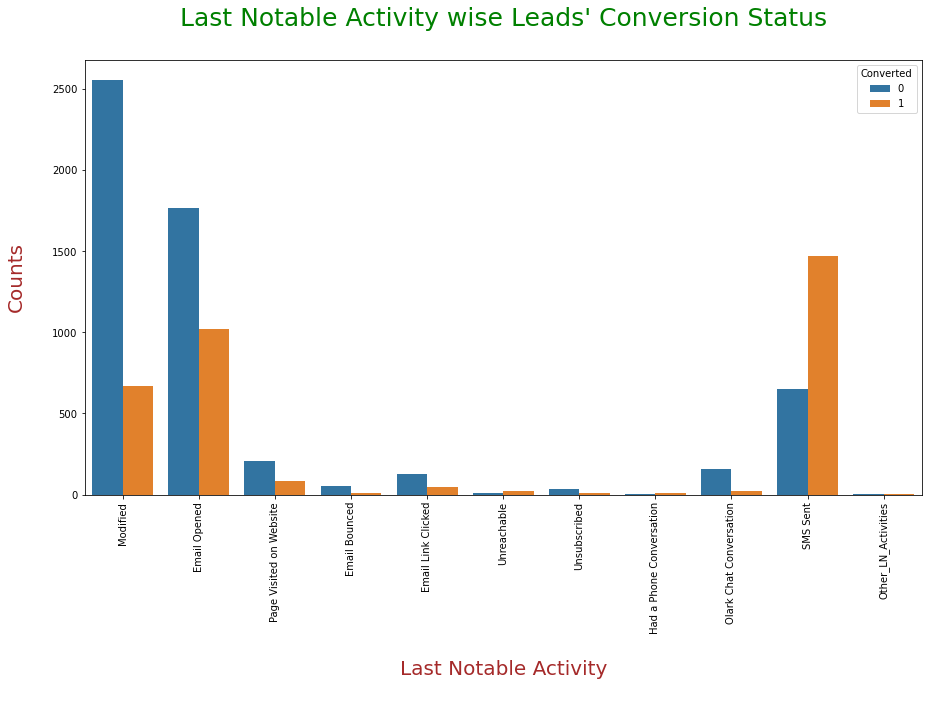

In [147]:
# To analyze Last Notable Activity wise Leads' conversion Status    
fig = plt.figure(figsize=(15,8))
sns.countplot(data=leads, x="Last Notable Activity", hue="Converted")
plt.title("Last Notable Activity wise Leads' Conversion Status\n", fontdict={'fontsize':25,'fontweight':5,'color':'Green'})
plt.xlabel("\nLast Notable Activity\n",fontdict={'fontsize':20,'fontweight':5,'color':'Brown'})
plt.xticks(rotation=90)
plt.ylabel("Counts\n",fontdict={'fontsize':20,'fontweight':5,'color':'Brown'})
plt.show()


#### Inferences
- As per the above graph most of the converted leads' last activity was 'Modified' and 'Email Opened', but the lead conversion is less.
- Whereas most of the leads has been converted via the 'SMS Sent'.
- For all other categories of the Last notable Activity are very less for both type of leads. 


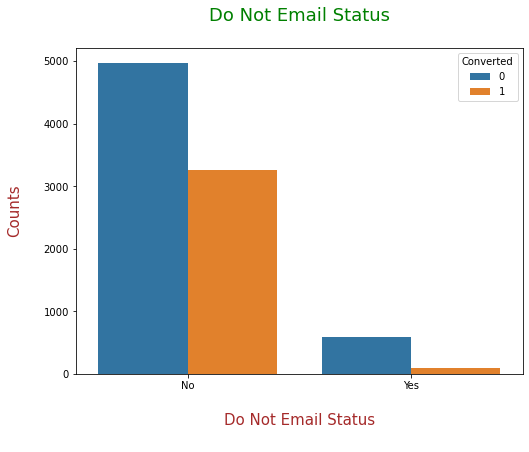

In [148]:
# To analyze about Do Not Email Status for both the categories    
fig = plt.figure(figsize=(8,6))
sns.countplot(data=leads, x="Do Not Email", hue="Converted")
plt.title("Do Not Email Status\n", fontdict={'fontsize':18,'fontweight':5,'color':'Green'})
plt.xlabel("\nDo Not Email Status\n",fontdict={'fontsize':15,'fontweight':5,'color':'Brown'})
plt.ylabel("Counts\n",fontdict={'fontsize':15,'fontweight':5,'color':'Brown'})
plt.show()


#### Inferences
- No. of emails are more under 'No' category of "Do Not Email" 
- Both types of Leads are less converted on 'Do Not Email' status.
- Therefore this graph shows that the both types of leads don't want emails about the course.

In [149]:
# To see column sames
leads.columns


Index(['Prospect ID', 'Lead Origin', 'Lead Source', 'Do Not Email', 'Converted', 'TotalVisits', 'Total Time Spent on Website', 'Page Views Per Visit', 'Last Activity', 'Specialization', 'What is your current occupation', 'Tags', 'City', 'A free copy of Mastering The Interview', 'Last Notable Activity'], dtype='object')

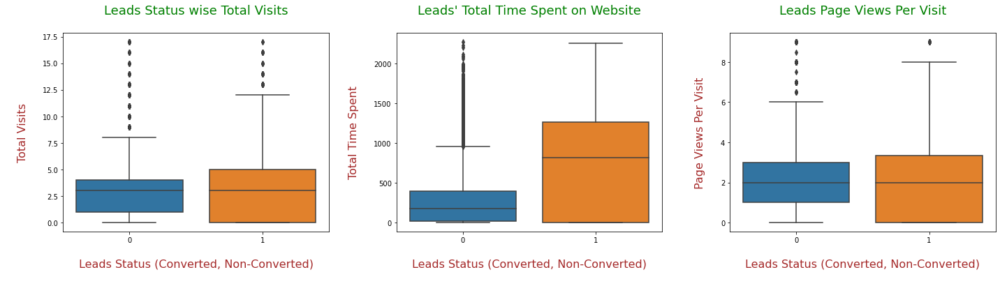

In [150]:
# Box plot - to analysis various categorcial data.
fig = plt.figure(figsize=(20, 15))

fig1 = fig.add_subplot(3, 3, 1)    # For adding subplot side by side
sns.boxplot(data= leads, x='Converted', y='TotalVisits', ax=fig1)
plt.title("Leads Status wise Total Visits\n", fontdict={'fontsize':18,'fontweight':5,'color':'Green'})
plt.xlabel("\nLeads Status (Converted, Non-Converted)\n",fontdict={'fontsize':16,'fontweight':5,'color':'Brown'})
plt.ylabel("\nTotal Visits\n",fontdict={'fontsize':16,'fontweight':5,'color':'Brown'})

fig2 = fig.add_subplot(3, 3, 2)    # For adding subplot side by side
sns.boxplot(data=leads, x='Converted', y='Total Time Spent on Website', ax=fig2)
plt.title("Leads' Total Time Spent on Website\n", fontdict={'fontsize':18,'fontweight':5,'color':'Green'})
plt.xlabel("\nLeads Status (Converted, Non-Converted)",fontdict={'fontsize':16,'fontweight':5,'color':'Brown'})
plt.ylabel("\nTotal Time Spent\n",fontdict={'fontsize':16,'fontweight':5,'color':'Brown'})

fig3 = fig.add_subplot(3, 3, 3)    # For adding subplot side by side
sns.boxplot(data=leads, x='Converted', y='Page Views Per Visit', ax=fig3)
plt.title("Leads Page Views Per Visit\n", fontdict={'fontsize':18,'fontweight':5,'color':'Green'})
plt.xlabel("\nLeads Status (Converted, Non-Converted)",fontdict={'fontsize':16,'fontweight':5,'color':'Brown'})
plt.ylabel("\nPage Views Per Visit\n",fontdict={'fontsize':16,'fontweight':5,'color':'Brown'})


fig.tight_layout()
plt.show()


#### Inferences
- As per the above Box plots it is cler that Total Visits by conveerted leads is more than not converted leads.
- Whereas for the Converted leads distribution of box is higher in lower part than the upper part..
- Total Time spent on the Website by the converted leads is higher than Non-Converted leads, therfore it's range is also higher, whereas it is almost equally divided for Non-Converted leads.
- Upper limit of Leads Page Views Per visit is same for both type of leads whereas for Converted leads lower part is more.
- In shprt all the above Box Plots shows that Converted leads visits sites more at initial stage and spent much time at later stage, as well as initially their Page views per visit is higher.

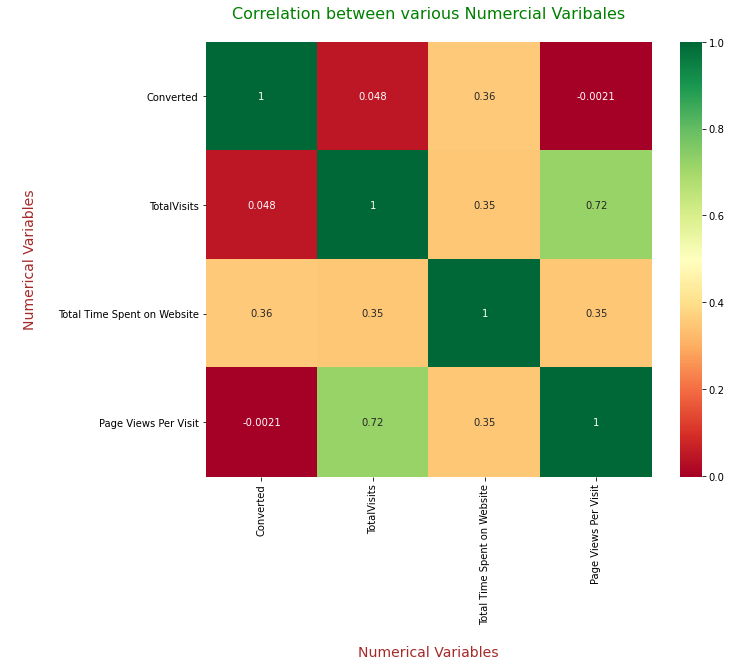

In [151]:
# To visualize coorrelation between various data with Heatmap
fig = plt.figure(figsize=(10,8))
sns.heatmap(leads.corr(), cmap="RdYlGn", annot = True)
plt.title("Correlation between various Numercial Varibales\n", fontdict={'fontsize':16,'fontweight':5,'color':'Green'})
plt.xlabel("\nNumerical Variables",fontdict={'fontsize':14,'fontweight':8,'color':'Brown'})
plt.ylabel("\nNumerical Variables\n",fontdict={'fontsize':14,'fontweight':8,'color':'Brown'})
plt.show()


#### Inferences:
- Converted leads Vs Page Views Per Visit are innversaly propotional to each other.
- Whereas Total Visits are mostly related to the Page Views Per Visit and very less related to the Converted leads.
- Total time Spent is fairly related to 'Page Views Per Visit', and 'TotalVisits'.

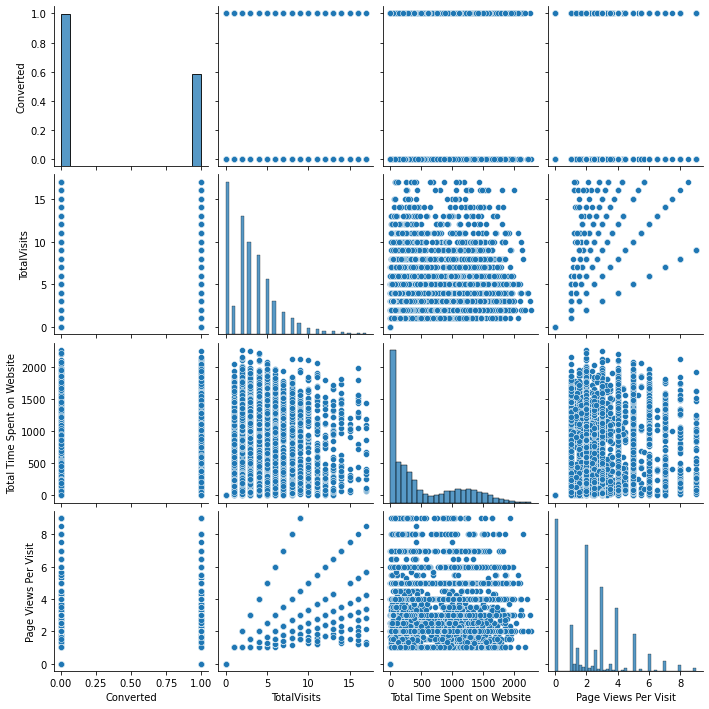

In [152]:
# To visualize the relations between various numerical variables.
sns.pairplot(leads)
plt.show()


#### Inferences:
- Nothing to say special

### Step 5: Data Preparation

#### Preparing the Data for Modeling.

- Encoding
  - Converting Categorical variables to dummy variables

#### Converting some binary variables (Yes/No) to 0/1

In [153]:
# To see shape of the dataframe
leads.shape


(8924, 15)

In [154]:
# Create new dataframe from previous one.
X_leads_1 = leads.copy(deep=True)


In [155]:
# Create new dataframe from previous one.
X_leads = X_leads_1.copy(deep=True)


In [156]:
# To check the heads of the variable
X_leads.head()


,Prospect ID,Lead Origin,Lead Source,Do Not Email,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Last Activity,Specialization,What is your current occupation,Tags,City,A free copy of Mastering The Interview,Last Notable Activity
0,7927b2df-8bba-4d29-b9a2-b6e0beafe620,API,Olark Chat,No,0,0.0,0,0.0,Page Visited on Website,Others,Unemployed,Interested in other courses,Not Specified,No,Modified
1,2a272436-5132-4136-86fa-dcc88c88f482,API,Organic Search,No,0,5.0,674,2.5,Email Opened,Others,Unemployed,Ringing,Not Specified,No,Email Opened
2,8cc8c611-a219-4f35-ad23-fdfd2656bd8a,Landing Page Submission,Direct Traffic,No,1,2.0,1532,2.0,Email Opened,Business Administration,Student,Will revert after reading the email,Mumbai,Yes,Email Opened
3,0cc2df48-7cf4-4e39-9de9-19797f9b38cc,Landing Page Submission,Direct Traffic,No,0,1.0,305,1.0,Unreachable,Media and Advertising,Unemployed,Ringing,Mumbai,No,Modified
4,3256f628-e534-4826-9d63-4a8b88782852,Landing Page Submission,Google,No,1,2.0,1428,1.0,Converted to Lead,Others,Unemployed,Will revert after reading the email,Mumbai,No,Modified


In [157]:
# To check columns
X_leads.columns


Index(['Prospect ID', 'Lead Origin', 'Lead Source', 'Do Not Email', 'Converted', 'TotalVisits', 'Total Time Spent on Website', 'Page Views Per Visit', 'Last Activity', 'Specialization', 'What is your current occupation', 'Tags', 'City', 'A free copy of Mastering The Interview', 'Last Notable Activity'], dtype='object')

#### Converting 'Yes' to 1 and 'No' to 0.

In [158]:
# List of variables to map

lead_list =  ['Do Not Email', 'A free copy of Mastering The Interview']

# Defining the map function
def binary_map(xle):
    return xle.map({'Yes': 1, "No": 0})

# Applying the function to the leads list
X_leads[lead_list] = X_leads[lead_list].apply(binary_map)


In [159]:
# To check variable heads
X_leads.head()


,Prospect ID,Lead Origin,Lead Source,Do Not Email,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Last Activity,Specialization,What is your current occupation,Tags,City,A free copy of Mastering The Interview,Last Notable Activity
0,7927b2df-8bba-4d29-b9a2-b6e0beafe620,API,Olark Chat,0,0,0.0,0,0.0,Page Visited on Website,Others,Unemployed,Interested in other courses,Not Specified,0,Modified
1,2a272436-5132-4136-86fa-dcc88c88f482,API,Organic Search,0,0,5.0,674,2.5,Email Opened,Others,Unemployed,Ringing,Not Specified,0,Email Opened
2,8cc8c611-a219-4f35-ad23-fdfd2656bd8a,Landing Page Submission,Direct Traffic,0,1,2.0,1532,2.0,Email Opened,Business Administration,Student,Will revert after reading the email,Mumbai,1,Email Opened
3,0cc2df48-7cf4-4e39-9de9-19797f9b38cc,Landing Page Submission,Direct Traffic,0,0,1.0,305,1.0,Unreachable,Media and Advertising,Unemployed,Ringing,Mumbai,0,Modified
4,3256f628-e534-4826-9d63-4a8b88782852,Landing Page Submission,Google,0,1,2.0,1428,1.0,Converted to Lead,Others,Unemployed,Will revert after reading the email,Mumbai,0,Modified


#### To create Dummy Variables.

- The variable 'Lead Origin' has few levels and to convert these levels into integer we will use `dummy variables`.

In [160]:
# Get the dummy variables for the feature 'Lead Origin' and store it into a new variable
Origin_dummy = pd.get_dummies(X_leads['Lead Origin'], prefix='Lead Origin')


In [161]:
# To check variable heads
Origin_dummy.head()


,Lead Origin_API,Lead Origin_Landing Page Submission,Lead Origin_Lead Add Form,Lead Origin_Lead Import
0,1,0,0,0
1,1,0,0,0
2,0,1,0,0
3,0,1,0,0
4,0,1,0,0


In [162]:
# Add the new variable into leads dataframe
X_leads = pd.concat([X_leads, Origin_dummy], axis = 1)


In [163]:
# To check variable heads
X_leads.head()


,Prospect ID,Lead Origin,Lead Source,Do Not Email,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Last Activity,Specialization,What is your current occupation,Tags,City,A free copy of Mastering The Interview,Last Notable Activity,Lead Origin_API,Lead Origin_Landing Page Submission,Lead Origin_Lead Add Form,Lead Origin_Lead Import
0,7927b2df-8bba-4d29-b9a2-b6e0beafe620,API,Olark Chat,0,0,0.0,0,0.0,Page Visited on Website,Others,Unemployed,Interested in other courses,Not Specified,0,Modified,1,0,0,0
1,2a272436-5132-4136-86fa-dcc88c88f482,API,Organic Search,0,0,5.0,674,2.5,Email Opened,Others,Unemployed,Ringing,Not Specified,0,Email Opened,1,0,0,0
2,8cc8c611-a219-4f35-ad23-fdfd2656bd8a,Landing Page Submission,Direct Traffic,0,1,2.0,1532,2.0,Email Opened,Business Administration,Student,Will revert after reading the email,Mumbai,1,Email Opened,0,1,0,0
3,0cc2df48-7cf4-4e39-9de9-19797f9b38cc,Landing Page Submission,Direct Traffic,0,0,1.0,305,1.0,Unreachable,Media and Advertising,Unemployed,Ringing,Mumbai,0,Modified,0,1,0,0
4,3256f628-e534-4826-9d63-4a8b88782852,Landing Page Submission,Google,0,1,2.0,1428,1.0,Converted to Lead,Others,Unemployed,Will revert after reading the email,Mumbai,0,Modified,0,1,0,0


In [164]:
# Drop 'Lead Origin' as we have created the dummies for it
X_leads.drop(['Lead Origin'], axis = 1, inplace = True)


In [165]:
# To check variable heads
X_leads.head()


,Prospect ID,Lead Source,Do Not Email,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Last Activity,Specialization,What is your current occupation,Tags,City,A free copy of Mastering The Interview,Last Notable Activity,Lead Origin_API,Lead Origin_Landing Page Submission,Lead Origin_Lead Add Form,Lead Origin_Lead Import
0,7927b2df-8bba-4d29-b9a2-b6e0beafe620,Olark Chat,0,0,0.0,0,0.0,Page Visited on Website,Others,Unemployed,Interested in other courses,Not Specified,0,Modified,1,0,0,0
1,2a272436-5132-4136-86fa-dcc88c88f482,Organic Search,0,0,5.0,674,2.5,Email Opened,Others,Unemployed,Ringing,Not Specified,0,Email Opened,1,0,0,0
2,8cc8c611-a219-4f35-ad23-fdfd2656bd8a,Direct Traffic,0,1,2.0,1532,2.0,Email Opened,Business Administration,Student,Will revert after reading the email,Mumbai,1,Email Opened,0,1,0,0
3,0cc2df48-7cf4-4e39-9de9-19797f9b38cc,Direct Traffic,0,0,1.0,305,1.0,Unreachable,Media and Advertising,Unemployed,Ringing,Mumbai,0,Modified,0,1,0,0
4,3256f628-e534-4826-9d63-4a8b88782852,Google,0,1,2.0,1428,1.0,Converted to Lead,Others,Unemployed,Will revert after reading the email,Mumbai,0,Modified,0,1,0,0


In [166]:
# TO check columns title
X_leads.columns


Index(['Prospect ID', 'Lead Source', 'Do Not Email', 'Converted', 'TotalVisits', 'Total Time Spent on Website', 'Page Views Per Visit', 'Last Activity', 'Specialization', 'What is your current occupation', 'Tags', 'City', 'A free copy of Mastering The Interview', 'Last Notable Activity', 'Lead Origin_API', 'Lead Origin_Landing Page Submission', 'Lead Origin_Lead Add Form', 'Lead Origin_Lead Import'], dtype='object')

In [167]:
# Get the dummy variables for the feature 'Lead Source' and store it into a new variable
LSource_dummy = pd.get_dummies(X_leads['Lead Source'], prefix='Lead Source')

# Get the dummy variables for the feature 'Last Activity' and store it into a new variable
LActi_dummy = pd.get_dummies(X_leads['Last Activity'], prefix='Last Activity')

# Get the dummy variables for the feature 'Specialization' and store it into a new variable
Spec_dummy = pd.get_dummies(X_leads['Specialization'], prefix='Specialization')

# Get the dummy variables for the feature 'What is your current occupation' and store it into a new variable
WCO_dummy = pd.get_dummies(X_leads['What is your current occupation'], prefix='What is your current occupation')

# Get the dummy variables for the feature 'Tags' and store it into a new variable
Tags_dummy = pd.get_dummies(X_leads['Tags'], prefix='Tags' )

# Get the dummy variables for the feature 'City' and store it into a new variable
City_dummy = pd.get_dummies(X_leads['City'], prefix='City')

# Get the dummy variables for the feature 'Last Notable Activity' and store it into a new variable
LNA_dummy = pd.get_dummies(X_leads['Last Notable Activity'], prefix='Last Notable Activity')


In [168]:
# To check variable heads
LSource_dummy.head()


,Lead Source_Direct Traffic,Lead Source_Facebook,Lead Source_Google,Lead Source_Olark Chat,Lead Source_Organic Search,Lead Source_Other_Sources,Lead Source_Reference,Lead Source_Referral Sites,Lead Source_Welingak Website
0,0,0,0,1,0,0,0,0,0
1,0,0,0,0,1,0,0,0,0
2,1,0,0,0,0,0,0,0,0
3,1,0,0,0,0,0,0,0,0
4,0,0,1,0,0,0,0,0,0


In [169]:
# To check variable heads
LActi_dummy.head()


,Last Activity_Converted to Lead,Last Activity_Email Bounced,Last Activity_Email Link Clicked,Last Activity_Email Opened,Last Activity_Form Submitted on Website,Last Activity_Had a Phone Conversation,Last Activity_Olark Chat Conversation,Last Activity_Other_Last_Activities,Last Activity_Page Visited on Website,Last Activity_SMS Sent,Last Activity_Unreachable,Last Activity_Unsubscribed
0,0,0,0,0,0,0,0,0,1,0,0,0
1,0,0,0,1,0,0,0,0,0,0,0,0
2,0,0,0,1,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,1,0
4,1,0,0,0,0,0,0,0,0,0,0,0


In [170]:
# To check variable heads
Spec_dummy.head()


,"Specialization_Banking, Investment And Insurance",Specialization_Business Administration,Specialization_E-Business,Specialization_E-COMMERCE,Specialization_Finance Management,Specialization_Healthcare Management,Specialization_Hospitality Management,Specialization_Human Resource Management,Specialization_IT Projects Management,Specialization_International Business,Specialization_Marketing Management,Specialization_Media and Advertising,Specialization_Operations Management,Specialization_Others,Specialization_Retail Management,Specialization_Rural and Agribusiness,Specialization_Services Excellence,Specialization_Supply Chain Management,Specialization_Travel and Tourism
0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
2,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0


In [171]:
# To check variable heads
WCO_dummy.head()


,What is your current occupation_Businessman,What is your current occupation_Housewife,What is your current occupation_Other,What is your current occupation_Student,What is your current occupation_Unemployed,What is your current occupation_Working Professional
0,0,0,0,0,1,0
1,0,0,0,0,1,0
2,0,0,0,1,0,0
3,0,0,0,0,1,0
4,0,0,0,0,1,0


In [172]:
# To check the heads
Tags_dummy.head()


,Tags_Already a student,Tags_Busy,Tags_Closed by Horizzon,Tags_Diploma holder (Not Eligible),Tags_Graduation in progress,Tags_In confusion whether part time or DLP,Tags_Interested in full time MBA,Tags_Interested in Next batch,Tags_Interested in other courses,Tags_Lateral student,Tags_Lost to EINS,Tags_Lost to Others,Tags_Not doing further education,Tags_Not_Mentioned,Tags_Recognition issue (DEC approval),Tags_Ringing,Tags_Shall take in the next coming month,Tags_Still Thinking,Tags_University not recognized,Tags_Want to take admission but has financial problems,Tags_Will revert after reading the email,Tags_in touch with EINS,Tags_invalid number,Tags_number not provided,Tags_opp hangup,Tags_switched off,Tags_wrong number given
0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0


In [173]:
# To check the heads
City_dummy.head()


,City_Mumbai,City_Not Specified,City_Other Cities,City_Other Cities of Maharashtra,City_Other Metro Cities,City_Thane & Outskirts,City_Tier II Cities
0,0,1,0,0,0,0,0
1,0,1,0,0,0,0,0
2,1,0,0,0,0,0,0
3,1,0,0,0,0,0,0
4,1,0,0,0,0,0,0


In [174]:
# To check the heads
LNA_dummy.head()
    

,Last Notable Activity_Email Bounced,Last Notable Activity_Email Link Clicked,Last Notable Activity_Email Opened,Last Notable Activity_Had a Phone Conversation,Last Notable Activity_Modified,Last Notable Activity_Olark Chat Conversation,Last Notable Activity_Other_LN_Activities,Last Notable Activity_Page Visited on Website,Last Notable Activity_SMS Sent,Last Notable Activity_Unreachable,Last Notable Activity_Unsubscribed
0,0,0,0,0,1,0,0,0,0,0,0
1,0,0,1,0,0,0,0,0,0,0,0
2,0,0,1,0,0,0,0,0,0,0,0
3,0,0,0,0,1,0,0,0,0,0,0
4,0,0,0,0,1,0,0,0,0,0,0


In [175]:
# To check the heads
X_leads.columns


Index(['Prospect ID', 'Lead Source', 'Do Not Email', 'Converted', 'TotalVisits', 'Total Time Spent on Website', 'Page Views Per Visit', 'Last Activity', 'Specialization', 'What is your current occupation', 'Tags', 'City', 'A free copy of Mastering The Interview', 'Last Notable Activity', 'Lead Origin_API', 'Lead Origin_Landing Page Submission', 'Lead Origin_Lead Add Form', 'Lead Origin_Lead Import'], dtype='object')

In [176]:
# Add the new variables into X_leads dataframe
X_leads = pd.concat([X_leads, LSource_dummy], axis = 1)

X_leads = pd.concat([X_leads, LActi_dummy], axis = 1)

X_leads = pd.concat([X_leads, Spec_dummy], axis = 1)

X_leads = pd.concat([X_leads, WCO_dummy], axis = 1)

X_leads = pd.concat([X_leads, Tags_dummy], axis = 1)

X_leads = pd.concat([X_leads, City_dummy], axis = 1)

X_leads = pd.concat([X_leads, LNA_dummy], axis = 1)


In [177]:
# To check the shape
X_leads.shape


(8924, 109)

In [178]:
# To check the heads
X_leads.head()


,Prospect ID,Lead Source,Do Not Email,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Last Activity,Specialization,What is your current occupation,Tags,City,A free copy of Mastering The Interview,Last Notable Activity,Lead Origin_API,Lead Origin_Landing Page Submission,Lead Origin_Lead Add Form,Lead Origin_Lead Import,Lead Source_Direct Traffic,Lead Source_Facebook,Lead Source_Google,Lead Source_Olark Chat,Lead Source_Organic Search,Lead Source_Other_Sources,Lead Source_Reference,Lead Source_Referral Sites,Lead Source_Welingak Website,Last Activity_Converted to Lead,Last Activity_Email Bounced,Last Activity_Email Link Clicked,Last Activity_Email Opened,Last Activity_Form Submitted on Website,Last Activity_Had a Phone Conversation,Last Activity_Olark Chat Conversation,Last Activity_Other_Last_Activities,Last Activity_Page Visited on Website,Last Activity_SMS Sent,Last Activity_Unreachable,Last Activity_Unsubscribed,"Specialization_Banking, Investment And Insurance",Specialization_Business Administration,Specialization_E-Business,Specialization_E-COMMERCE,Specialization_Finance Management,Specialization_Healthcare Management,Specialization_Hospitality Management,Specialization_Human Resource Management,Specialization_IT Projects Management,Specialization_International Business,Specialization_Marketing Management,Specialization_Media and Advertising,Specialization_Operations Management,Specialization_Others,Specialization_Retail Management,Specialization_Rural and Agribusiness,Specialization_Services Excellence,Specialization_Supply Chain Management,Specialization_Travel and Tourism,What is your current occupation_Businessman,What is your current occupation_Housewife,What is your current occupation_Other,What is your current occupation_Student,What is your current occupation_Unemployed,What is your current occupation_Working Professional,Tags_Already a student,Tags_Busy,Tags_Closed by Horizzon,Tags_Diploma holder (Not Eligible),Tags_Graduation in progress,Tags_In confusion whether part time or DLP,Tags_Interested in full time MBA,Tags_Interested in Next batch,Tags_Interested in other courses,Tags_Lateral student,Tags_Lost to EINS,Tags_Lost to Others,Tags_Not doing further education,Tags_Not_Mentioned,Tags_Recognition issue (DEC approval),Tags_Ringing,Tags_Shall take in the next coming month,Tags_Still Thinking,Tags_University not recognized,Tags_Want to take admission but has financial problems,Tags_Will revert after reading the email,Tags_in touch with EINS,Tags_invalid number,Tags_number not provided,Tags_opp hangup,Tags_switched off,Tags_wrong number given,City_Mumbai,City_Not Specified,City_Other Cities,City_Other Cities of Maharashtra,City_Other Metro Cities,City_Thane & Outskirts,City_Tier II Cities,Last Notable Activity_Email Bounced,Last Notable Activity_Email Link Clicked,Last Notable Activity_Email Opened,Last Notable Activity_Had a Phone Conversation,Last Notable Activity_Modified,Last Notable Activity_Olark Chat Conversation,Last Notable Activity_Other_LN_Activities,Last Notable Activity_Page Visited on Website,Last Notable Activity_SMS Sent,Last Notable Activity_Unreachable,Last Notable Activity_Unsubscribed
0,7927b2df-8bba-4d29-b9a2-b6e0beafe620,Olark Chat,0,0,0.0,0,0.0,Page Visited on Website,Others,Unemployed,Interested in other courses,Not Specified,0,Modified,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
1,2a272436-5132-4136-86fa-dcc88c88f482,Organic Search,0,0,5.0,674,2.5,Email Opened,Others,Unemployed,Ringing,Not Specified,0,Email Opened,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
2,8cc8c611-a219-4f35-ad23-fdfd2656bd8a,Direct Traffic,0,1,2.0,1532,2.0,Email Opened,Business Administration,Student,Will rev

In [179]:
# Drop 'Lead Source' as we have created the dummies for it
X_leads.drop(['Lead Source'], axis = 1, inplace = True)

# Drop 'Last Activity' as we have created the dummies for it
X_leads.drop(['Last Activity'], axis = 1, inplace = True)

# Drop 'Specialization' as we have created the dummies for it
X_leads.drop(['Specialization'], axis = 1, inplace = True)

# Drop 'What is your current occupation' as we have created the dummies for it
X_leads.drop(['What is your current occupation'], axis = 1, inplace = True)

# Drop 'Tags' as we have created the dummies for it
X_leads.drop(['Tags'], axis = 1, inplace = True)

# Drop 'City' as we have created the dummies for it
X_leads.drop(['City'], axis = 1, inplace = True)

# Drop 'Last Notable Activity' as we have created the dummies for it
X_leads.drop(['Last Notable Activity'], axis = 1, inplace = True)


In [180]:
# To check the shape
X_leads.shape


(8924, 102)

In [181]:
# To check the heads
X_leads.head()


,Prospect ID,Do Not Email,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,A free copy of Mastering The Interview,Lead Origin_API,Lead Origin_Landing Page Submission,Lead Origin_Lead Add Form,Lead Origin_Lead Import,Lead Source_Direct Traffic,Lead Source_Facebook,Lead Source_Google,Lead Source_Olark Chat,Lead Source_Organic Search,Lead Source_Other_Sources,Lead Source_Reference,Lead Source_Referral Sites,Lead Source_Welingak Website,Last Activity_Converted to Lead,Last Activity_Email Bounced,Last Activity_Email Link Clicked,Last Activity_Email Opened,Last Activity_Form Submitted on Website,Last Activity_Had a Phone Conversation,Last Activity_Olark Chat Conversation,Last Activity_Other_Last_Activities,Last Activity_Page Visited on Website,Last Activity_SMS Sent,Last Activity_Unreachable,Last Activity_Unsubscribed,"Specialization_Banking, Investment And Insurance",Specialization_Business Administration,Specialization_E-Business,Specialization_E-COMMERCE,Specialization_Finance Management,Specialization_Healthcare Management,Specialization_Hospitality Management,Specialization_Human Resource Management,Specialization_IT Projects Management,Specialization_International Business,Specialization_Marketing Management,Specialization_Media and Advertising,Specialization_Operations Management,Specialization_Others,Specialization_Retail Management,Specialization_Rural and Agribusiness,Specialization_Services Excellence,Specialization_Supply Chain Management,Specialization_Travel and Tourism,What is your current occupation_Businessman,What is your current occupation_Housewife,What is your current occupation_Other,What is your current occupation_Student,What is your current occupation_Unemployed,What is your current occupation_Working Professional,Tags_Already a student,Tags_Busy,Tags_Closed by Horizzon,Tags_Diploma holder (Not Eligible),Tags_Graduation in progress,Tags_In confusion whether part time or DLP,Tags_Interested in full time MBA,Tags_Interested in Next batch,Tags_Interested in other courses,Tags_Lateral student,Tags_Lost to EINS,Tags_Lost to Others,Tags_Not doing further education,Tags_Not_Mentioned,Tags_Recognition issue (DEC approval),Tags_Ringing,Tags_Shall take in the next coming month,Tags_Still Thinking,Tags_University not recognized,Tags_Want to take admission but has financial problems,Tags_Will revert after reading the email,Tags_in touch with EINS,Tags_invalid number,Tags_number not provided,Tags_opp hangup,Tags_switched off,Tags_wrong number given,City_Mumbai,City_Not Specified,City_Other Cities,City_Other Cities of Maharashtra,City_Other Metro Cities,City_Thane & Outskirts,City_Tier II Cities,Last Notable Activity_Email Bounced,Last Notable Activity_Email Link Clicked,Last Notable Activity_Email Opened,Last Notable Activity_Had a Phone Conversation,Last Notable Activity_Modified,Last Notable Activity_Olark Chat Conversation,Last Notable Activity_Other_LN_Activities,Last Notable Activity_Page Visited on Website,Last Notable Activity_SMS Sent,Last Notable Activity_Unreachable,Last Notable Activity_Unsubscribed
0,7927b2df-8bba-4d29-b9a2-b6e0beafe620,0,0,0.0,0,0.0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
1,2a272436-5132-4136-86fa-dcc88c88f482,0,0,5.0,674,2.5,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
2,8cc8c611-a219-4f35-ad23-fdfd2656bd8a,0,1,2.0,1532,2.0,1,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
3,0cc2df48-7cf4-4e39-9de9-19797f9b38cc,0,0,1.0,305,1.0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0

In [182]:
# To check the null values
X_leads.isnull().sum()


Prospect ID                                               0
Do Not Email                                              0
Converted                                                 0
TotalVisits                                               0
Total Time Spent on Website                               0
Page Views Per Visit                                      0
A free copy of Mastering The Interview                    0
Lead Origin_API                                           0
Lead Origin_Landing Page Submission                       0
Lead Origin_Lead Add Form                                 0
Lead Origin_Lead Import                                   0
Lead Source_Direct Traffic                                0
Lead Source_Facebook                                      0
Lead Source_Google                                        0
Lead Source_Olark Chat                                    0
Lead Source_Organic Search                                0
Lead Source_Other_Sources               

In [183]:
# To describe the variables
X_leads.describe()


,Do Not Email,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,A free copy of Mastering The Interview,Lead Origin_API,Lead Origin_Landing Page Submission,Lead Origin_Lead Add Form,Lead Origin_Lead Import,Lead Source_Direct Traffic,Lead Source_Facebook,Lead Source_Google,Lead Source_Olark Chat,Lead Source_Organic Search,Lead Source_Other_Sources,Lead Source_Reference,Lead Source_Referral Sites,Lead Source_Welingak Website,Last Activity_Converted to Lead,Last Activity_Email Bounced,Last Activity_Email Link Clicked,Last Activity_Email Opened,Last Activity_Form Submitted on Website,Last Activity_Had a Phone Conversation,Last Activity_Olark Chat Conversation,Last Activity_Other_Last_Activities,Last Activity_Page Visited on Website,Last Activity_SMS Sent,Last Activity_Unreachable,Last Activity_Unsubscribed,"Specialization_Banking, Investment And Insurance",Specialization_Business Administration,Specialization_E-Business,Specialization_E-COMMERCE,Specialization_Finance Management,Specialization_Healthcare Management,Specialization_Hospitality Management,Specialization_Human Resource Management,Specialization_IT Projects Management,Specialization_International Business,Specialization_Marketing Management,Specialization_Media and Advertising,Specialization_Operations Management,Specialization_Others,Specialization_Retail Management,Specialization_Rural and Agribusiness,Specialization_Services Excellence,Specialization_Supply Chain Management,Specialization_Travel and Tourism,What is your current occupation_Businessman,What is your current occupation_Housewife,What is your current occupation_Other,What is your current occupation_Student,What is your current occupation_Unemployed,What is your current occupation_Working Professional,Tags_Already a student,Tags_Busy,Tags_Closed by Horizzon,Tags_Diploma holder (Not Eligible),Tags_Graduation in progress,Tags_In confusion whether part time or DLP,Tags_Interested in full time MBA,Tags_Interested in Next batch,Tags_Interested in other courses,Tags_Lateral student,Tags_Lost to EINS,Tags_Lost to Others,Tags_Not doing further education,Tags_Not_Mentioned,Tags_Recognition issue (DEC approval),Tags_Ringing,Tags_Shall take in the next coming month,Tags_Still Thinking,Tags_University not recognized,Tags_Want to take admission but has financial problems,Tags_Will revert after reading the email,Tags_in touch with EINS,Tags_invalid number,Tags_number not provided,Tags_opp hangup,Tags_switched off,Tags_wrong number given,City_Mumbai,City_Not Specified,City_Other Cities,City_Other Cities of Maharashtra,City_Other Metro Cities,City_Thane & Outskirts,City_Tier II Cities,Last Notable Activity_Email Bounced,Last Notable Activity_Email Link Clicked,Last Notable Activity_Email Opened,Last Notable Activity_Had a Phone Conversation,Last Notable Activity_Modified,Last Notable Activity_Olark Chat Conversation,Last Notable Activity_Other_LN_Activities,Last Notable Activity_Page Visited on Website,Last Notable Activity_SMS Sent,Last Notable Activity_Unreachable,Last Notable Activity_Unsubscribed
count,8924.000000,8924.000000,8924.000000,8924.000000,8924.00000,8924.000000,8924.000000,8924.000000,8924.000000,8924.000000,8924.000000,8924.000000,8924.000000,8924.000000,8924.000000,8924.000000,8924.000000,8924.000000,8924.000000,8924.000000,8924.000000,8924.000000,8924.000000,8924.000000,8924.000000,8924.000000,8924.000000,8924.000000,8924.000000,8924.000000,8924.000000,8924.000000,8924.000000,8924.000000,8924.000000,8924.000000,8924.000000,8924.000000,8924.000000,8924.000000,8924.000000,8924.000000,8924.000000,8924.000000,8924.000000,8924.000000,8924.000000,8924.000000,8924.000000,8924.000000,8924.000000,8924.000000,8924.000000,8924.000000,8924.000000,8924.000000,8924.000000,8924.000000,8924.000000,8924.000000,8924.000000,8924.000000,8924.000000,8924.000000,8924.000000,8924.000000,8924.000000,8924.000000,8924.000000,8924.000000,8924.000000,8924.000000,8924.000000,8924.000000,8924.000000,8924.000000,8

### Step 6: Splitting the Data into Training and Testing Sets

- The very first basic step for regression is performing a train-test split.

In [184]:
# Putting feature variable to X
X = X_leads.drop(['Prospect ID','Converted'], axis=1)
X.head()


,Do Not Email,TotalVisits,Total Time Spent on Website,Page Views Per Visit,A free copy of Mastering The Interview,Lead Origin_API,Lead Origin_Landing Page Submission,Lead Origin_Lead Add Form,Lead Origin_Lead Import,Lead Source_Direct Traffic,Lead Source_Facebook,Lead Source_Google,Lead Source_Olark Chat,Lead Source_Organic Search,Lead Source_Other_Sources,Lead Source_Reference,Lead Source_Referral Sites,Lead Source_Welingak Website,Last Activity_Converted to Lead,Last Activity_Email Bounced,Last Activity_Email Link Clicked,Last Activity_Email Opened,Last Activity_Form Submitted on Website,Last Activity_Had a Phone Conversation,Last Activity_Olark Chat Conversation,Last Activity_Other_Last_Activities,Last Activity_Page Visited on Website,Last Activity_SMS Sent,Last Activity_Unreachable,Last Activity_Unsubscribed,"Specialization_Banking, Investment And Insurance",Specialization_Business Administration,Specialization_E-Business,Specialization_E-COMMERCE,Specialization_Finance Management,Specialization_Healthcare Management,Specialization_Hospitality Management,Specialization_Human Resource Management,Specialization_IT Projects Management,Specialization_International Business,Specialization_Marketing Management,Specialization_Media and Advertising,Specialization_Operations Management,Specialization_Others,Specialization_Retail Management,Specialization_Rural and Agribusiness,Specialization_Services Excellence,Specialization_Supply Chain Management,Specialization_Travel and Tourism,What is your current occupation_Businessman,What is your current occupation_Housewife,What is your current occupation_Other,What is your current occupation_Student,What is your current occupation_Unemployed,What is your current occupation_Working Professional,Tags_Already a student,Tags_Busy,Tags_Closed by Horizzon,Tags_Diploma holder (Not Eligible),Tags_Graduation in progress,Tags_In confusion whether part time or DLP,Tags_Interested in full time MBA,Tags_Interested in Next batch,Tags_Interested in other courses,Tags_Lateral student,Tags_Lost to EINS,Tags_Lost to Others,Tags_Not doing further education,Tags_Not_Mentioned,Tags_Recognition issue (DEC approval),Tags_Ringing,Tags_Shall take in the next coming month,Tags_Still Thinking,Tags_University not recognized,Tags_Want to take admission but has financial problems,Tags_Will revert after reading the email,Tags_in touch with EINS,Tags_invalid number,Tags_number not provided,Tags_opp hangup,Tags_switched off,Tags_wrong number given,City_Mumbai,City_Not Specified,City_Other Cities,City_Other Cities of Maharashtra,City_Other Metro Cities,City_Thane & Outskirts,City_Tier II Cities,Last Notable Activity_Email Bounced,Last Notable Activity_Email Link Clicked,Last Notable Activity_Email Opened,Last Notable Activity_Had a Phone Conversation,Last Notable Activity_Modified,Last Notable Activity_Olark Chat Conversation,Last Notable Activity_Other_LN_Activities,Last Notable Activity_Page Visited on Website,Last Notable Activity_SMS Sent,Last Notable Activity_Unreachable,Last Notable Activity_Unsubscribed
0,0,0.0,0,0.0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
1,0,5.0,674,2.5,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
2,0,2.0,1532,2.0,1,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
3,0,1.0,305,1.0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
4,0,2.0,1428,1.0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,

In [185]:
# To check the shape
X.shape


(8924, 100)

In [186]:
# Putting response variable to y
y = X_leads['Converted']

y.head()


0    0
1    0
2    1
3    0
4    1
Name: Converted, dtype: int64

In [187]:
# To check the shape
y.shape


(8924,)

In [188]:
# Splitting the data into train and test
np.random.seed(0)
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.7, test_size=0.3, random_state=100)


In [189]:
# To check the shape
X_train.shape


(6246, 100)

In [190]:
# To check the shape
X_test.shape


(2678, 100)

### Step 7: Rescaling the Features 

In Simple Linear Regression, scaling doesn't impact. When variable has little different interger values then rescale the variables to make them comparable. Without comparable scales, some of the coefficients obtained by fitting the regression model might be very large or very small as compared to the other coefficients. This may be very critical during model evaluation. Therefore standardization or normalization should be used so that the units of all the coefficients would be on the same scale. There are two types of rescaling:

1. Standardisation (mean-0, sigma-1)
2. Min-Max scaling : Between 0 and 1

Here, I will use Standardizing scaling.


In [191]:
# To check all the variables
X_leads.head()


,Prospect ID,Do Not Email,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,A free copy of Mastering The Interview,Lead Origin_API,Lead Origin_Landing Page Submission,Lead Origin_Lead Add Form,Lead Origin_Lead Import,Lead Source_Direct Traffic,Lead Source_Facebook,Lead Source_Google,Lead Source_Olark Chat,Lead Source_Organic Search,Lead Source_Other_Sources,Lead Source_Reference,Lead Source_Referral Sites,Lead Source_Welingak Website,Last Activity_Converted to Lead,Last Activity_Email Bounced,Last Activity_Email Link Clicked,Last Activity_Email Opened,Last Activity_Form Submitted on Website,Last Activity_Had a Phone Conversation,Last Activity_Olark Chat Conversation,Last Activity_Other_Last_Activities,Last Activity_Page Visited on Website,Last Activity_SMS Sent,Last Activity_Unreachable,Last Activity_Unsubscribed,"Specialization_Banking, Investment And Insurance",Specialization_Business Administration,Specialization_E-Business,Specialization_E-COMMERCE,Specialization_Finance Management,Specialization_Healthcare Management,Specialization_Hospitality Management,Specialization_Human Resource Management,Specialization_IT Projects Management,Specialization_International Business,Specialization_Marketing Management,Specialization_Media and Advertising,Specialization_Operations Management,Specialization_Others,Specialization_Retail Management,Specialization_Rural and Agribusiness,Specialization_Services Excellence,Specialization_Supply Chain Management,Specialization_Travel and Tourism,What is your current occupation_Businessman,What is your current occupation_Housewife,What is your current occupation_Other,What is your current occupation_Student,What is your current occupation_Unemployed,What is your current occupation_Working Professional,Tags_Already a student,Tags_Busy,Tags_Closed by Horizzon,Tags_Diploma holder (Not Eligible),Tags_Graduation in progress,Tags_In confusion whether part time or DLP,Tags_Interested in full time MBA,Tags_Interested in Next batch,Tags_Interested in other courses,Tags_Lateral student,Tags_Lost to EINS,Tags_Lost to Others,Tags_Not doing further education,Tags_Not_Mentioned,Tags_Recognition issue (DEC approval),Tags_Ringing,Tags_Shall take in the next coming month,Tags_Still Thinking,Tags_University not recognized,Tags_Want to take admission but has financial problems,Tags_Will revert after reading the email,Tags_in touch with EINS,Tags_invalid number,Tags_number not provided,Tags_opp hangup,Tags_switched off,Tags_wrong number given,City_Mumbai,City_Not Specified,City_Other Cities,City_Other Cities of Maharashtra,City_Other Metro Cities,City_Thane & Outskirts,City_Tier II Cities,Last Notable Activity_Email Bounced,Last Notable Activity_Email Link Clicked,Last Notable Activity_Email Opened,Last Notable Activity_Had a Phone Conversation,Last Notable Activity_Modified,Last Notable Activity_Olark Chat Conversation,Last Notable Activity_Other_LN_Activities,Last Notable Activity_Page Visited on Website,Last Notable Activity_SMS Sent,Last Notable Activity_Unreachable,Last Notable Activity_Unsubscribed
0,7927b2df-8bba-4d29-b9a2-b6e0beafe620,0,0,0.0,0,0.0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
1,2a272436-5132-4136-86fa-dcc88c88f482,0,0,5.0,674,2.5,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
2,8cc8c611-a219-4f35-ad23-fdfd2656bd8a,0,1,2.0,1532,2.0,1,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
3,0cc2df48-7cf4-4e39-9de9-19797f9b38cc,0,0,1.0,305,1.0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0

In [192]:
# Do scaling on the variables
X_leads_scaler = StandardScaler()


In [193]:
# To Create List of variables

# Apply scaler() to all the columns except the 'dummy' variables
X_leads_num_vars = ['TotalVisits', 'Total Time Spent on Website','Page Views Per Visit']


In [194]:
# To Fit all the train data
X_train[X_leads_num_vars] = X_leads_scaler.fit_transform(X_train[X_leads_num_vars])


In [195]:
# To check all the variables
X_train.head()


,Do Not Email,TotalVisits,Total Time Spent on Website,Page Views Per Visit,A free copy of Mastering The Interview,Lead Origin_API,Lead Origin_Landing Page Submission,Lead Origin_Lead Add Form,Lead Origin_Lead Import,Lead Source_Direct Traffic,Lead Source_Facebook,Lead Source_Google,Lead Source_Olark Chat,Lead Source_Organic Search,Lead Source_Other_Sources,Lead Source_Reference,Lead Source_Referral Sites,Lead Source_Welingak Website,Last Activity_Converted to Lead,Last Activity_Email Bounced,Last Activity_Email Link Clicked,Last Activity_Email Opened,Last Activity_Form Submitted on Website,Last Activity_Had a Phone Conversation,Last Activity_Olark Chat Conversation,Last Activity_Other_Last_Activities,Last Activity_Page Visited on Website,Last Activity_SMS Sent,Last Activity_Unreachable,Last Activity_Unsubscribed,"Specialization_Banking, Investment And Insurance",Specialization_Business Administration,Specialization_E-Business,Specialization_E-COMMERCE,Specialization_Finance Management,Specialization_Healthcare Management,Specialization_Hospitality Management,Specialization_Human Resource Management,Specialization_IT Projects Management,Specialization_International Business,Specialization_Marketing Management,Specialization_Media and Advertising,Specialization_Operations Management,Specialization_Others,Specialization_Retail Management,Specialization_Rural and Agribusiness,Specialization_Services Excellence,Specialization_Supply Chain Management,Specialization_Travel and Tourism,What is your current occupation_Businessman,What is your current occupation_Housewife,What is your current occupation_Other,What is your current occupation_Student,What is your current occupation_Unemployed,What is your current occupation_Working Professional,Tags_Already a student,Tags_Busy,Tags_Closed by Horizzon,Tags_Diploma holder (Not Eligible),Tags_Graduation in progress,Tags_In confusion whether part time or DLP,Tags_Interested in full time MBA,Tags_Interested in Next batch,Tags_Interested in other courses,Tags_Lateral student,Tags_Lost to EINS,Tags_Lost to Others,Tags_Not doing further education,Tags_Not_Mentioned,Tags_Recognition issue (DEC approval),Tags_Ringing,Tags_Shall take in the next coming month,Tags_Still Thinking,Tags_University not recognized,Tags_Want to take admission but has financial problems,Tags_Will revert after reading the email,Tags_in touch with EINS,Tags_invalid number,Tags_number not provided,Tags_opp hangup,Tags_switched off,Tags_wrong number given,City_Mumbai,City_Not Specified,City_Other Cities,City_Other Cities of Maharashtra,City_Other Metro Cities,City_Thane & Outskirts,City_Tier II Cities,Last Notable Activity_Email Bounced,Last Notable Activity_Email Link Clicked,Last Notable Activity_Email Opened,Last Notable Activity_Had a Phone Conversation,Last Notable Activity_Modified,Last Notable Activity_Olark Chat Conversation,Last Notable Activity_Other_LN_Activities,Last Notable Activity_Page Visited on Website,Last Notable Activity_SMS Sent,Last Notable Activity_Unreachable,Last Notable Activity_Unsubscribed
6676,0,-0.049636,1.395668,0.395289,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0
6138,0,0.297929,0.609686,0.926758,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
8650,0,-0.049636,1.178657,0.395289,1,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0
3423,0,-1.092332,-0.878390,-1.199117,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
6552,0,-1.092332,-0

In [196]:
# To describe the variables
X_train.describe()


,Do Not Email,TotalVisits,Total Time Spent on Website,Page Views Per Visit,A free copy of Mastering The Interview,Lead Origin_API,Lead Origin_Landing Page Submission,Lead Origin_Lead Add Form,Lead Origin_Lead Import,Lead Source_Direct Traffic,Lead Source_Facebook,Lead Source_Google,Lead Source_Olark Chat,Lead Source_Organic Search,Lead Source_Other_Sources,Lead Source_Reference,Lead Source_Referral Sites,Lead Source_Welingak Website,Last Activity_Converted to Lead,Last Activity_Email Bounced,Last Activity_Email Link Clicked,Last Activity_Email Opened,Last Activity_Form Submitted on Website,Last Activity_Had a Phone Conversation,Last Activity_Olark Chat Conversation,Last Activity_Other_Last_Activities,Last Activity_Page Visited on Website,Last Activity_SMS Sent,Last Activity_Unreachable,Last Activity_Unsubscribed,"Specialization_Banking, Investment And Insurance",Specialization_Business Administration,Specialization_E-Business,Specialization_E-COMMERCE,Specialization_Finance Management,Specialization_Healthcare Management,Specialization_Hospitality Management,Specialization_Human Resource Management,Specialization_IT Projects Management,Specialization_International Business,Specialization_Marketing Management,Specialization_Media and Advertising,Specialization_Operations Management,Specialization_Others,Specialization_Retail Management,Specialization_Rural and Agribusiness,Specialization_Services Excellence,Specialization_Supply Chain Management,Specialization_Travel and Tourism,What is your current occupation_Businessman,What is your current occupation_Housewife,What is your current occupation_Other,What is your current occupation_Student,What is your current occupation_Unemployed,What is your current occupation_Working Professional,Tags_Already a student,Tags_Busy,Tags_Closed by Horizzon,Tags_Diploma holder (Not Eligible),Tags_Graduation in progress,Tags_In confusion whether part time or DLP,Tags_Interested in full time MBA,Tags_Interested in Next batch,Tags_Interested in other courses,Tags_Lateral student,Tags_Lost to EINS,Tags_Lost to Others,Tags_Not doing further education,Tags_Not_Mentioned,Tags_Recognition issue (DEC approval),Tags_Ringing,Tags_Shall take in the next coming month,Tags_Still Thinking,Tags_University not recognized,Tags_Want to take admission but has financial problems,Tags_Will revert after reading the email,Tags_in touch with EINS,Tags_invalid number,Tags_number not provided,Tags_opp hangup,Tags_switched off,Tags_wrong number given,City_Mumbai,City_Not Specified,City_Other Cities,City_Other Cities of Maharashtra,City_Other Metro Cities,City_Thane & Outskirts,City_Tier II Cities,Last Notable Activity_Email Bounced,Last Notable Activity_Email Link Clicked,Last Notable Activity_Email Opened,Last Notable Activity_Had a Phone Conversation,Last Notable Activity_Modified,Last Notable Activity_Olark Chat Conversation,Last Notable Activity_Other_LN_Activities,Last Notable Activity_Page Visited on Website,Last Notable Activity_SMS Sent,Last Notable Activity_Unreachable,Last Notable Activity_Unsubscribed
count,6246.000000,6.246000e+03,6.246000e+03,6.246000e+03,6246.000000,6246.000000,6246.000000,6246.000000,6246.000000,6246.000000,6246.000000,6246.000000,6246.000000,6246.000000,6246.000000,6246.000000,6246.000000,6246.000000,6246.000000,6246.000000,6246.000000,6246.000000,6246.000000,6246.000000,6246.000000,6246.000000,6246.000000,6246.000000,6246.000000,6246.000000,6246.000000,6246.000000,6246.000000,6246.000000,6246.000000,6246.000000,6246.000000,6246.000000,6246.000000,6246.000000,6246.000000,6246.000000,6246.000000,6246.000000,6246.000000,6246.000000,6246.000000,6246.000000,6246.000000,6246.000000,6246.000000,6246.000000,6246.000000,6246.000000,6246.000000,6246.000000,6246.000000,6246.000000,6246.000000,6246.000000,6246.000000,6246.000000,6246.000000,6246.000000,6246.000000,6246.000000,6246.00000,6246.000000,6246.000000,6246.0,6246.000000,6246.000000,6246.000000,6246.000000,6246.00000,6246.000000,6246.000000,62

In [197]:
# To check the shpe of the Train data
X_train.shape


(6246, 100)

In [198]:
# To check the shpe of the Test data
X_test.shape


(2678, 100)

In [199]:
# TO see head 
y_train.head()


6676    1
6138    1
8650    1
3423    0
6552    0
Name: Converted, dtype: int64

In [200]:
# To check null values
X_train.isnull().sum()


Do Not Email                                              0
TotalVisits                                               0
Total Time Spent on Website                               0
Page Views Per Visit                                      0
A free copy of Mastering The Interview                    0
Lead Origin_API                                           0
Lead Origin_Landing Page Submission                       0
Lead Origin_Lead Add Form                                 0
Lead Origin_Lead Import                                   0
Lead Source_Direct Traffic                                0
Lead Source_Facebook                                      0
Lead Source_Google                                        0
Lead Source_Olark Chat                                    0
Lead Source_Organic Search                                0
Lead Source_Other_Sources                                 0
Lead Source_Reference                                     0
Lead Source_Referral Sites              

In [201]:
# To check null values
X_test.isnull().sum()


Do Not Email                                              0
TotalVisits                                               0
Total Time Spent on Website                               0
Page Views Per Visit                                      0
A free copy of Mastering The Interview                    0
Lead Origin_API                                           0
Lead Origin_Landing Page Submission                       0
Lead Origin_Lead Add Form                                 0
Lead Origin_Lead Import                                   0
Lead Source_Direct Traffic                                0
Lead Source_Facebook                                      0
Lead Source_Google                                        0
Lead Source_Olark Chat                                    0
Lead Source_Organic Search                                0
Lead Source_Other_Sources                                 0
Lead Source_Reference                                     0
Lead Source_Referral Sites              

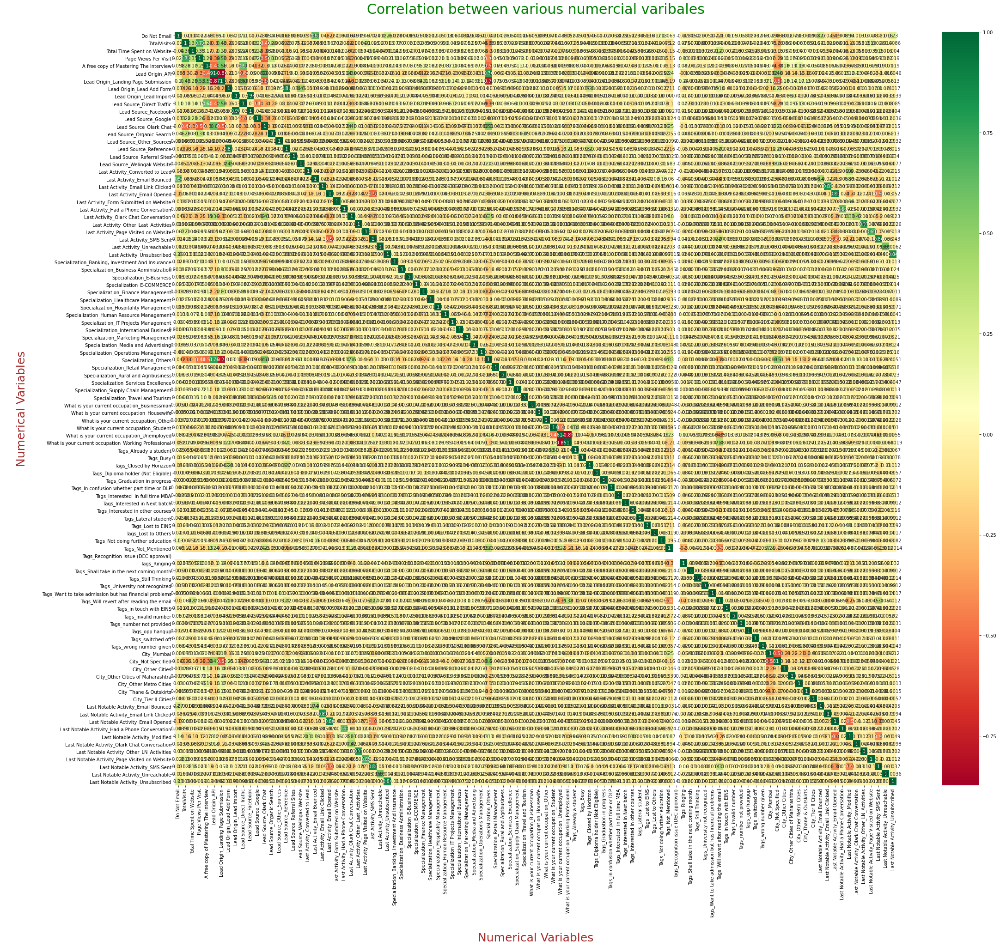

In [202]:
# To recheck the correlation coefficients to know which variables are highly correlated
fig = plt.figure(figsize = (35, 30))
leads_cor = X_train.corr()
sns.heatmap(leads_cor, cmap="RdYlGn", annot = True )
plt.title("Correlation between various numercial varibales\n", fontdict={'fontsize':30,'fontweight':5,'color':'Green'})
plt.xlabel("\nNumerical Variables",fontdict={'fontsize':25,'fontweight':8,'color':'Brown'})
plt.ylabel("\nNumerical Variables\n",fontdict={'fontsize':25,'fontweight':8,'color':'Brown'})
plt.show()


In [203]:
# To collect and see absolute coorelation matrix
cor_matrix = X_train.corr().abs()
cor_matrix


,Do Not Email,TotalVisits,Total Time Spent on Website,Page Views Per Visit,A free copy of Mastering The Interview,Lead Origin_API,Lead Origin_Landing Page Submission,Lead Origin_Lead Add Form,Lead Origin_Lead Import,Lead Source_Direct Traffic,Lead Source_Facebook,Lead Source_Google,Lead Source_Olark Chat,Lead Source_Organic Search,Lead Source_Other_Sources,Lead Source_Reference,Lead Source_Referral Sites,Lead Source_Welingak Website,Last Activity_Converted to Lead,Last Activity_Email Bounced,Last Activity_Email Link Clicked,Last Activity_Email Opened,Last Activity_Form Submitted on Website,Last Activity_Had a Phone Conversation,Last Activity_Olark Chat Conversation,Last Activity_Other_Last_Activities,Last Activity_Page Visited on Website,Last Activity_SMS Sent,Last Activity_Unreachable,Last Activity_Unsubscribed,"Specialization_Banking, Investment And Insurance",Specialization_Business Administration,Specialization_E-Business,Specialization_E-COMMERCE,Specialization_Finance Management,Specialization_Healthcare Management,Specialization_Hospitality Management,Specialization_Human Resource Management,Specialization_IT Projects Management,Specialization_International Business,Specialization_Marketing Management,Specialization_Media and Advertising,Specialization_Operations Management,Specialization_Others,Specialization_Retail Management,Specialization_Rural and Agribusiness,Specialization_Services Excellence,Specialization_Supply Chain Management,Specialization_Travel and Tourism,What is your current occupation_Businessman,What is your current occupation_Housewife,What is your current occupation_Other,What is your current occupation_Student,What is your current occupation_Unemployed,What is your current occupation_Working Professional,Tags_Already a student,Tags_Busy,Tags_Closed by Horizzon,Tags_Diploma holder (Not Eligible),Tags_Graduation in progress,Tags_In confusion whether part time or DLP,Tags_Interested in full time MBA,Tags_Interested in Next batch,Tags_Interested in other courses,Tags_Lateral student,Tags_Lost to EINS,Tags_Lost to Others,Tags_Not doing further education,Tags_Not_Mentioned,Tags_Recognition issue (DEC approval),Tags_Ringing,Tags_Shall take in the next coming month,Tags_Still Thinking,Tags_University not recognized,Tags_Want to take admission but has financial problems,Tags_Will revert after reading the email,Tags_in touch with EINS,Tags_invalid number,Tags_number not provided,Tags_opp hangup,Tags_switched off,Tags_wrong number given,City_Mumbai,City_Not Specified,City_Other Cities,City_Other Cities of Maharashtra,City_Other Metro Cities,City_Thane & Outskirts,City_Tier II Cities,Last Notable Activity_Email Bounced,Last Notable Activity_Email Link Clicked,Last Notable Activity_Email Opened,Last Notable Activity_Had a Phone Conversation,Last Notable Activity_Modified,Last Notable Activity_Olark Chat Conversation,Last Notable Activity_Other_LN_Activities,Last Notable Activity_Page Visited on Website,Last Notable Activity_SMS Sent,Last Notable Activity_Unreachable,Last Notable Activity_Unsubscribed
Do Not Email,1.000000,0.011014,0.039583,0.022101,0.058128,0.084693,0.102124,0.034491,0.016979,0.110350,0.017362,0.073423,0.049909,0.046125,0.001624,0.039236,0.008074,0.003504,0.063358,0.636208,0.042898,0.215949,0.017844,0.001624,0.049437,0.018895,0.066934,0.024499,0.012023,0.258362,0.027692,0.000458,0.015078,0.025105,0.008190,0.011671,0.015134,0.013486,0.059926,0.000836,0.025645,0.008626,0.010287,0.042054,0.014218,0.025857,0.064435,0.001132,0.055530,0.005111,0.008856,0.003730,0.017094,0.037901,0.052422,0.034875,0.015366,0.045504,0.010416,0.020063,0.006260,0.002524,0.005111,0.023426,0.005111,0.035553,0.016738,0.128000,0.069139,NaN,0.023167,0.005111,0.021413,0.005111,0.007229,0.104522,0.011436,0.057454,0.063393,0.002659,0.032002,0.067912,0.039278,0.065750,0.000199,0.007873,0.029939,0.001907,0.017950,0.266607,0.036298,0.186013,0.008856,0.138503,0.013260,0.030290,0.028421,0.030686,0.015775,0.230721
TotalVisits,0.011014

In [204]:
# To find out Upper Trainangle
upper_tri = cor_matrix.where(np.triu(np.ones(cor_matrix.shape), k=1).astype(np.bool))
upper_tri


,Do Not Email,TotalVisits,Total Time Spent on Website,Page Views Per Visit,A free copy of Mastering The Interview,Lead Origin_API,Lead Origin_Landing Page Submission,Lead Origin_Lead Add Form,Lead Origin_Lead Import,Lead Source_Direct Traffic,Lead Source_Facebook,Lead Source_Google,Lead Source_Olark Chat,Lead Source_Organic Search,Lead Source_Other_Sources,Lead Source_Reference,Lead Source_Referral Sites,Lead Source_Welingak Website,Last Activity_Converted to Lead,Last Activity_Email Bounced,Last Activity_Email Link Clicked,Last Activity_Email Opened,Last Activity_Form Submitted on Website,Last Activity_Had a Phone Conversation,Last Activity_Olark Chat Conversation,Last Activity_Other_Last_Activities,Last Activity_Page Visited on Website,Last Activity_SMS Sent,Last Activity_Unreachable,Last Activity_Unsubscribed,"Specialization_Banking, Investment And Insurance",Specialization_Business Administration,Specialization_E-Business,Specialization_E-COMMERCE,Specialization_Finance Management,Specialization_Healthcare Management,Specialization_Hospitality Management,Specialization_Human Resource Management,Specialization_IT Projects Management,Specialization_International Business,Specialization_Marketing Management,Specialization_Media and Advertising,Specialization_Operations Management,Specialization_Others,Specialization_Retail Management,Specialization_Rural and Agribusiness,Specialization_Services Excellence,Specialization_Supply Chain Management,Specialization_Travel and Tourism,What is your current occupation_Businessman,What is your current occupation_Housewife,What is your current occupation_Other,What is your current occupation_Student,What is your current occupation_Unemployed,What is your current occupation_Working Professional,Tags_Already a student,Tags_Busy,Tags_Closed by Horizzon,Tags_Diploma holder (Not Eligible),Tags_Graduation in progress,Tags_In confusion whether part time or DLP,Tags_Interested in full time MBA,Tags_Interested in Next batch,Tags_Interested in other courses,Tags_Lateral student,Tags_Lost to EINS,Tags_Lost to Others,Tags_Not doing further education,Tags_Not_Mentioned,Tags_Recognition issue (DEC approval),Tags_Ringing,Tags_Shall take in the next coming month,Tags_Still Thinking,Tags_University not recognized,Tags_Want to take admission but has financial problems,Tags_Will revert after reading the email,Tags_in touch with EINS,Tags_invalid number,Tags_number not provided,Tags_opp hangup,Tags_switched off,Tags_wrong number given,City_Mumbai,City_Not Specified,City_Other Cities,City_Other Cities of Maharashtra,City_Other Metro Cities,City_Thane & Outskirts,City_Tier II Cities,Last Notable Activity_Email Bounced,Last Notable Activity_Email Link Clicked,Last Notable Activity_Email Opened,Last Notable Activity_Had a Phone Conversation,Last Notable Activity_Modified,Last Notable Activity_Olark Chat Conversation,Last Notable Activity_Other_LN_Activities,Last Notable Activity_Page Visited on Website,Last Notable Activity_SMS Sent,Last Notable Activity_Unreachable,Last Notable Activity_Unsubscribed
Do Not Email,NaN,0.011014,0.039583,0.022101,0.058128,0.084693,0.102124,0.034491,0.016979,0.110350,0.017362,0.073423,0.049909,0.046125,0.001624,0.039236,0.008074,0.003504,0.063358,0.636208,0.042898,0.215949,0.017844,0.001624,0.049437,0.018895,0.066934,0.024499,0.012023,0.258362,0.027692,0.000458,0.015078,0.025105,0.008190,0.011671,0.015134,0.013486,0.059926,0.000836,0.025645,0.008626,0.010287,0.042054,0.014218,0.025857,0.064435,0.001132,0.055530,0.005111,0.008856,0.003730,0.017094,0.037901,0.052422,0.034875,0.015366,0.045504,0.010416,0.020063,0.006260,0.002524,0.005111,0.023426,0.005111,0.035553,0.016738,0.128000,0.069139,NaN,0.023167,0.005111,0.021413,0.005111,0.007229,0.104522,0.011436,0.057454,0.063393,0.002659,0.032002,0.067912,0.039278,0.065750,0.000199,0.007873,0.029939,0.001907,0.017950,0.266607,0.036298,0.186013,0.008856,0.138503,0.013260,0.030290,0.028421,0.030686,0.015775,0.230721
TotalVisits,NaN,NaN,0.359

In [205]:
# To fid out the features which are highly correlated
to_drop = [column for column in upper_tri.columns if any(upper_tri[column] > 0.8)]
to_drop


['Lead Origin_Landing Page Submission',
 'Lead Source_Facebook',
 'Lead Source_Reference',
 'What is your current occupation_Working Professional',
 'Last Notable Activity_Email Link Clicked',
 'Last Notable Activity_Email Opened',
 'Last Notable Activity_SMS Sent',
 'Last Notable Activity_Unsubscribed']

#### Dropping highly correlated variables.

In [206]:
X_train = X_train.drop(['Lead Origin_Landing Page Submission','Lead Source_Facebook', 'Lead Source_Reference','What is your current occupation_Working Professional',
                                    'Last Notable Activity_Email Link Clicked', 'Last Notable Activity_Email Opened', 'Last Notable Activity_SMS Sent', 'Last Notable Activity_Unsubscribed'], 1)
X_test = X_test.drop(['Lead Origin_Landing Page Submission','Lead Source_Facebook', 'Lead Source_Reference','What is your current occupation_Working Professional',
                                    'Last Notable Activity_Email Link Clicked', 'Last Notable Activity_Email Opened', 'Last Notable Activity_SMS Sent', 'Last Notable Activity_Unsubscribed'], 1)


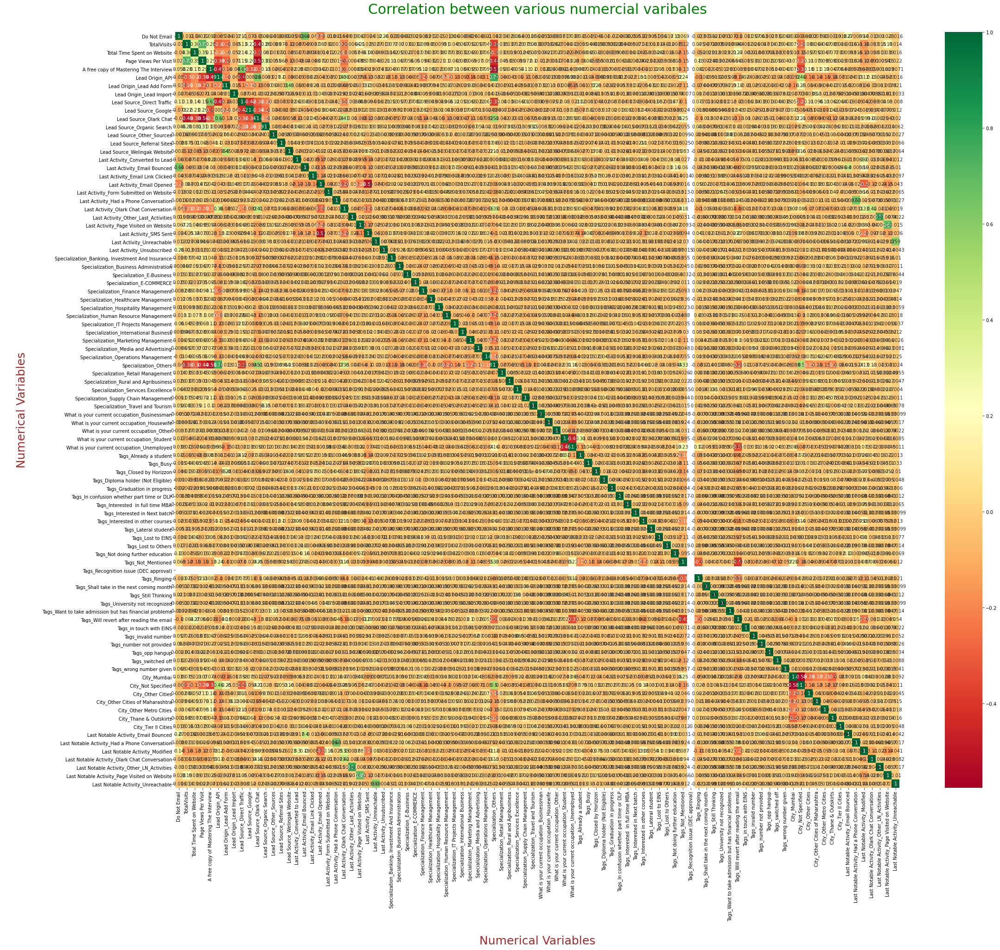

In [207]:
# To recheck the correlation coefficients to know which variables are highly correlated
fig = plt.figure(figsize = (35, 30))
leads_cor_1 = X_train.corr()
sns.heatmap(leads_cor_1, cmap="RdYlGn", annot = True )
plt.title("Correlation between various numercial varibales\n", fontdict={'fontsize':30,'fontweight':5,'color':'Green'})
plt.xlabel("\nNumerical Variables",fontdict={'fontsize':25,'fontweight':8,'color':'Brown'})
plt.ylabel("\nNumerical Variables\n",fontdict={'fontsize':25,'fontweight':8,'color':'Brown'})
plt.show()


### Step 8. Building the model using statsmodel, for the detailed statistics

This time, we will be using the **Logistic Regression function from SciKit Learn** for its compatibility with RFE (which is a utility from sklearn)


#### Model 1.

In [208]:
# Logistic regression model
leads_logm1 = sm.GLM(y_train,(sm.add_constant(X_train)), family = sm.families.Binomial())
print(leads_logm1.fit().summary())


                 Generalized Linear Model Regression Results                  
Dep. Variable:              Converted   No. Observations:                 6246
Model:                            GLM   Df Residuals:                     6158
Model Family:                Binomial   Df Model:                           87
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                    nan
Date:                Sun, 20 Jun 2021   Deviance:                          nan
Time:                        10:19:37   Pearson chi2:                 2.45e+18
No. Iterations:                   100                                         
Covariance Type:            nonrobust                                         
                                                             coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------

In [209]:
# To check shape of the train data
X_train.shape


(6246, 92)

In [210]:
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif_1 = pd.DataFrame()
col_1 = X_train.columns
vif_1['Features'] = X_train[col_1].columns
vif_1['VIF'] = [variance_inflation_factor(X_train[col_1].values, i) for i in range(X_train[col_1].shape[1])]
vif_1['VIF'] = round(vif_1['VIF'], 2)
vif_1 = vif_1.sort_values(by = "VIF", ascending = False)
vif_1


,Features,VIF
45,Specialization_Travel and Tourism,inf
80,City_Other Cities,inf
57,Tags_Interested in full time MBA,inf
56,Tags_In confusion whether part time or DLP,inf
55,Tags_Graduation in progress,inf
54,Tags_Diploma holder (Not Eligible),inf
53,Tags_Closed by Horizzon,inf
52,Tags_Busy,inf
51,Tags_Already a student,inf
81,City_Other Cities of Maharashtra,inf


### Feature Scalling Using RFE

In [211]:
# Running RFE with the output number of the variable equal to 25
lgreg_lead = LogisticRegression()
lgreg_lead.fit(X_train, y_train)


LogisticRegression()

In [212]:
# Running RFE
leads_rfe = RFE(lgreg_lead, 20)            
leads_rfe = leads_rfe.fit(X_train, y_train)


In [213]:
list(zip(X_train.columns, leads_rfe.support_, leads_rfe.ranking_))


[('Do Not Email', False, 2),
 ('TotalVisits', False, 36),
 ('Total Time Spent on Website', False, 5),
 ('Page Views Per Visit', False, 35),
 ('A free copy of Mastering The Interview', False, 71),
 ('Lead Origin_API', False, 53),
 ('Lead Origin_Lead Add Form', False, 4),
 ('Lead Origin_Lead Import', False, 8),
 ('Lead Source_Direct Traffic', False, 44),
 ('Lead Source_Google', False, 49),
 ('Lead Source_Olark Chat', False, 7),
 ('Lead Source_Organic Search', False, 48),
 ('Lead Source_Other_Sources', False, 39),
 ('Lead Source_Referral Sites', False, 38),
 ('Lead Source_Welingak Website', True, 1),
 ('Last Activity_Converted to Lead', False, 21),
 ('Last Activity_Email Bounced', False, 14),
 ('Last Activity_Email Link Clicked', False, 19),
 ('Last Activity_Email Opened', False, 50),
 ('Last Activity_Form Submitted on Website', False, 6),
 ('Last Activity_Had a Phone Conversation', True, 1),
 ('Last Activity_Olark Chat Conversation', False, 20),
 ('Last Activity_Other_Last_Activities', F

In [214]:
# To collect the columns supported by RFE
col_leads = X_train.columns[leads_rfe.support_]
col_leads


Index(['Lead Source_Welingak Website', 'Last Activity_Had a Phone Conversation', 'Last Activity_SMS Sent', 'Tags_Already a student', 'Tags_Closed by Horizzon', 'Tags_Diploma holder (Not Eligible)', 'Tags_Interested  in full time MBA', 'Tags_Interested in other courses', 'Tags_Lost to EINS', 'Tags_Not doing further education', 'Tags_Ringing', 'Tags_Will revert after reading the email', 'Tags_invalid number', 'Tags_number not provided', 'Tags_opp hangup', 'Tags_switched off', 'Tags_wrong number given', 'City_Not Specified', 'Last Notable Activity_Modified', 'Last Notable Activity_Olark Chat Conversation'], dtype='object')

In [215]:
# To drop rest of the data from RFE
X_train.columns[~leads_rfe.support_]


Index(['Do Not Email', 'TotalVisits', 'Total Time Spent on Website', 'Page Views Per Visit', 'A free copy of Mastering The Interview', 'Lead Origin_API', 'Lead Origin_Lead Add Form', 'Lead Origin_Lead Import', 'Lead Source_Direct Traffic', 'Lead Source_Google', 'Lead Source_Olark Chat', 'Lead Source_Organic Search', 'Lead Source_Other_Sources', 'Lead Source_Referral Sites', 'Last Activity_Converted to Lead', 'Last Activity_Email Bounced', 'Last Activity_Email Link Clicked', 'Last Activity_Email Opened', 'Last Activity_Form Submitted on Website', 'Last Activity_Olark Chat Conversation', 'Last Activity_Other_Last_Activities', 'Last Activity_Page Visited on Website', 'Last Activity_Unreachable', 'Last Activity_Unsubscribed', 'Specialization_Banking, Investment And Insurance', 'Specialization_Business Administration', 'Specialization_E-Business', 'Specialization_E-COMMERCE', 'Specialization_Finance Management', 'Specialization_Healthcare Management',
       'Specialization_Hospitality Mana

#### Model 2

In [216]:
# Adding A variable
X_train_sm = sm.add_constant(X_train[col_leads])

# Running the model
leads_logm2 = sm.GLM(y_train, X_train_sm, family = sm.families.Binomial())
leads_res = leads_logm2.fit()


In [217]:
# To print 
print(leads_res.summary())


                 Generalized Linear Model Regression Results                  
Dep. Variable:              Converted   No. Observations:                 6246
Model:                            GLM   Df Residuals:                     6225
Model Family:                Binomial   Df Model:                           20
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -1323.7
Date:                Sun, 20 Jun 2021   Deviance:                       2647.4
Time:                        10:19:57   Pearson chi2:                 1.34e+04
No. Iterations:                    23                                         
Covariance Type:            nonrobust                                         
                                                    coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------

### Checking VIF

Variance inflation Factor or VIF, gives a basic quantitative idea how much the feature variables are correlated with each other. It is an extremely important parameter to test our linear model. The formula for calculating VIF is:

### $ VIF_i = \frac{1}{1 - {R_i}^2} $

#### We could have:
- High P-value, High VIF---Remove these variables
- High-low:
     - High P, low VIF--- Remove these variables first
     - Low P, high VIF--- Remove these after the one above
     - Low P, Low VIF--- Keep these variables
     
     
 - VIF Values
      - VIF < 5 is Good --- no need to eliminate this variable
      - VIF > 5 can be Okay --- need to inspect
      - VIF > 10 is definitely high and the respective variable need to remove
 
 - P value < 0.05 is Good.

In [218]:
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
leads_vif = pd.DataFrame()
leads_vif['Features'] = X_train[col_leads].columns
leads_vif['VIF'] = [variance_inflation_factor(X_train[col_leads].values, i) for i in range(X_train[col_leads].shape[1])]
leads_vif['VIF'] = round(leads_vif['VIF'], 2)
leads_vif = leads_vif.sort_values(by = "VIF", ascending = False)
leads_vif


,Features,VIF
0,Lead Source_Welingak Website,1.07
4,Tags_Closed by Horizzon,1.06
8,Tags_Lost to EINS,1.04
15,Tags_switched off,1.03
9,Tags_Not doing further education,1.03
6,Tags_Interested in full time MBA,1.02
19,Last Notable Activity_Olark Chat Conversation,1.02
5,Tags_Diploma holder (Not Eligible),1.01
1,Last Activity_Had a Phone Conversation,1.01
12,Tags_invalid number,1.01


In [219]:
# Dropping a variable which has higher P and/or higher VIF value
col_leads = col_leads.drop('Tags_number not provided',1)


In [220]:
# To see the variables
col_leads


Index(['Lead Source_Welingak Website', 'Last Activity_Had a Phone Conversation', 'Last Activity_SMS Sent', 'Tags_Already a student', 'Tags_Closed by Horizzon', 'Tags_Diploma holder (Not Eligible)', 'Tags_Interested  in full time MBA', 'Tags_Interested in other courses', 'Tags_Lost to EINS', 'Tags_Not doing further education', 'Tags_Ringing', 'Tags_Will revert after reading the email', 'Tags_invalid number', 'Tags_opp hangup', 'Tags_switched off', 'Tags_wrong number given', 'City_Not Specified', 'Last Notable Activity_Modified', 'Last Notable Activity_Olark Chat Conversation'], dtype='object')

In [221]:
# To check shape
col_leads.shape


(19,)

#### Model 3.

In [222]:
# Adding A variable
X_train_sm = sm.add_constant(X_train[col_leads])

# Running the model
leads_logm3 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
leads_res = leads_logm3.fit()


In [223]:
# Get output of the model summary
print(leads_res.summary())


                 Generalized Linear Model Regression Results                  
Dep. Variable:              Converted   No. Observations:                 6246
Model:                            GLM   Df Residuals:                     6226
Model Family:                Binomial   Df Model:                           19
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -1334.6
Date:                Sun, 20 Jun 2021   Deviance:                       2669.1
Time:                        10:19:58   Pearson chi2:                 1.29e+04
No. Iterations:                    22                                         
Covariance Type:            nonrobust                                         
                                                    coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------

In [224]:
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
leads_vif = pd.DataFrame()
leads_vif['Features'] = X_train[col_leads].columns
leads_vif['VIF'] = [variance_inflation_factor(X_train[col_leads].values, i) for i in range(X_train[col_leads].shape[1])]
leads_vif['VIF'] = round(leads_vif['VIF'], 2)
leads_vif = leads_vif.sort_values(by = "VIF", ascending = False)
leads_vif


,Features,VIF
0,Lead Source_Welingak Website,1.07
4,Tags_Closed by Horizzon,1.06
8,Tags_Lost to EINS,1.04
14,Tags_switched off,1.03
9,Tags_Not doing further education,1.03
6,Tags_Interested in full time MBA,1.02
18,Last Notable Activity_Olark Chat Conversation,1.02
5,Tags_Diploma holder (Not Eligible),1.01
1,Last Activity_Had a Phone Conversation,1.01
12,Tags_invalid number,1.01


#### Model 4.

In [225]:
# Dropping a variable which has higher P and/or higher VIF value
col_leads = col_leads.drop('Tags_wrong number given',1)


In [226]:
# Adding A variable
X_train_sm = sm.add_constant(X_train[col_leads])

# Running the model
leads_logm4 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
leads_res = leads_logm4.fit()


In [227]:
# To get output of summary
print(leads_res.summary())


                 Generalized Linear Model Regression Results                  
Dep. Variable:              Converted   No. Observations:                 6246
Model:                            GLM   Df Residuals:                     6227
Model Family:                Binomial   Df Model:                           18
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -1352.5
Date:                Sun, 20 Jun 2021   Deviance:                       2705.0
Time:                        10:19:58   Pearson chi2:                 1.25e+04
No. Iterations:                     8                                         
Covariance Type:            nonrobust                                         
                                                    coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------

In [228]:
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
leads_vif = pd.DataFrame()
leads_vif['Features'] = X_train[col_leads].columns
leads_vif['VIF'] = [variance_inflation_factor(X_train[col_leads].values, i) for i in range(X_train[col_leads].shape[1])]
leads_vif['VIF'] = round(leads_vif['VIF'], 2)
leads_vif = leads_vif.sort_values(by = "VIF", ascending = False)
leads_vif


,Features,VIF
0,Lead Source_Welingak Website,1.07
4,Tags_Closed by Horizzon,1.06
8,Tags_Lost to EINS,1.04
14,Tags_switched off,1.03
9,Tags_Not doing further education,1.03
6,Tags_Interested in full time MBA,1.02
17,Last Notable Activity_Olark Chat Conversation,1.02
5,Tags_Diploma holder (Not Eligible),1.01
1,Last Activity_Had a Phone Conversation,1.01
12,Tags_invalid number,1.01


##### Inferences:
- This final model (4) seems to be good as all 'P' and 'VIF' values are in control

##### Getting the predicted values on the train set

In [229]:
# Getting the predicted values on the train set
y_train_pred = leads_res.predict(X_train_sm)
y_train_pred[:10]


6676    0.961066
6138    0.994982
8650    0.961066
3423    0.035676
6552    0.174181
1696    0.174181
2110    0.994982
6830    0.812377
2581    0.006015
5927    0.174181
dtype: float64

In [230]:
# Getting the predicted values on the train set
y_train_pred = y_train_pred.values.reshape(-1)
y_train_pred[:10]


array([0.96106647, 0.9949823 , 0.96106647, 0.03567628, 0.17418082,
       0.17418082, 0.9949823 , 0.81237679, 0.0060147 , 0.17418082])

#### Creating a dataframe with the actual Conversion flag and the predicted probabilities

In [231]:
y_train_pred_final = pd.DataFrame({'Converted':y_train.values, 'Converted_Prob':y_train_pred})
y_train_pred_final['Prospect_ID'] = y_train.index
y_train_pred_final.head()


,Converted,Converted_Prob,Prospect_ID
0,1,0.961066,6676
1,1,0.994982,6138
2,1,0.961066,8650
3,0,0.035676,3423
4,0,0.174181,6552


#### Creating new column 'Predicted' with 1 if Converted_Prob > 0.5 else 0

In [232]:
# Creating new column
y_train_pred_final['Predicted'] = y_train_pred_final.Converted_Prob.map(lambda x: 1 if x > 0.5 else 0)

# Let's see the head
y_train_pred_final.head()


,Converted,Converted_Prob,Prospect_ID,Predicted
0,1,0.961066,6676,1
1,1,0.994982,6138,1
2,1,0.961066,8650,1
3,0,0.035676,3423,0
4,0,0.174181,6552,0


In [233]:
# Confusion matrix 
leads_confusion = metrics.confusion_matrix(y_train_pred_final.Converted, y_train_pred_final.Predicted )
leads_confusion


array([[3698,  173],
       [ 331, 2044]], dtype=int64)

In [234]:
# Let's see the overall accuracy.
Over_Lead_Acc = round(metrics.accuracy_score(y_train_pred_final.Converted, y_train_pred_final.Predicted),3)
Over_Lead_Acc


0.919

##### The overall accuracy of the model is 91.9% at the moment.

### Metrics beyond simply accuracy

In [235]:
# To get Tp, TN, FP, FN
TP = leads_confusion[1,1] # true positive 
TN = leads_confusion[0,0] # true negatives
FP = leads_confusion[0,1] # false positives
FN = leads_confusion[1,0] # false negatives


In [236]:
# Check the sensitivity of our logistic regression model
round(TP / float(TP+FN),2)


0.86

In [237]:
# Check the calculate specificity
round(TN / float(TN+FP),2)


0.96

In [238]:
# Calculate false postive rate - predicting conversion when lead doesn't convert
round(FP/ float(TN+FP),2)


0.04

In [239]:
# positive predictive value 
round(TP / float(TP+FP),2)


0.92

In [240]:
# Negative predictive value
round(TN / float(TN+ FN),2)


0.92

#### Inferences:
- Accuracy - 91.9%
- Sensitivity - 86%
- Specificity - 96%

- False Positive Rate - 4%

- Positive Predictive Value - 92%
- Negative Predictive Value - 92%


### Step 9: Plotting the ROC Curve

#### An ROC curve demonstrates several things:

- It shows the tradeoff between sensitivity and specificity (any increase in sensitivity will be accompanied by a decrease in specificity).
- The closer the curve follows the left-hand border and then the top border of the ROC space, the more accurate the test.
- The closer the curve comes to the 45-degree diagonal of the ROC space, the less accurate the test.

In [241]:
def draw_roc(actual, probs):
    fpr, tpr, thresholds = metrics.roc_curve(actual, probs, drop_intermediate = False)
    auc_score = metrics.roc_auc_score(actual, probs)
    plt.figure(figsize=(8, 8))
    plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score)
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()

    return None


In [242]:
# Find out the ROC variables
fpr, tpr, thresholds = metrics.roc_curve(y_train_pred_final.Converted, y_train_pred_final.Predicted, drop_intermediate = False )


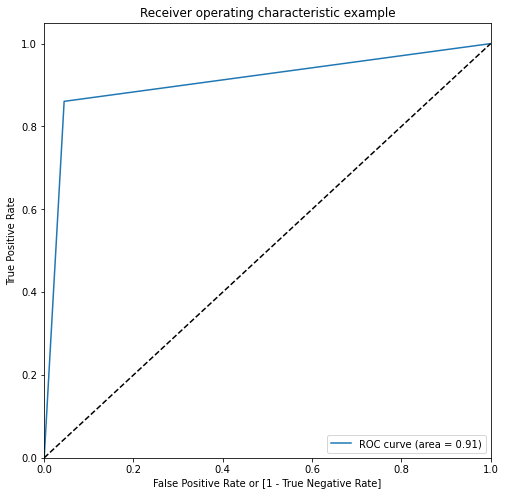

In [243]:
# To draw ROC curve 
draw_roc(y_train_pred_final.Converted, y_train_pred_final.Predicted)


#### Inferences:
- Here Area under the ROC curve  (AOC) is $91$%.

### Step 10: Finding Optimal Cutoff Point

- Optimal cutoff probability is that prob where we get balanced sensitivity and specificity

In [244]:
# Let's create columns with different probability cutoffs 
numbers = [float(x)/10 for x in range(10)]
for i in numbers:
    y_train_pred_final[i]= y_train_pred_final.Converted_Prob.map(lambda x: 1 if x > i else 0)


In [245]:
# To check the head
y_train_pred_final.head()


,Converted,Converted_Prob,Prospect_ID,Predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
0,1,0.961066,6676,1,1,1,1,1,1,1,1,1,1,1
1,1,0.994982,6138,1,1,1,1,1,1,1,1,1,1,1
2,1,0.961066,8650,1,1,1,1,1,1,1,1,1,1,1
3,0,0.035676,3423,0,1,0,0,0,0,0,0,0,0,0
4,0,0.174181,6552,0,1,1,0,0,0,0,0,0,0,0


In [246]:
# Now let's calculate accuracy sensitivity and specificity for various probability cutoffs.
cutoff_df = pd.DataFrame(columns = ['Conv_Probs','Accuracy','Sensitivity','Specificity'])

# TP = leads_confusion[1,1] # true positive 
# TN = leads_confusion[0,0] # true negatives
# FP = leads_confusion[0,1] # false positives
# FN = leads_confusion[1,0] # false negatives

num = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
for i in num:
    cm1 = metrics.confusion_matrix(y_train_pred_final.Converted, y_train_pred_final[i] )
    total1=sum(sum(cm1))
    accuracy = (cm1[0,0]+cm1[1,1])/total1
    speci = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    sensi = cm1[1,1]/(cm1[1,0]+cm1[1,1])
    
    cutoff_df.loc[i] =[i, accuracy, sensi, speci]
    

In [247]:
# To get output 
print(cutoff_df)


     Conv_Probs  Accuracy  Sensitivity  Specificity
0.0         0.0  0.380243     1.000000     0.000000
0.1         0.1  0.790106     0.971368     0.678894
0.2         0.2  0.907461     0.917895     0.901059
0.3         0.3  0.925552     0.902316     0.939809
0.4         0.4  0.924752     0.899789     0.940067
0.5         0.5  0.919308     0.860632     0.955309
0.6         0.6  0.919148     0.858947     0.956084
0.7         0.7  0.904419     0.773895     0.984500
0.8         0.8  0.904259     0.773474     0.984500
0.9         0.9  0.874640     0.685053     0.990958


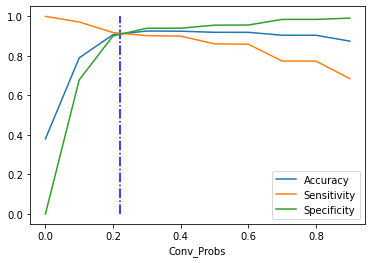

In [248]:
# To plot accuracy sensitivity and specificity for various probabilities.
cutoff_df.plot.line(x='Conv_Probs', y=['Accuracy','Sensitivity','Specificity'])
plt.vlines(0.22, ymax=1, ymin=0, colors='blue',linestyles='dashdot')
plt.legend()
plt.show()


#### Inferences
- From the curve above, $0.22$ is the optimum point to take it as a cutoff probability.

In [249]:
# Selecting 0.22 as a Cut-off point.
y_train_pred_final['final_predicted'] = y_train_pred_final.Converted_Prob.map(lambda x: 1 if x > 0.22 else 0)
y_train_pred_final.head()


,Converted,Converted_Prob,Prospect_ID,Predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,final_predicted
0,1,0.961066,6676,1,1,1,1,1,1,1,1,1,1,1,1
1,1,0.994982,6138,1,1,1,1,1,1,1,1,1,1,1,1
2,1,0.961066,8650,1,1,1,1,1,1,1,1,1,1,1,1
3,0,0.035676,3423,0,1,0,0,0,0,0,0,0,0,0,0
4,0,0.174181,6552,0,1,1,0,0,0,0,0,0,0,0,0


In [250]:
# To check the overall accuracy.
round(metrics.accuracy_score(y_train_pred_final.Converted, y_train_pred_final.Predicted),3)


0.919

In [251]:
# To get confusion matrics
leads_confusion_2 = metrics.confusion_matrix(y_train_pred_final.Converted, y_train_pred_final.Predicted)
leads_confusion_2


array([[3698,  173],
       [ 331, 2044]], dtype=int64)

In [252]:
# To recheck the value of TP, TN, FP, FN
TP_2 = leads_confusion_2[1,1] # true positive 
TN_2 = leads_confusion_2[0,0] # true negatives
FP_2 = leads_confusion_2[0,1] # false positives
FN_2 = leads_confusion_2[1,0] # false negatives


In [253]:
# To see the sensitivity of our logistic regression model
round(TP_2/ float(TP_2+FN_2),2)


0.86

In [254]:
# To Let us calculate specificity
round(TN_2/ float(TN_2+FP_2),2)


0.96

In [255]:
# Calculate false postive rate - predicting conversion when lead doesn't convert
round(FP_2/ float(TN_2+FP_2),2)


0.04

In [256]:
# Positive predictive value 
round(TP_2/ float(TP_2+FP_2),2)


0.92

In [257]:
# Negative predictive value
round(TN_2 / float(TN_2 + FN_2),2)


0.92

#### Inferences:
- Accuracy - 91.9%
- Sensitivity - 86%
- Specificity - 96%

- False Positive Rate - 4%

- Positive Predictive Value - 92%
- Negative Predictive Value - 92%


#### Precision and Recall

- Looking at the confusion matrix again

In [258]:
# To get confusion matrics
leads_confusion_2 = metrics.confusion_matrix(y_train_pred_final.Converted, y_train_pred_final.Predicted)
leads_confusion_2


array([[3698,  173],
       [ 331, 2044]], dtype=int64)

### Precision
TP / TP + FP

In [259]:
# To find out the value of Precision
round(leads_confusion_2[1,1]/(leads_confusion_2[0,1]+leads_confusion_2[1,1]),2)


0.92

### Recall
TP / TP + FN

In [260]:
# To find out the value of Recall
round(leads_confusion_2[1,1]/(leads_confusion_2[1,0]+leads_confusion_2[1,1]),2)


0.86

- Using sklearn utilities for the same

In [261]:
# To find out Precision Score
pre_leads_1 = round(precision_score(y_train_pred_final.Converted, y_train_pred_final.Predicted),2)
pre_leads_1

0.92

In [262]:
# To find out Recall Score
recall_leads_1 = round(recall_score(y_train_pred_final.Converted, y_train_pred_final.Predicted),2)
recall_leads_1

0.86

#### Inferences:
- Precision - 92%
- Recall - 86%

#### To find out F1-Score
- F1-score is the Harmonic mean of the Precision and Recall
- F1 Score = 2 $*$ ((Precision $*$ Recall)/(Precision $+$ Recall))

In [263]:
# To get the F1-Score 
F1_Score_1 = round(2*((pre_leads_1 * recall_leads_1)/(pre_leads_1 + recall_leads_1)),2)
F1_Score_1


0.89

#### Inferences: 
- F1-Score for Train data is $89$%.

### Precision and recall tradeoff

In [264]:
# To get the Precision, Recall, Threshold values
pre1, rec1, thresholds1 = precision_recall_curve(y_train_pred_final.Converted, y_train_pred_final.Converted_Prob)


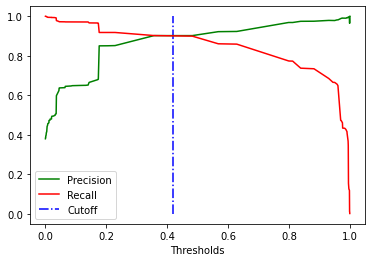

In [265]:
# TO plot te grpah between Precision and Recall and get the Cut-Off probability
plt.plot(thresholds1, pre1[:-1], "g-", label="Precision")
plt.plot(thresholds1, rec1[:-1], "r-", label="Recall")
plt.xlabel("Thresholds")
plt.vlines(0.42,ymin=0, ymax=1, linestyles='dashdot',label='Cutoff',colors='blue')
plt.legend()
plt.show()


#### Inferences: 
- From the above curve we found new optimum point $0.42$ is the optimum point to take it as a cutoff probability.

### Step 11: Making predictions on the test set

In [266]:
# To Create List of variables
X_leads_num_vars_1 = ['TotalVisits', 'Total Time Spent on Website','Page Views Per Visit']


In [267]:
# Apply scaler() to all the columns except the 'dummy' variables

# To fit all the test data
X_test[X_leads_num_vars_1] = X_leads_scaler.fit_transform(X_test[X_leads_num_vars_1])


In [268]:
# To check all the variables
X_test.head()


,Do Not Email,TotalVisits,Total Time Spent on Website,Page Views Per Visit,A free copy of Mastering The Interview,Lead Origin_API,Lead Origin_Lead Add Form,Lead Origin_Lead Import,Lead Source_Direct Traffic,Lead Source_Google,Lead Source_Olark Chat,Lead Source_Organic Search,Lead Source_Other_Sources,Lead Source_Referral Sites,Lead Source_Welingak Website,Last Activity_Converted to Lead,Last Activity_Email Bounced,Last Activity_Email Link Clicked,Last Activity_Email Opened,Last Activity_Form Submitted on Website,Last Activity_Had a Phone Conversation,Last Activity_Olark Chat Conversation,Last Activity_Other_Last_Activities,Last Activity_Page Visited on Website,Last Activity_SMS Sent,Last Activity_Unreachable,Last Activity_Unsubscribed,"Specialization_Banking, Investment And Insurance",Specialization_Business Administration,Specialization_E-Business,Specialization_E-COMMERCE,Specialization_Finance Management,Specialization_Healthcare Management,Specialization_Hospitality Management,Specialization_Human Resource Management,Specialization_IT Projects Management,Specialization_International Business,Specialization_Marketing Management,Specialization_Media and Advertising,Specialization_Operations Management,Specialization_Others,Specialization_Retail Management,Specialization_Rural and Agribusiness,Specialization_Services Excellence,Specialization_Supply Chain Management,Specialization_Travel and Tourism,What is your current occupation_Businessman,What is your current occupation_Housewife,What is your current occupation_Other,What is your current occupation_Student,What is your current occupation_Unemployed,Tags_Already a student,Tags_Busy,Tags_Closed by Horizzon,Tags_Diploma holder (Not Eligible),Tags_Graduation in progress,Tags_In confusion whether part time or DLP,Tags_Interested in full time MBA,Tags_Interested in Next batch,Tags_Interested in other courses,Tags_Lateral student,Tags_Lost to EINS,Tags_Lost to Others,Tags_Not doing further education,Tags_Not_Mentioned,Tags_Recognition issue (DEC approval),Tags_Ringing,Tags_Shall take in the next coming month,Tags_Still Thinking,Tags_University not recognized,Tags_Want to take admission but has financial problems,Tags_Will revert after reading the email,Tags_in touch with EINS,Tags_invalid number,Tags_number not provided,Tags_opp hangup,Tags_switched off,Tags_wrong number given,City_Mumbai,City_Not Specified,City_Other Cities,City_Other Cities of Maharashtra,City_Other Metro Cities,City_Thane & Outskirts,City_Tier II Cities,Last Notable Activity_Email Bounced,Last Notable Activity_Had a Phone Conversation,Last Notable Activity_Modified,Last Notable Activity_Olark Chat Conversation,Last Notable Activity_Other_LN_Activities,Last Notable Activity_Page Visited on Website,Last Notable Activity_Unreachable
7625,0,-0.397342,2.145058,-0.164140,1,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
5207,0,0.277837,0.772700,0.876565,1,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0
2390,0,-1.072521,-0.885722,-1.204846,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
4362,0,-0.397342,-0.451952,-0.164140,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
1023,0,3.991321,-0.293028,1.396918,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0


In [269]:
# To check the shape
X_test.shape


(2678, 92)

In [270]:
# TO see columns name
col_leads


Index(['Lead Source_Welingak Website', 'Last Activity_Had a Phone Conversation', 'Last Activity_SMS Sent', 'Tags_Already a student', 'Tags_Closed by Horizzon', 'Tags_Diploma holder (Not Eligible)', 'Tags_Interested  in full time MBA', 'Tags_Interested in other courses', 'Tags_Lost to EINS', 'Tags_Not doing further education', 'Tags_Ringing', 'Tags_Will revert after reading the email', 'Tags_invalid number', 'Tags_opp hangup', 'Tags_switched off', 'City_Not Specified', 'Last Notable Activity_Modified', 'Last Notable Activity_Olark Chat Conversation'], dtype='object')

In [271]:
# Include all the column names in Test data and 
X_test = X_test[col_leads]
X_test.head()


,Lead Source_Welingak Website,Last Activity_Had a Phone Conversation,Last Activity_SMS Sent,Tags_Already a student,Tags_Closed by Horizzon,Tags_Diploma holder (Not Eligible),Tags_Interested in full time MBA,Tags_Interested in other courses,Tags_Lost to EINS,Tags_Not doing further education,Tags_Ringing,Tags_Will revert after reading the email,Tags_invalid number,Tags_opp hangup,Tags_switched off,City_Not Specified,Last Notable Activity_Modified,Last Notable Activity_Olark Chat Conversation
7625,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5207,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
2390,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0
4362,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
1023,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0


In [272]:
# To check the shape
X_test.shape


(2678, 18)

In [273]:
# Adding constant
X_test_sm = sm.add_constant(X_test)

# Making prediction
y_test_pred = leads_res.predict(X_test_sm)


In [274]:
# To get predicted data
y_test_pred[:10]


7625    0.007520
5207    0.961066
2390    0.998862
4362    0.036564
1023    0.015356
8226    0.961066
3079    0.174181
530     0.007520
7873    0.035676
5146    0.994982
dtype: float64

In [275]:
# Converting y_test_pred to a dataframe 
y_test_pred_leads = pd.DataFrame(y_test_pred)


In [276]:
# To see the variables title
y_test_pred_leads.head()


,0
7625,0.007520
5207,0.961066
2390,0.998862
4362,0.036564
1023,0.015356


In [277]:
# Converting y_test to dataframe
y_leads_test_df = pd.DataFrame(y_test)


In [278]:
y_leads_test_df.head()

,Converted
7625,0
5207,1
2390,1
4362,0
1023,0


In [279]:
# Putting Prospect_ID to index
y_leads_test_df['Prospect_ID'] = y_leads_test_df.index


In [280]:
y_leads_test_df.head()


,Converted,Prospect_ID
7625,0,7625
5207,1,5207
2390,1,2390
4362,0,4362
1023,0,1023


In [281]:
# Removing index for both dataframes to append them side by side 
y_test_pred_leads.reset_index(drop=True, inplace=True)
y_leads_test_df.reset_index(drop=True, inplace=True)


In [282]:
# Appending y_test_pred_leads and y_leads_test_df
y_test_pred_final = pd.concat([y_leads_test_df, y_test_pred_leads],axis=1)


In [283]:
# To get heads o
y_test_pred_final.head()


,Converted,Prospect_ID,0
0,0,7625,0.007520
1,1,5207,0.961066
2,1,2390,0.998862
3,0,4362,0.036564
4,0,1023,0.015356


In [284]:
# Renaming the column 
y_test_pred_final = y_test_pred_final.rename(columns={ 0 : 'Converted_Prob'})


In [285]:
# Rearranging the columns
y_test_pred_final = y_test_pred_final.reindex(['Prospect_ID','Converted','Converted_Prob'], axis=1)


In [286]:
# Let's see the head of y_test_pred_final
y_test_pred_final.head()


,Prospect_ID,Converted,Converted_Prob
0,7625,0,0.007520
1,5207,1,0.961066
2,2390,1,0.998862
3,4362,0,0.036564
4,1023,0,0.015356


In [287]:
# To check the shape of the dataframe
y_test_pred_final.shape


(2678, 3)

In [288]:
# To add Final_Predicated column'
y_test_pred_final['Final_predicted'] = y_test_pred_final.Converted_Prob.map(lambda x: 1 if x > 0.42 else 0)


In [289]:
# To Check the column titles/variable's name of dataframe
y_test_pred_final.head()


,Prospect_ID,Converted,Converted_Prob,Final_predicted
0,7625,0,0.007520,0
1,5207,1,0.961066,1
2,2390,1,0.998862,1
3,4362,0,0.036564,0
4,1023,0,0.015356,0


In [290]:
y_test_pred_final.shape


(2678, 4)

In [291]:
# To check the overall accuracy.
accuracy_score = round(metrics.accuracy_score(y_test_pred_final.Converted, y_test_pred_final.Final_predicted), 2)
accuracy_score


0.93

In [292]:
# To check the confusion test
leads_confusion_test = metrics.confusion_matrix(y_test_pred_final.Converted, y_test_pred_final.Final_predicted)
print(leads_confusion_test)


[[1588   96]
 [  89  905]]


In [293]:
# To check TP, TN, FP, FN values
TP_3 = leads_confusion_test[1,1] # true positive 
TN_3 = leads_confusion_test[0,0] # true negatives
FP_3 = leads_confusion_test[0,1] # false positives
FN_3 = leads_confusion_test[1,0] # false negatives


In [294]:
# Check the sensitivity of our logistic regression model
round(TP_3 / float(TP_3 + FN_3),2)


0.91

In [295]:
# Check the calculate specificity
round(TN_3 / float(TN_3 + FP_3),2)


0.94

In [296]:
# Calculate false postive rate - predicting conversion when lead doesn't convert
round(FP_3/ float(TN_3 + FP_3),2)


0.06

In [297]:
# positive predictive value 
round(TP_3 / float(TP_3 + FP_3),2)


0.9

In [298]:
# Negative predictive value
round(TN_3 / float(TN_3 + FN_3),2)


0.95

#### Inferences:
- Accuracy - 93%
- Sensitivity - 91%
- Specificity - 94%
- False Positive Rate - 6%
- Positive Predictive Value - 90%
- Negative Predictive Value - 95%

#### Precision
TP / TP + FP


In [299]:
# To find out the value of Precision
round(leads_confusion_test[1,1]/(leads_confusion_test[0,1]+leads_confusion_test[1,1]),2)


0.9

In [300]:
# To find out Precision Score
pre_leads_2 = round(precision_score(y_test_pred_final.Converted, y_test_pred_final.Final_predicted),2)
pre_leads_2

0.9

#### Recall
TP / TP + FN


In [301]:
# To find out the value of Recall
round(leads_confusion_test[1,1]/(leads_confusion_test[1,0]+leads_confusion_test[1,1]),2)


0.91

In [302]:
# To find out Recall Score
recall_leads_2 = round(recall_score(y_test_pred_final.Converted, y_test_pred_final.Final_predicted),2)
recall_leads_2


0.91

##### References:
- Precision - 90%
- Recall - 90%

#### To find out F1-Score
- F1-score is the Harmonic mean of the Precision and Recall
- F1 Score = 2 $*$ ((Precision $*$ Recall)/(Precision $+$ Recall))

In [303]:
# To calculate F1-Score
F1_Score_2 = round(2*((pre_leads_2*recall_leads_2)/(pre_leads_2+recall_leads_2)),2)
F1_Score_2


0.9

#### Inferences:
- Overall F1-Score is $90$% which is stable as before.

#### After running the model on the Test Data these are the figures we obtain:
- Accuracy - 93%
- Sensitivity - 91%
- Specificity - 94%
- False Positive Rate - 6%
- Positive Predictive Value - 90%
- Negative Predictive Value - 95%


In [304]:
# To see the values
y_test_pred_final.Converted, y_test_pred_final.Final_predicted 


(0       0
 1       1
 2       1
 3       0
 4       0
 5       1
 6       0
 7       0
 8       0
 9       1
 10      0
 11      0
 12      0
 13      0
 14      1
 15      0
 16      0
 17      0
 18      0
 19      1
 20      0
 21      1
 22      0
 23      1
 24      1
 25      0
 26      0
 27      0
 28      0
 29      1
 30      0
 31      1
 32      0
 33      0
 34      0
 35      0
 36      0
 37      0
 38      1
 39      0
 40      0
 41      0
 42      0
 43      1
 44      0
 45      0
 46      0
 47      1
 48      0
 49      1
 50      0
 51      0
 52      0
 53      0
 54      1
 55      0
 56      0
 57      0
 58      0
 59      0
 60      1
 61      0
 62      1
 63      1
 64      1
 65      0
 66      1
 67      0
 68      0
 69      0
 70      0
 71      0
 72      0
 73      1
 74      0
 75      0
 76      0
 77      0
 78      0
 79      1
 80      1
 81      1
 82      0
 83      1
 84      1
 85      1
 86      1
 87      0
 88      1
 89      0
 90      0

In [305]:
# To calculate Precision, Recall, Threshold
pre2, rec2, thresholds2 = precision_recall_curve(y_test_pred_final.Converted, y_test_pred_final.Converted_Prob)


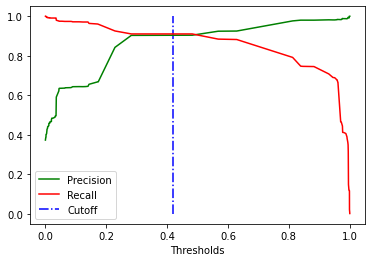

In [306]:
# To plot the Precision, Recall curve
plt.plot(thresholds2, pre2[:-1], "g-", label="Precision")
plt.plot(thresholds2, rec2[:-1], "r-", label="Recall")
plt.xlabel("Thresholds")
plt.vlines(0.42,ymin=0, ymax=1, linestyles='dashdot',label='Cutoff',colors='blue')
plt.legend()
plt.show()


#### Inferences:
- From the above curve, it is clear that $0.42$ is the optimum point to take it as a cutoff probability.

### To Plot the ROC Curve

In [307]:
def draw_roc(actual, probs):
    fpr1, tpr1, thresholds1 = metrics.roc_curve(actual, probs, drop_intermediate = False)
    auc_score = metrics.roc_auc_score(actual, probs)
    plt.figure(figsize=(8, 8))
    plt.plot(fpr1, tpr1, label='ROC curve (area = %0.2f)' % auc_score)
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()

    return None


In [308]:
fpr1, tpr1, thresholds1 = metrics.roc_curve(y_test_pred_final.Converted, y_test_pred_final.Converted_Prob, drop_intermediate = False)


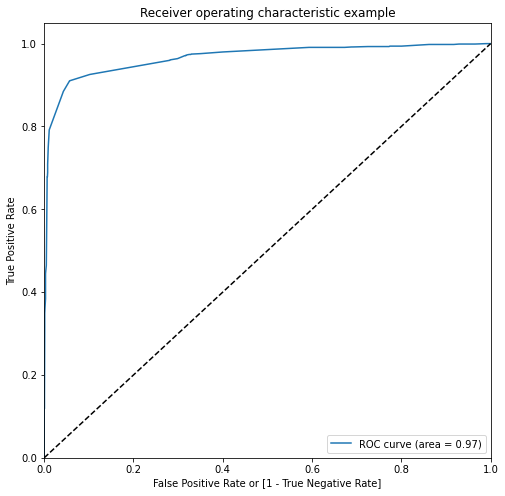

In [309]:
# To draw ROC Curve
draw_roc(y_test_pred_final.Converted, y_test_pred_final.Converted_Prob)


##### Inferences
- Area under the ROC Curve for Predicated data is $97$%.

### Step 12. Assign Lead Score


In [310]:
#lead scores of training data
y_train_pred_final['Lead Score']=round(y_train_pred_final['Converted_Prob']*100,2)


In [311]:
# To see head 
y_train_pred_final.head()


,Converted,Converted_Prob,Prospect_ID,Predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,final_predicted,Lead Score
0,1,0.961066,6676,1,1,1,1,1,1,1,1,1,1,1,1,96.11
1,1,0.994982,6138,1,1,1,1,1,1,1,1,1,1,1,1,99.50
2,1,0.961066,8650,1,1,1,1,1,1,1,1,1,1,1,1,96.11
3,0,0.035676,3423,0,1,0,0,0,0,0,0,0,0,0,0,3.57
4,0,0.174181,6552,0,1,1,0,0,0,0,0,0,0,0,0,17.42


In [312]:
# lead scores for testing data
y_test_pred_final['Lead Score'] = round(y_test_pred_final['Converted_Prob']*100,2)


In [313]:
# To check test data head for lead score
y_test_pred_final


,Prospect_ID,Converted,Converted_Prob,Final_predicted,Lead Score
0,7625,0,0.007520,0,0.75
1,5207,1,0.961066,1,96.11
2,2390,1,0.998862,1,99.89
3,4362,0,0.036564,0,3.66
4,1023,0,0.015356,0,1.54
5,8226,1,0.961066,1,96.11
6,3079,0,0.174181,0,17.42
7,530,0,0.007520,0,0.75
8,7873,0,0.035676,0,3.57
9,5146,1,0.994982,1,99.50


In [314]:
# To get complete leadscores of train and test data.
Score = pd.concat([y_train_pred_final, y_test_pred_final], ignore_index=True)['Lead Score']


In [315]:
# To check the complete data set
Score.head()


0    96.11
1    99.50
2    96.11
3     3.57
4    17.42
Name: Lead Score, dtype: float64

In [316]:
# To check the shape of the dataframe
Score.shape


(8924,)

In [317]:
# To check the shape of the dataframe
X_leads_1.shape


(8924, 15)

In [318]:
# To check the variables 
X_leads_1.head()


,Prospect ID,Lead Origin,Lead Source,Do Not Email,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Last Activity,Specialization,What is your current occupation,Tags,City,A free copy of Mastering The Interview,Last Notable Activity
0,7927b2df-8bba-4d29-b9a2-b6e0beafe620,API,Olark Chat,No,0,0.0,0,0.0,Page Visited on Website,Others,Unemployed,Interested in other courses,Not Specified,No,Modified
1,2a272436-5132-4136-86fa-dcc88c88f482,API,Organic Search,No,0,5.0,674,2.5,Email Opened,Others,Unemployed,Ringing,Not Specified,No,Email Opened
2,8cc8c611-a219-4f35-ad23-fdfd2656bd8a,Landing Page Submission,Direct Traffic,No,1,2.0,1532,2.0,Email Opened,Business Administration,Student,Will revert after reading the email,Mumbai,Yes,Email Opened
3,0cc2df48-7cf4-4e39-9de9-19797f9b38cc,Landing Page Submission,Direct Traffic,No,0,1.0,305,1.0,Unreachable,Media and Advertising,Unemployed,Ringing,Mumbai,No,Modified
4,3256f628-e534-4826-9d63-4a8b88782852,Landing Page Submission,Google,No,1,2.0,1428,1.0,Converted to Lead,Others,Unemployed,Will revert after reading the email,Mumbai,No,Modified


In [319]:
# Create new dataframe from previous one.
X_leads_Score = X_leads_1.copy(deep=True)


In [320]:
# To add new columns to the dataframe
X_leads_Score['Lead Score'] = Score


In [321]:
# To check the dataframe heads and their values
X_leads_Score.head()


,Prospect ID,Lead Origin,Lead Source,Do Not Email,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Last Activity,Specialization,What is your current occupation,Tags,City,A free copy of Mastering The Interview,Last Notable Activity,Lead Score
0,7927b2df-8bba-4d29-b9a2-b6e0beafe620,API,Olark Chat,No,0,0.0,0,0.0,Page Visited on Website,Others,Unemployed,Interested in other courses,Not Specified,No,Modified,96.11
1,2a272436-5132-4136-86fa-dcc88c88f482,API,Organic Search,No,0,5.0,674,2.5,Email Opened,Others,Unemployed,Ringing,Not Specified,No,Email Opened,99.50
2,8cc8c611-a219-4f35-ad23-fdfd2656bd8a,Landing Page Submission,Direct Traffic,No,1,2.0,1532,2.0,Email Opened,Business Administration,Student,Will revert after reading the email,Mumbai,Yes,Email Opened,96.11
3,0cc2df48-7cf4-4e39-9de9-19797f9b38cc,Landing Page Submission,Direct Traffic,No,0,1.0,305,1.0,Unreachable,Media and Advertising,Unemployed,Ringing,Mumbai,No,Modified,3.57
4,3256f628-e534-4826-9d63-4a8b88782852,Landing Page Submission,Google,No,1,2.0,1428,1.0,Converted to Lead,Others,Unemployed,Will revert after reading the email,Mumbai,No,Modified,17.42


#### Inferences:
- Lead Score has been assigned to leads according to their Conversion Probability. Highest conversion leads given higher Lead Score and like wise Lower Conversion leads to lower Lead Score.


#### Making Predictions on features

In [323]:
# Selecting the coefficients of the selected features from our final model excluding the intercept
pd.options.display.float_format = '{:.2f}'.format
new_leads_features = leads_res.params[1:]
new_leads_features


Lead Source_Welingak Website                     3.21
Last Activity_Had a Phone Conversation           4.68
Last Activity_SMS Sent                           2.08
Tags_Already a student                          -3.33
Tags_Closed by Horizzon                          7.00
Tags_Diploma holder (Not Eligible)              -2.59
Tags_Interested  in full time MBA               -1.81
Tags_Interested in other courses                -2.60
Tags_Lost to EINS                                5.90
Tags_Not doing further education                -2.97
Tags_Ringing                                    -3.80
Tags_Will revert after reading the email         4.76
Tags_invalid number                             -3.97
Tags_opp hangup                                 -3.38
Tags_switched off                               -4.39
City_Not Specified                               1.49
Last Notable Activity_Modified                  -1.74
Last Notable Activity_Olark Chat Conversation   -1.50
dtype: float64

In [324]:
# To get a relative coeffient value for all the features with respect to the features with the highest coefficient
leads_feature = new_leads_features
leads_feature = 100.0 * (leads_feature / leads_feature.max())
leads_feature


Lead Source_Welingak Website                     45.82
Last Activity_Had a Phone Conversation           66.86
Last Activity_SMS Sent                           29.78
Tags_Already a student                          -47.54
Tags_Closed by Horizzon                         100.00
Tags_Diploma holder (Not Eligible)              -36.97
Tags_Interested  in full time MBA               -25.88
Tags_Interested in other courses                -37.23
Tags_Lost to EINS                                84.31
Tags_Not doing further education                -42.50
Tags_Ringing                                    -54.30
Tags_Will revert after reading the email         68.07
Tags_invalid number                             -56.73
Tags_opp hangup                                 -48.26
Tags_switched off                               -62.81
City_Not Specified                               21.26
Last Notable Activity_Modified                  -24.88
Last Notable Activity_Olark Chat Conversation   -21.49
dtype: flo

In [325]:
# To sort the features based on their relative coefficient values
leads_sorted_idx = np.argsort(leads_feature,kind='quicksort', order='list of str')
leads_sorted_idx


Lead Source_Welingak Website                     14
Last Activity_Had a Phone Conversation           12
Last Activity_SMS Sent                           10
Tags_Already a student                           13
Tags_Closed by Horizzon                           3
Tags_Diploma holder (Not Eligible)                9
Tags_Interested  in full time MBA                 7
Tags_Interested in other courses                  5
Tags_Lost to EINS                                 6
Tags_Not doing further education                 16
Tags_Ringing                                     17
Tags_Will revert after reading the email         15
Tags_invalid number                               2
Tags_opp hangup                                   0
Tags_switched off                                 1
City_Not Specified                               11
Last Notable Activity_Modified                    8
Last Notable Activity_Olark Chat Conversation     4
dtype: int64

#### Scree Plot:
- It is a line plot of the eigenvalues of factors/principal components in an analysis. 
- It is used to determine the number of factors to retain in an exploratory factor analysis (FA)/ principal components to keep in a principal component analysis (PCA).


<Figure size 576x648 with 0 Axes>

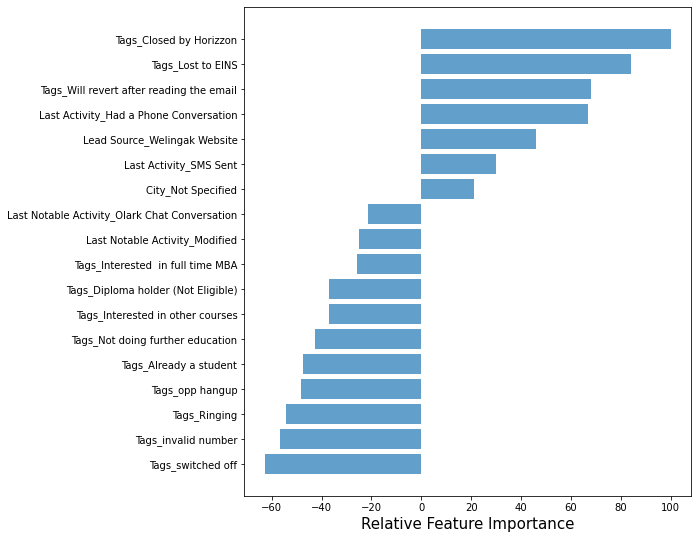

In [326]:
# Plot the feature variables based on their relative coefficient values

fig = plt.figure(figsize = (8,9))
leads_pos = np.arange(leads_sorted_idx.shape[0]) + .2

featfig = plt.figure(figsize=(8,9))
featax = featfig.add_subplot(1, 1, 1)
featax.barh(leads_pos, leads_feature[leads_sorted_idx], align='center', color = 'tab:blue',alpha=0.7)

featax.set_yticks(leads_pos)
featax.set_yticklabels(np.array(X_train[col_leads].columns)[leads_sorted_idx], fontsize=10)
featax.set_xlabel('Relative Feature Importance', fontsize=15)

plt.show()


### Inferences
- With the help of above graph it is clear that some variables like 
- 'Last Activity_SMS Sent', 'Lead Source_Welingak Website', Last_Activity_Had a Phone Conversion', 'Tags_Will revert after readig the email', 'Tags_Lost to EINS', 'Tags_Closed by Horizzon', has positive affects on lead conversion.
- Whereas Last Notable Activity_Olark Chat Conversation','Last Notable Activity_Modified' and few other variables has negative impact. Therefore company needs to taken care about these variables by taking the respective action to incerease the lead conversion.
- Few other variables has negative impact on lead conversion therfore we need to reduce their frequency or value or taking respective action to increase the lead conversion.

### Observations:


### Comparision on Train and Test data

##### Train Data:
- Accuracy - 91.9%
- Sensitivity - 86%
- Specificity - 96%
- False Positive Rate - 4%
- Positive Predictive Value - 92%
- Negative Predictive Value - 92%

##### Test Data: 

- Accuracy : 93%
- Sensitivity : 91%
- Specificity : 94%
- False Positive Rate - 6%
- Positive Predictive Value - 90%
- Negative Predictive Value - 95%


#### Area Under the Curve of ROC
- ROC on Train Data: 91%

- ROC on Test Data:  97%

### Outcomes

- The Logistic Regression Model predicted the Conversion Rate preety well with a good and stable accuracy upto 93%.
- Overall model is stable and having higher accuracy of nearly 92% for Train data and 93% for Test data, whereas AUC of ROC is 91% and 97% respectively.
- Final Cut-Off point is at 0.42, which has highest probability for Hot leads.
- Assigned lead score make easy to discreminate between Hot leads and other leads, which may increase the business of the company.


### Recommendations

X Education Company should work on the following aspects to improve the overall lead conversion:--


- Should increase sending SMS as it helps to increase the conversion rate, becuase it has higher conversion ratio.
- Increase leads/users time on the Welingak website as it also improve the conversion rate.
- Increase Phone Conversation with the leads as it helps to know the customer in a more better way and chances of lead conversion has been increased. This activity also has higher conversion ratio.
- Enhance Olark Chat Conversation as it is affecting the lead conversion ratio negatively.
- Leads which has tag of 'Lost to EINS', 'Will revert after reading the email', and 'Closed by Horizzon' has higher conversion ratio, therefore company should consider these tags.
- Although most of the leads come from Google, and Direct Traffic but still the leads conversion ratio is highest for the leads come from 'Reference', and Welingak Website. Therefore company should consider these parameters to generate Hot leads.
- Lead conversion is highest when lead originated from 'Lead Add Form', therefore company should increase leads time on the website by engaging them via multiple Activity forms.
- Most of the leads come from Unemployed persons but the convesion ratio is very less, whereas conversion ratio of 'Working Professional' is very high therfore compay should emphasise on such leads more.
- Although maximum leads are from 'Mumbai' itself but the conversion ratio is higher in 'Tier-II' city, therefore company should focus on those citites more.


### ***End of Logistic Regression X-Education Sells***